In [86]:
from __future__ import division
import pandas as pd
import numpy as np
import nltk
import string
import re
import os
from os import path
from PIL import Image
from time import sleep
from collections import Counter
from nltk.classify import NaiveBayesClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import matplotlib.pyplot as plt
from wordcloud import WordCloud


In [87]:
df=pd.read_csv(r'C:\Users\ananyya srivastava\Desktop\bjpfull.csv',header=None)

In [88]:
df.head()

,0,1,2
0,1101270092166369280,2019-02-28 23:57:05,RT @MirMAKOfficial: #BJP Party Karnataka Chief...
1,1101269234196402176,2019-02-28 23:53:40,RT @Hariindic: #BJP IT Wing gears up for #Gene...
2,1101269011101302784,2019-02-28 23:52:47,RT @hd_kumaraswamy: The entire nation is unite...
3,1101268910656040961,2019-02-28 23:52:23,RT @SATAVRAJEEV: The Freefall of the GDP refle...
4,1101268162622849024,2019-02-28 23:49:25,Where is the Rafale topic gone?When it is most...


In [89]:
df = df.rename(columns={0: 'user_id', 1: 'Time',2:'Tweets'})
df.columns


Index(['user_id', 'Time', 'Tweets'], dtype='object')

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22818 entries, 0 to 22817
Data columns (total 3 columns):
user_id    22818 non-null int64
Time       22818 non-null object
Tweets     22818 non-null object
dtypes: int64(1), object(2)
memory usage: 534.9+ KB


In [91]:
df.tail()

,user_id,Time,Tweets
22813,1098399139170181121,2019-02-21 01:48:56,RT @GauravDahiyaYT: One of the best media port...
22814,1098397780656050176,2019-02-21 01:43:32,Dr. Nandini Sharma - A BJP leader shows how se...
22815,1098393176929296386,2019-02-21 01:25:15,RT @kjsehrawat: Had the opportunity to interac...
22816,1098381520639836160,2019-02-21 00:38:56,RT @ImSaiyid: #AmitShah has finally accepted t...
22817,1098368055858483200,2019-02-20 23:45:25,RT @firstpost: #Arvind Kejriwal claimed #AAP l...


In [92]:
df.count()

user_id    22818
Time       22818
Tweets     22818
dtype: int64

In [93]:
from functools import reduce

In [94]:
to_drop=['user_id','Time']

In [95]:
df.drop(to_drop,inplace=True,axis=1)

In [96]:
df.head()

,Tweets
0,RT @MirMAKOfficial: #BJP Party Karnataka Chief...
1,RT @Hariindic: #BJP IT Wing gears up for #Gene...
2,RT @hd_kumaraswamy: The entire nation is unite...
3,RT @SATAVRAJEEV: The Freefall of the GDP refle...
4,Where is the Rafale topic gone?When it is most...


In [97]:
df.tail()

,Tweets
22813,RT @GauravDahiyaYT: One of the best media port...
22814,Dr. Nandini Sharma - A BJP leader shows how se...
22815,RT @kjsehrawat: Had the opportunity to interac...
22816,RT @ImSaiyid: #AmitShah has finally accepted t...
22817,RT @firstpost: #Arvind Kejriwal claimed #AAP l...


In [98]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\ananyya
[nltk_data]     srivastava\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [99]:
import string
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 

In [100]:
stop_words = set(stopwords.words('english'))

In [101]:
stop = stopwords.words('english') 

In [102]:
df['text-filtered'] = ""
word_tokens = word_tokenize(df['Tweets'][1])
filtered_sentence = [w for w in word_tokens if not w in stop_words] 
df['text-filtered'][1] = filtered_sentence
df['text-filtered'][1]

['RT',
 '@',
 'Hariindic',
 ':',
 '#',
 'BJP',
 'IT',
 'Wing',
 'gears',
 '#',
 'GeneralElections2019',
 '.',
 '6000',
 'What',
 "'s",
 'app',
 'groups,700',
 'Facebook',
 'pages,45',
 'Youtube',
 'channel',
 ',',
 '100',
 'Voulteers…']

In [103]:
print (stopwords.words())

['إذ', 'إذا', 'إذما', 'إذن', 'أف', 'أقل', 'أكثر', 'ألا', 'إلا', 'التي', 'الذي', 'الذين', 'اللاتي', 'اللائي', 'اللتان', 'اللتيا', 'اللتين', 'اللذان', 'اللذين', 'اللواتي', 'إلى', 'إليك', 'إليكم', 'إليكما', 'إليكن', 'أم', 'أما', 'أما', 'إما', 'أن', 'إن', 'إنا', 'أنا', 'أنت', 'أنتم', 'أنتما', 'أنتن', 'إنما', 'إنه', 'أنى', 'أنى', 'آه', 'آها', 'أو', 'أولاء', 'أولئك', 'أوه', 'آي', 'أي', 'أيها', 'إي', 'أين', 'أين', 'أينما', 'إيه', 'بخ', 'بس', 'بعد', 'بعض', 'بك', 'بكم', 'بكم', 'بكما', 'بكن', 'بل', 'بلى', 'بما', 'بماذا', 'بمن', 'بنا', 'به', 'بها', 'بهم', 'بهما', 'بهن', 'بي', 'بين', 'بيد', 'تلك', 'تلكم', 'تلكما', 'ته', 'تي', 'تين', 'تينك', 'ثم', 'ثمة', 'حاشا', 'حبذا', 'حتى', 'حيث', 'حيثما', 'حين', 'خلا', 'دون', 'ذا', 'ذات', 'ذاك', 'ذان', 'ذانك', 'ذلك', 'ذلكم', 'ذلكما', 'ذلكن', 'ذه', 'ذو', 'ذوا', 'ذواتا', 'ذواتي', 'ذي', 'ذين', 'ذينك', 'ريث', 'سوف', 'سوى', 'شتان', 'عدا', 'عسى', 'عل', 'على', 'عليك', 'عليه', 'عما', 'عن', 'عند', 'غير', 'فإذا', 'فإن', 'فلا', 'فمن', 'في', 'فيم', 'فيما', 'فيه', 'فيها', '

In [104]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to C:\Users\ananyya
[nltk_data]     srivastava\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [105]:
import re

In [106]:
from nltk.stem.snowball import SnowballStemmer 

In [107]:
def text_to_wordlist(text, remove_stopwords=False, stem_words=False):
    # Clean the text, with the option to remove stopwords and to stem words.
    # Convert words to lower case and split them
    text = text.lower().split()
    # Optionally, remove stop words
    if remove_stopwords:
        stops = set(stopwords.words("english"))
        text = [w for w in text if not w in stops]
    text = " ".join(text)
    # Clean the text
    text = re.sub(r"[^A-Za-z0-9^,!.\/'+-=]", " ", text)
    text = re.sub(r"what's", "what is ", text)
    text = re.sub(r"\'s", " ", text)
    text = re.sub(r"\'ve", " have ", text)
    text = re.sub(r"can't", "cannot ", text)
    text = re.sub(r"n't", " not ", text)
    text = re.sub(r"i'm", "i am ", text)
    text = re.sub(r"\'re", " are ", text)
    text = re.sub(r"\'d", " would ", text)
    text = re.sub(r"\'ll", " will ", text)
    text = re.sub(r",", " ", text)
    text = re.sub(r"\.", " ", text)
    text = re.sub(r"!", " ! ", text)
    text = re.sub(r"\/", " ", text)
    text = re.sub(r"\^", " ^ ", text)
    text = re.sub(r"\+", " + ", text)
    text = re.sub(r"\-", " - ", text)
    text = re.sub(r"\=", " = ", text)
    text = re.sub(r"'", " ", text)
    text = re.sub(r"(\d+)(k)", r"\g<1>000", text)
    text = re.sub(r":", " : ", text)
    text = re.sub(r" e g ", " eg ", text)
    text = re.sub(r" b g ", " bg ", text)
    text = re.sub(r" u s ", " american ", text)
    text = re.sub(r"\0s", "0", text)
    text = re.sub(r" 9 11 ", "911", text)
    text = re.sub(r"e - mail", "email", text)
    text = re.sub(r"j k", "jk", text)
    text = re.sub(r"\s{2,}", " ", text)
    

In [108]:
for i in df.Tweets:
    print (i) 

RT @MirMAKOfficial: #BJP Party Karnataka Chief Says: 

#Indian air strikes should make us win 22 out of 28 seats in elections. 

THE CAT IS…
RT @Hariindic: #BJP IT Wing gears up for #GeneralElections2019.
6000 What's app groups,700 Facebook pages,45 Youtube channel, 100 Voulteers…
RT @hd_kumaraswamy: The entire nation is united in supporting the central govt&amp;our armed forces to fight terrorism,while #Bjp leader @BSYBJ…
RT @SATAVRAJEEV: The Freefall of the GDP reflects the true state of affairs in #BJP
Rule.The economy has plummeted further &amp; the core secto…
Where is the Rafale topic gone?When it is most needed #congress #Rahulgandhi stop talking about this. 
Are they rea… https://t.co/ngXwg12jJZ
RT @JhaSanjay: You are wrong. The message has emerged from the top. Amit Shah has been campaigning relentlessly asking for votes himself. H…
RT @NEWS9TWEETS: #BIGNEWS: #BJP chief #BSYeddyurappa says the #IAF attack on terror camps will help #BJP win 22 out of 28 #LokSabha seats i…
@Bhit

RT @varnishant: #India #Bharat please share this Request from a #Fauji Family to #Modi #BJP
#SayNoToWar #IndiaPakistan #Kashmiris #IndoPak…
RT @DrAMSinghvi: Difference Between @INCIndia &amp; @BJP4India 
#Congress-- #NationFirst
#BJP-- #ElectionFirst.    

#MeraJawanSabseMajboot #Ab…
RT @Irshad_8055: After #Surgicalstrike2 the #BJP government was taking all the credit..
When #AbhinandanVarthaman was caught in Pakistan sa…
RT @dpradhanbjp: Joined @BJP4Odisha karyakartas &amp; beneficiaries of various welfare schemes of #ModiGovt in the #BJPKamalJyoti program and l…
RT @DrAMSinghvi: Difference Between @INCIndia &amp; @BJP4India 
#Congress-- #NationFirst
#BJP-- #ElectionFirst.    

#MeraJawanSabseMajboot #Ab…
Brahmin individuals targeted
#RSS sarsanghachalac
Brahmin have nothing to do with
anti brahmin #bjp bioterrorist
bi… https://t.co/bkAoVtqXxd
RT @Ahmedshabbir20: Brilliant...this is exactly what #BJP has been doing ever since #PulwamaAttack

Their only concern is Elections...
 htt…
RT

@drdelusional Why should I defend? You tried to attribute a motive to my view &amp; asked a absurd &amp; irrelevant questio… https://t.co/iyQksCovy2
RT @MirMAKOfficial: #BJP Party Karnataka Chief Says: 

#Indian air strikes should make us win 22 out of 28 seats in elections. 

THE CAT IS…
RT @ZubairSabirPTI: Indian voters must see how #BJP is using war as a weapon to get more seats. Modi will sell every #Indian to win 2nd ter…
RT @DrAMSinghvi: Difference Between @INCIndia &amp; @BJP4India 
#Congress-- #NationFirst
#BJP-- #ElectionFirst.    

#MeraJawanSabseMajboot #Ab…
RT @KhanAmanatullah: Loyalty to country ALWAYS. Loyalty to government ?, when it deserves it. @narendramodi  failed in  national security a…
RT @DrAMSinghvi: Difference Between @INCIndia &amp; @BJP4India 
#Congress-- #NationFirst
#BJP-- #ElectionFirst.    

#MeraJawanSabseMajboot #Ab…
RT @JhaSanjay: You are wrong. The message has emerged from the top. Amit Shah has been campaigning relentlessly asking for votes himself. 

RT @VinodSharmaView: In Karnataka @BSYBJP projects victory for @BJP4India in the upcoming polls on account of #IAFStrikesBalakot. Is it abo…
RT @PALLAVI80715152: Releasing #KamalJyoti magazine to mark Ist anniv of #BJP-led #NDAgovernment. Heartening as editor of publ https://t.co…
RT @JhaSanjay: The #BJP makes me hang my head in shame. These guys have no principles. They are crude. They are vulgar. “Air strike will he…
RT @Ahmedshabbir20: Brilliant...this is exactly what #BJP has been doing ever since #PulwamaAttack

Their only concern is Elections...
 htt…
RT @JhaSanjay: The #BJP makes me hang my head in shame. These guys have no principles. They are crude. They are vulgar. “Air strike will he…
RT @JhaSanjay: The #BJP makes me hang my head in shame. These guys have no principles. They are crude. They are vulgar. “Air strike will he…
RT @Actor_Siddharth: A loathsome individual who sells manipulation. #Pakistan is not at odds with #BJP. Our soldiers are not dying for #BJP…
RT @ET2047: #

#bbcnews #cnn #un #brexit #indiastrikesback #indiastrikespakistan #bjp #ndtv #indiasalutesmartyrs #surgicalstrike2… https://t.co/ta3Bgai59d
Dear #UrbanMoron 

The terrorism is being fought in the cloak of #BJP's #nationalism agenda.

#IndiaStrikesBack https://t.co/7BMQ4tFJew
RT @HridaynarayanD: Releasing #KamalJyoti magazine to mark Ist anniv of #BJP-led #NDAgovernment. Heartening as editor of publ http://t.co/4…
RT @abhivrudhikosam: I support war againist #Pakistan 
If our PM @narendramodi stand in front of our Indian Army during war....and those #B…
RT @dpradhanbjp: Joined @BJP4Odisha karyakartas &amp; beneficiaries of various welfare schemes of #ModiGovt in the #BJPKamalJyoti program and l…
RT @HereWorks: #1ShotNews

“Adani Group wins the Bid to operate 5 Airports in India”

#EzhaiThayinMagan #Adani #AdaniGroup #EverythingWorks…
RT @dpradhanbjp: Joined @BJP4Odisha karyakartas &amp; beneficiaries of various welfare schemes of #ModiGovt in the #BJPKamalJyoti program and l…
RT @ThOIOff

RT @KarnatakaPMC: Glimpses of the #MahilaAdhikaarYatraKarnataka that began now at Mangalore DCC office. Women gathered in large numbers to…
RT @PALLAVI80715152: Releasing #KamalJyoti magazine to mark Ist anniv of #BJP-led #NDAgovernment. Heartening as editor of publ https://t.co…
RT @DefencedotPak: In aftermath of fake #Indian strike, once again, apparently #Modi propaganda cell is flooding internet with fake picture…
It is perfectly patriotic and fine to support the armed forces for doing a great job and still choose to not vote f… https://t.co/dALDL76BhR
RT @DefencedotPak: In aftermath of fake #Indian strike, once again, apparently #Modi propaganda cell is flooding internet with fake picture…
@AdityaRajKaul The Media does their job in Pakistan not like you who spread propaganda of #BJP ...
RT @DefencedotPak: In aftermath of fake #Indian strike, once again, apparently #Modi propaganda cell is flooding internet with fake picture…
RT @PALLAVI80715152: Releasing #KamalJyoti magazine to m

If only @PMModiIN keeps calm and quiet and not jump the gun to claim political gains - that is! This is #Indian Arm… https://t.co/8YXHwsJGoF
RT @mytentaran: @DrAVSriv Inauguration of National War Memorial by Hon’ble PM Modi

https://t.co/4hlA8awaeS

#NationalWarMemorial  @PMOIndi…
RT @Jago_Bharath: #KanganaRanaut urges PM @narendramodi to scrap Article 370 that grants special status to Jammu &amp; Kashmir. DO YOU AGREE ?…
RT @ameetasinh: Never nationalists but now consider themselves to be the proprietors of nationalism in India! Yet are now using the valour…
RT @yuvadesh: Statutory Warning!!! ⚠️⚠️⚠️⚠️⚠️
#NarendraModi #Modi #ModiLies #modilollipops #BJPChor100Crore #BJP #BJPfails #RSS #BJP_भगाओ_…
RT @yuvadesh: The condition of Indian Economy under #ModiGovt can be described by this image.
#ModiDestroyedIndianEconomy #VikasEkDhokaHai…
RT @sivaetb: #AIADMK after the death of its charismatic leader #Jayalalithaa and the decline of the party that she nurtured . My take on th…
RT @bsindia: 

#bajrangdal leader's brother believed to have abducted and killed two young children in MP. The gruesome deed was c… https://t.co/SmyqnHXhr4
RT @Shormistha2: Jaish-e-Mohammad (JeM) is being controlled by Pakistan . There is no doubt about Pakistan’s involvement: Lt Gen KJS Dhillo…
RT @ians_india: #BJP President #AmitShah on Feb 15 condemned the #PulwamaTerrorAttack that left 45 #CRPF personnel dead and called upon to…
RT @khushal25456075: #NarendraModi 
#AmitShah 
#RajnathSingh 
#NirmalaSitharaman 
#nitingadkari #BJP
#pmoindia ache din https://t.co/ySBKJO…
Disappointed at being ignored in #BJP-#ShivSena alliance: #RamdasAthawale
https://t.co/pInOV1jude
RT @mailvickykv: There will b no #MannKiBaat in march and April. I will come back in d last Sunday of May and #MannKiBaat will b continue f…
RT @Skant1968: India said no to tomatoes. 
Pak media said we have atom bomb. 
Atombomb shocked against tomatobumb. 
#news
#modig
#bjp
#amit…
RT @khushal25456075: #NarendraModi 
#AmitShah 
#RajnathSi

@AmitShah sir. Please include this in your manifesto before 2019 elections. #bjp #manifesto2019… https://t.co/RsCWnwtGPQ
RT @drshamamohd: Impossible things made possible by #BJP- 

Bringing Unemployment to a 45 year high.

Destroying the economy in a single il…
RT @rkbnow: B4 #AAP's unbelieveable victory every #BJP leader announced full statehood for Delhi with Delhi Police under State Control!
And…
RT @Hariindic: Today -  Maasi Magam Pournami, then most auspicious day. 

And as per hindu calendar, today s Amma's birthday.  #AIADMK plan…
RT @WomensPowerCen: #India Poetry like prose style site:Big #victory for #BJP gov in #UttarPradesh ?globally imp https://t.co/RDSbEsQ6ur ht…
#India Poetry like prose style site:Big #victory for #BJP gov in #UttarPradesh ?globally imp https://t.co/RDSbEsQ6ur https://t.co/XqShkk2gT6
RT @TopMostShop: #Delhi Knowledge is Power site: #UttarPradesh gave #big win to #BJP Will it change #India https://t.co/yKILL11gPq https://…
RT @drshamamohd: Impossible thing

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [109]:
df1=pd.read_csv(r'C:\Users\ananyya srivastava\Desktop\bjpmar.csv',header=None,names=['ID','Date','Tweets'])

In [110]:
df1


,ID,Date,Tweets
0,1103807328237740032,2019-03-07 23:59:09,RT @AbdulWahidSait: What better depiction of m...
1,1103807308142907392,2019-03-07 23:59:04,@PDCMDOfficial's account has been withheld in ...
2,1103806632323014656,2019-03-07 23:56:23,RT @Actor_Siddharth: The #BJP will milk #Pulwa...
3,1103806387438739456,2019-03-07 23:55:25,@otvnews Important HASH TAG missed - #BJP #CRI...
4,1103806338411290625,2019-03-07 23:55:13,"RT @drshamamohd: After Uri, PM #Modi said ther..."
5,1103806179682115585,2019-03-07 23:54:35,@republic #ProPakMatchFixers ask your self......
6,1103805490251755520,2019-03-07 23:51:51,"After Uri, PM #Modi said there won't be any mo..."
7,1103803821195616256,2019-03-07 23:45:13,RT @KirolaLalit: Thats a support coming from u...
8,1103803194717687808,2019-03-07 23:42:43,What's happening in #india ?? \n#BJP \n#Congre...
9,1103802631158484992,2019-03-07 23:40:29,RT @doamuslims: Muslim youth was attacked by #...


In [111]:
con_data=pd.concat([df,df1],ignore_index=True,sort=True)

In [112]:
con_data=con_data[['Tweets']]

In [113]:
con_data

,Tweets
0,RT @MirMAKOfficial: #BJP Party Karnataka Chief...
1,RT @Hariindic: #BJP IT Wing gears up for #Gene...
2,RT @hd_kumaraswamy: The entire nation is unite...
3,RT @SATAVRAJEEV: The Freefall of the GDP refle...
4,Where is the Rafale topic gone?When it is most...
5,RT @JhaSanjay: You are wrong. The message has ...
6,RT @NEWS9TWEETS: #BIGNEWS: #BJP chief #BSYeddy...
7,@BhittaniKhannnn These are the #supporters of ...
8,RT @Rajievku: @godavar @BabaGlocal As a #Bjp h...
9,RT @PradzWorLd2020: @bronzmash @IamSourav_b Un...


In [114]:
con_data['pre_clean_len'] = [len(t) for t in con_data.Tweets]

In [115]:
con_data

,Tweets,pre_clean_len
0,RT @MirMAKOfficial: #BJP Party Karnataka Chief...,140
1,RT @Hariindic: #BJP IT Wing gears up for #Gene...,140
2,RT @hd_kumaraswamy: The entire nation is unite...,144
3,RT @SATAVRAJEEV: The Freefall of the GDP refle...,144
4,Where is the Rafale topic gone?When it is most...,140
5,RT @JhaSanjay: You are wrong. The message has ...,140
6,RT @NEWS9TWEETS: #BIGNEWS: #BJP chief #BSYeddy...,140
7,@BhittaniKhannnn These are the #supporters of ...,140
8,RT @Rajievku: @godavar @BabaGlocal As a #Bjp h...,140
9,RT @PradzWorLd2020: @bronzmash @IamSourav_b Un...,144


In [116]:
con_data[con_data.pre_clean_len > 140]

,Tweets,pre_clean_len
2,RT @hd_kumaraswamy: The entire nation is unite...,144
3,RT @SATAVRAJEEV: The Freefall of the GDP refle...,144
9,RT @PradzWorLd2020: @bronzmash @IamSourav_b Un...,144
20,RT @DrAMSinghvi: Difference Between @INCIndia ...,144
27,RT @JayGalla: #BJP &amp; YSRCP celebrate as #A...,148
29,RT @DrAMSinghvi: Difference Between @INCIndia ...,144
32,@JayGalla Congress government divided our stat...,144
38,RT @DrAMSinghvi: Difference Between @INCIndia ...,144
43,RT @hd_kumaraswamy: The entire nation is unite...,144
56,RT @JayGalla: #BJP &amp; YSRCP celebrate as #A...,148


In [194]:
#dict={'&lt;':'<',"&gt;":'>',"&amp;":'&',"&quot":'"','&apos':"'","\n":'',"RT":''}
r="0"
while True:
    org=input('Original: ');
    rep=input('Replace:');
    data3['Tweet'].replace(regex=True,inplace=True,to_replace=org,value=rep);
    g=input('To finish , press 0. To continue press else: ');
    if g==r:
        break;

Original: aiadmk
Replace:
To finish , press 0. To continue press else: 0


In [120]:
con_data[u'Tweets']=con_data[u'Tweets'].replace(r'https\S+','',regex=True)
con_data[u'Tweets']=con_data[u'Tweets'].replace(r't.co\S+','',regex=True)
con_data[u'Tweets']=con_data[u'Tweets'].replace(r'@\S+','',regex=True)

In [121]:
con_data['Tweets']=con_data['Tweets'].str.lower()

In [122]:
#Random Sampling of the data
con_data.sample(20)

,Tweets,pre_clean_len
3330,rt merajawansabsemajboot\nwhen indians are wo...,140
1325,rt bjp &amp; ysrcp celebrate as ap shochanged...,148
14289,rt bhakts were fooled by official videos like...,140
14974,rt bjp parivar initiated meraparivarbhajapapa...,140
19880,rt a warm welcome to the real hero of surgica...,140
20093,rt rt rt rt rt india had been referred to...,140
33777,rt this is happening in jangpura today. a pro...,144
12661,rt demanding imposition of president’s rule i...,140
10900,"rt this was not a surgical strike, it was a f...",140
10409,rt releasing kamaljyoti magazine to mark ist ...,140


In [123]:
con_data.Tweets[17259]

'rt  this is what they do! \none dives attention and the other paner robs !! got it india!!?\nrahulgandhi india congress…'

In [124]:
con_data['Tweets']=con_data['Tweets'].str.strip()

In [125]:
con_data

,Tweets,pre_clean_len
0,rt bjp pay karnataka chief says: \n\nindian a...,140
1,rt bjp it wing gears up for generalelections2...,140
2,rt the entire nation is united in suppoing th...,144
3,rt the freefall of the gdp reflects the true ...,144
4,where is the rafale topic gone?when it is most...,140
5,rt you are wrong. the message has emerged fro...,140
6,rt bignews: bjp chief bsyeddyurappa says the ...,140
7,these are the suppoers of bjp govt of india \n...,140
8,"rt as a bjp hating bengali, my biggest nigh...",140
9,"rt unless you do,find some courage,to quest...",144


In [126]:
#con_data['Tweet'] = con_data['Tweet'].str.replace('[^\w\s#@/:%.,_-]', '', flags=re.UNICODE)

In [127]:
con_data['pre_clean_len'] = [len(t) for t in con_data.Tweets]

In [128]:
con_data[con_data.pre_clean_len < 10]

,Tweets,pre_clean_len
316,,0
398,,0
677,when…,5
1013,abwfraud,8
1327,,0
1356,rt,2
1624,,0
2027,movie bjp,9
2180,bjp pay,7
3061,,0


In [129]:
con_data['Tweets']=con_data[con_data['Tweets'].map(len) > 5]

In [130]:
con_data.dropna(inplace=True)

In [131]:
con_data=con_data.reset_index(drop=True)

In [132]:
con_data

,Tweets,pre_clean_len
0,rt bjp pay karnataka chief says: \n\nindian a...,120
1,rt bjp it wing gears up for generalelections2...,127
2,rt the entire nation is united in suppoing th...,117
3,rt the freefall of the gdp reflects the true ...,128
4,where is the rafale topic gone?when it is most...,114
5,rt you are wrong. the message has emerged fro...,129
6,rt bignews: bjp chief bsyeddyurappa says the ...,121
7,these are the suppoers of bjp govt of india \n...,81
8,"rt as a bjp hating bengali, my biggest nigh...",107
9,"rt unless you do,find some courage,to quest...",99


In [133]:
con_data['Tweets'].replace(regex=True,inplace=True,to_replace="’",value="'");

In [134]:
con_data

,Tweets,pre_clean_len
0,rt bjp pay karnataka chief says: \n\nindian a...,120
1,rt bjp it wing gears up for generalelections2...,127
2,rt the entire nation is united in suppoing th...,117
3,rt the freefall of the gdp reflects the true ...,128
4,where is the rafale topic gone?when it is most...,114
5,rt you are wrong. the message has emerged fro...,129
6,rt bignews: bjp chief bsyeddyurappa says the ...,121
7,these are the suppoers of bjp govt of india \n...,81
8,"rt as a bjp hating bengali, my biggest nigh...",107
9,"rt unless you do,find some courage,to quest...",99


In [135]:
for i in range(0,28930):
    text=con_data.Tweets[i]
    for word in text.split(): 
        print(word)

rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
bjp
it
wing
gears
up
for
generalelections2019.
6000
what's
app
groups,700
facebook
pages,45
youtube
channel,
100
voulteers…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
the
freefall
of
the
gdp
reflects
the
true
state
of
affairs
in
bjp
rule.the
economy
has
plummeted
fuher
&amp;
the
core
secto…
where
is
the
rafale
topic
gone?when
it
is
most
needed
congress
rahulgandhi
stop
talking
about
this.
are
they
rea…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
bignews:
bjp
chief
bsyeddyurappa
says
the
iaf
attack
on
terror
camps
will
help
bjp
win
22
out
of
28
loksabha
seats
i…
these
are
the
suppoers
of
bjp
govt
of
india
wants
to
"appease"
with
peace
gestu…
rt
as
a
bjp
hating
bengali,
my
biggest
nightmare
is
them
catching
s

for
2
nuclea…
rt
7/14
poli
naïvely
underestimate
the
risk
of
bjp`s
myopic
miscalculation
there
is
no
safe
margin
of
error
for
2
nuclea…
rt
2/14
india
`s
“balakot
baiting”was
less
a
prelude
to
war
&amp;
more
political
posturing
by
a
saffron
brigade
(raw-rss-bjp-vhp…
rt
bjp
&amp;
ysrcp
celebrate
as
ap
shochanged
again.
the
historic
&amp;
profitable
waltair
division
in
vizag
to
be
shut.
passenge…
rt
do
you
want
to
see
modi
as
the
primeminister
again?modipunishespak
nowaterforpakistan
identifyantinationals
pakpremic…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
7/14
poli
naïvely
underestimate
the
risk
of
bjp`s
myopic
miscalculation
there
is
no
safe
margin
of
error
for
2
nuclea…
rt
2/14
india
`s
“balakot
baiting”was
less
a
prelude
to
war
&amp;
more
political
posturing
by
a
saffron
brigade
(raw-rss-bjp-vhp…
rt
7/14
poli
naïvely
underestimate
the
risk
of
bjp`s
myopic
miscalculation
there
is
no
safe
margin
of
error
for


kick
congress
out
of
punjab
loksabhaelections2019
a…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
pakistan
always
intends
to
sit
for
bilateral
tallks
on
leadership
&amp;
diplomatic
level.
indian
response
remains
cold
unfoun…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
release
of
🇮🇳
wing
commander
abhinandan
is
a
great
gesture
by
pakistan
🇵🇰,
diplomatic
slap
on
face
of
india
🇮🇳.
but
its
gi…
sacrifices
have
to
be
made
to
teach
wisdom;
people
of
india
need
to
elect
an
exempla…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
india's


6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
aicle35a:
jammuandkashmir
reservation
(amendment)
ordinance
approved
by
centre.
full
video…
rt
the
freefall
of
the
gdp
reflects
the
true
state
of
affairs
in
bjp
rule.the
economy
has
plummeted
fuher
&amp;
the
core
secto…
tag
narendramodi
in
a
post
and
write,
fci
has
no
space
for
cmr
for
more
rice
procurement
in
haryana…
rt
bignews:
bjp
chief
bsyeddyurappa
clarifies
his
statement,
says
that
his
statement
is
been
taken
out
of
context.
he
adds…
rt
as
i
said
yesterday
shocking
&amp;
shameful
that
in
this
time
of
grave
national
crisis,
bjp
leader
yeddyurappa
says
airstrikes…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt


is
what
it's
sr
leader
yeddiji
says
brazenly.
its…
rt
so
may
i
ask
,
where
did
the
perfectly
rounded
figure
of
300
touted
by
the
bjp
come
from?
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
bjp
today
has
done
a
surgical
strike
on
j&amp;k
legislation,
a
long
standing
wish
of
rss.
with
today's
amendments,
th…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
absurd
!
the
air
strike
will
make
bjp
win
22
seats
in
karnatka.
this
is
what
it's
sr
leader
yeddiji
says
brazenly.
its…
bjp
make
it
big
issue
for
proving
their
nationalism
we
have
to
think
abt
it
where
r
we
going
to.most
antinational…
rt
absurd
!
the
air
strike
will
make
bjp
win
22
seats
in
karnatka.
this
is
what
it's
sr
leader
yeddiji
says
brazenly.
its…
rt
difference
between
&amp;
congress--
nat

so
may
i
ask
,
where
did
the
perfectly
rounded
figure
of
300
touted
by
the
bjp
come
from?
rt
release
of
🇮🇳
wing
commander
abhinandan
is
a
great
gesture
by
pakistan
🇵🇰,
diplomatic
slap
on
face
of
india
🇮🇳.
but
its
gi…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
so
may
i
ask
,
where
did
the
perfectly
rounded
figure
of
300
touted
by
the
bjp
come
from?
rt
bjp
it
wing
gears
up
for
generalelections2019.
6000
what's
app
groups,700
facebook
pages,45
youtube
channel,
100
voulteers…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of

any
help
from
i…
rt
bignews:
cm
hdkumaraswamy
condemns
bjp
leaders
for
politicising
iaf
attack
on
terror
camps,
says
kin
of
our
soldiers
a…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
a
failed
alliance
with
pdp,
rampant
unemployment
in
the
region,
divisive
politics,
demonetisation,
no
govt
jobs
are
all
the…
theek
waise
hi
jaise
bjp
mein
rehna
hai
to
mod…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
humble
request
to
bjp
don'
your
seat
sat
the
cost
of
soldiers
sacrifice
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
⁦
is
as
corrupt
as
the
bjp,
as
is
their
leader
⁦
activists
criticise
rahul's
defence
of
pa…
rt
difference
between
&amp;
congres

not
to
use
indian
army
to
win
seats.
that's
what…
rt
from
loot
by
mining
to
denuding
of
aravalis,
from
soil
&amp;
water
degradation
to
air
pollution,from
failed
waste
managemen…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
misplaced
priorities:
while
congress
cancels
cwc
and
rally,
bjp
goes
ahead
with
pm
modi's
video
conference
merajawansab…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
bjp
&amp;
ysrcp
celebrate
as
ap
shochanged
again.
the
historic
&amp;
profitable
waltair
division
in
vizag
to
be
shut.
passenge…
deshdrohi
why
you
never
be
happy
for
anything
ndtv
bjp
mediahaitomodihai
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
modi
is
using
awkwardly
their
forces
for
their
election
campaign
and
they
are
proven
puppets.
palwamaattack
was
se…
rt
an
army
officer
's
wife
humble
r

not
built
by
bjp
but
who
will
provide
basic
facilities
like
water
,
drainage
system
along
with
it
in
villages?
religion
and
war,
the
only
2
things
that
can
keep
bjp
relevant!!
rt
misplaced
priorities:
while
congress
cancels
cwc
and
rally,
bjp
goes
ahead
with
pm
modi's
video
conference
merajawansab…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
a
failed
alliance
with
pdp,
rampant
unemployment
in
the
region,
divisive
politics,
demonetisation,
no
govt
jobs
are
all
the…
bignews:
bsp
supremo
hit
out
at
pm
over
his
address
to
bjp
workers
through
a
mega
video-…
rt
release
of
🇮🇳
wing
commander
abhinandan
is
a
great
gesture
by
pakistan
🇵🇰,
diplomatic
slap
on
face
of
india
🇮🇳.
but
its
gi

life
catches
up.
rt
welcomebackabhinandan
abhinandanmyhero
true
son
of
our
soil
abhinandan
will
be
back
tomorrow
without
any
help
from
i…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
which
pay
is
the
only
hope
for
tamil
nadu?
admk
bjp
dmdk
pmk
dmk
mkstalin
mkstalin
congress
ttvdhinakaran…
rt
1.
real
rudaalis
2.
farzi
rudaalis
tell
5
differences
between
the
two
pics.
bjp
meraboothsabsemazboot
rt
1.
real
rudaalis
2.
farzi
rudaalis
tell
5
differences
between
the
two
pics.
bjp
meraboothsabsemazboot
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
welcomebackabhinandan
abhinandanmyhero
true
son
of
our
soil
abhinandan
will
be
back
tomorrow
without
any
help
from
i…
rt
after
surgicalstrike2
the
bjp
government
was
taking
all
the
credit..
when
abhinandanvahaman
was
caught
in
pakistan
sa…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
qua

"mahagathbandhan
is
like
mixing
oil
and
water.
after
mixing
neither
the
oil
is
of
use
nor
the
water."-pm
modi
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
so
may
i
ask
,
where
did
the
perfectly
rounded
figure
of
300
touted
by
the
bjp
come
from?
rt
so
may
i
ask
,
where
did
the
perfectly
rounded
figure
of
300
touted
by
the
bjp
come
from?
rt
after
surgicalstrike2
the
bjp
government
was
taking
all
the
credit..
when
abhinandanvahaman
was
caught
in
pakistan
sa…
rt
a
failed
alliance
with
pdp,
rampant
unemployment
in
the
region,
divisive
politics,
demonetisation,
no
govt
jobs
are
all
the…
she
is
upset
she
don't
have
so
many
people
to
hear
to
or
couldn't
pay
to
get
them
to
hear
her
bjp
modioncemore
airstrike
against
pakistan
will
help
bjp
win
more
than
22
lok
sabha
seats
in
karnataka
and
also
hel…
rt
a
failed
alliance
with
pdp,
rampant
unemployment
in
the
region,
divisive
politics,
demonetisation,
no
govt
jobs
are
all
t

modigovt
in
the
bjpkamaljyoti
program
and
l…
bjp
rahulgandhi
congress
should
strongly
protest
saying
no
to
war......india
used
to
be
a
peace
loving
nation....…
how
many
has
bjp
actually
delivered
??
is
there
a
government
site
that'…
.
her
google
is
censored!
it
works
according
to
the
bjp
seo.
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
bjp
shiv
sena
alliance:
maharashtra
seat-sharing
pact:
bjp
to
contest
25,
sena
23
seats
in
lok
sabha
election
|
india
n…
rt
an
army
officer's
wife
requests
to
bjp
politicians
abhinandan
bringbackabhinandan
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
fra
issue
exposes
criminality
of
bjp:
brindakarat
karat
accuses
the
ruling
pay
of
catering
to
the
corporate
interest…
rt
india's
gdp
down
to
a
h

down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
after
surgicalstrike2
the
bjp
government
was
taking
all
the
credit..
when
abhinandanvahaman
was
caught
in
pakistan
sa…
rt
so
may
i
ask
,
where
did
the
perfectly
rounded
figure
of
300
touted
by
the
bjp
come
from?
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
so
may
i
ask
,
where
did
the
perfectly
rounded
figure
of
300
touted
by
the
bjp
come
from?
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.

bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
so
may
i
ask
,
where
did
the
perfectly
rounded
figure
of
300
touted
by
the
bjp
come
from?
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
bjp
for
india
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
welcomebackabhinandan
abhinandanmyhero
true
son
of
our
soil
abhinandan
will
be
back
tomorrow
without
any
help
from
i…
rt
india's
gdp
down
to
a
huge
low
of
6.6%
in
bjp's
final
quaerly
repo
card.
a
disaster.
moditoadies,
life
catches
up.
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
so
may
i
ask
,
where
did
the
perfectly
rounded
figure
of
300
touted
by
the
bjp
come
from?
rt
so
may
i


home
our
hero
abhinandan
and
bjp
sta
the
propaganda…
rt
gmpf
to
stand
against
bjp
mlas
if
mining
issue
not
resolved
b4
code
of
conduc
into
effect.
goamining
resta…
meraboothsabsemazboot
bjp
bsybjp
meraboot
sabse
mazboot
live
program
intract
with
karyakaha's
in
bhadravathi
rt
picture
of
the
day
!!
guys
share
plz.
💛
bharatkemannkibaat
bjpforsamridhkisan
bjp
bjp4india
_rt
http…
rt
namo
again
.
ji
interacting
people
of
tripura
with
bjp
kariakaa
bjym
jindabad
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
“how
many
more
sacrifices
and
mayrs
do
you
want
to
touch
the
figure
of
300
seats?”
delhi
cm
asks
bjp
during…
rt
narendra
modi's
live
program
was
watched
by
palitana
bjp
parivar
meraboothsabsemazboot
bhavnagarloksabha
rt
1.
real
rudaalis
2.
farzi
rudaalis
tell
5
differences
between
the
two
pics.
bjp
meraboothsabsemazboot
rt
exclusive
|
shankar
sharma
says
stock
markets
like,
peace,
calm,
harmony,
progress
and
not
t

thank
god
he
didn't.
now
that
was
a
god
given
oppounity
for
the
entire
nation
to
see
his
hypocrisy.
not
caring
at
all
for…
rt
delhi
cm
slams
bjp
in
state
assembly,
saying,
“when
the
nation
was
mourning
for
its
mayrs,
the
pm
was
busy…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
after
surgicalstrike2
the
bjp
government
was
taking
all
the
credit..
when
abhinandanvahaman
was
caught
in
pakistan
sa…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
images:
from
bjp
program
at
reasi,
pouni
&amp;
katra
blocks
respectively
in
reasiconst.
of
jnk
state
pm
modi's
mega
i…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
delhi
cm
slams
bjp
in
state
assembly,
saying,
“when
the
nation
was
mourning
for
its
mayrs,
the
pm
was
busy…
rt
delhi
cm
slams
bjp
in
state
assembly,
sayin

air
strike
on
pakistan
would
create
a
"modi
wave"
in
election.
employing
war
a…
bjp
workers
celebrate
new
railway
zone
in
vizag
rt
after
surgicalstrike2
the
bjp
government
was
taking
all
the
credit..
when
abhinandanvahaman
was
caught
in
pakistan
sa…
yes,
rightly
catched...they
are
more
worried
about
bjp's
gain
rather
the
safety
of
country
rt
indiastrikesback
bjp
modi
indianairforce
pti
pakistanstrikesback
pakistanairforceourpride
hufflepaf
pakistanarmyzindaba…
rt
welcomebackabhinandan
abhinandanmyhero
true
son
of
our
soil
abhinandan
will
be
back
tomorrow
without
any
help
from
i…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
namo
again
.
ji
interacting
people
of
tripura
with
bjp
kariakaa
bjym
jindabad
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader


it
is
unfounate
to
see
indian
media
still,
riding
the
horse
of
bravado
&amp;
jingoism
merely
to
suppo
modi
political
ca…
rt
muslims,
kashmir
aur
pakistan
ke
naam
pe
toh
aapki
dukaan
chal
rahi
hai.
forget
bjp,
ask
yourself
where
would
you
be
i…
rt
the
goa
congress
questioned
the
bjp-led
coalition
government's
decision
to
host
festive
events
amid
the
increasing
hostilit…
rt
i
suppoed
imran
khan
throughout
the
elections
in
pakistan
and
i
stand
by
it.
i
couldn't
vote,
however,
my
subscriber…
...
they
also
proved
that
for
bjp
election
campaign
is
priority
1....
desh
,
ja…
rt
welcomebackabhinandan
abhinandanmyhero
true
son
of
our
soil
abhinandan
will
be
back
tomorrow
without
any
help
from
i…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
muslims,
kashmir
aur
pakistan
ke
naam
pe
toh
aapki
dukaan
chal
rahi
hai.
forget
bjp,
ask
yourself
where
would
you
be
i…
rt
bjp
&amp;
ysrcp
celebrate
as
ap
shochanged
again.
t

to
mark
the
development
and
achieveme…
rt
welcomebackabhinandan
abhinandanmyhero
true
son
of
our
soil
abhinandan
will
be
back
tomorrow
without
any
help
from
i…
rt
welcomebackabhinandan
abhinandanmyhero
true
son
of
our
soil
abhinandan
will
be
back
tomorrow
without
any
help
from
i…
rt
selfgoal
by
narendramodi
n
bjp
😂😂
rt
glimpses
from
pm
ji's
meraboothsabsemazboot
mega
interaction
programme
with
bjp
karyakaas,
volunteers
an…
welcomebackabhinandan
abhinandanmyhero
true
son
of
our
soil
abhinandan
will
be
back
tomorrow
without
any
help…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
flaying
prime
minister
narendramodi
for
seeking
to
strengthen
electoralbooths
rather
than
the
country,
the…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.


on
bjp
politics
when
our
life
and
country
defence
soldiers
were
giving
their
life's
on
border…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
imrankhan
calls
for
peace
again
in
his
address
to
the
pakistan
parliament.
reiterates
that
2
nuclear
nations
need
to
beh…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
glimpses
from
pm
ji's
meraboothsabsemazboot
mega
interaction
programme
with
bjp
karyakaas,
volunteers
an…
rt
check
your
political
knowledge
!
paicipate
in
quiz
and
win
prizes.
👉
politics
politician
quiz
…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
so
you
claim
that
pakistan
is
returning
because
of
genev…
imrankhan
calls
for
peace
again
in
his
addres

government's
achievements
&amp;
initiatives
to
people:
pm
tells
karyakaas
find
out
how
has
the
middle
class
&amp;
neo-middle
class
benefitted
through
modi
govt's
initiatives?…
rt
as
the
entire
nation
is
rallying
behind
our
brave
armed
forces,pradhan
sevak
is
busy
with
his
pay
work
&amp;
meraboothsabse…
indians
i
ask
you
will
you
let
ur
indianmedia
turn
this
into
modi
bjp
card
again?
pmimrankhan…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
merajawansabsemajboot
when
indians
are
worrying
about
our
hero
abhinandan
,
meraboothsabsemazboot
while
all
bjp
mi…
rt
before
declaring
war
listen
to
indian
army
soldier
narendramodi
bjp
merajawansabsemajboot
pakistanstrikesback
bringbac…
rt
the
goa
congress
questioned
the
bjp-led
coalition
government's
decision
to
host
festive
events
amid
the
increasing
hostilit…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
a

difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
the
goa
congress
questioned
the
bjp-led
coalition
government's
decision
to
host
festive
events
amid
the
increasing
hostilit…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
prime
minister
narendramodi
interacted
with
over
one
crore
bjp
workers,
volunteers
and
'karyakaas'
under
the
pay's
me…
rt
prime
minister
narendramodi
interacted
with
over
one
crore
bjp
workers,
volunteers
and
'karyakaas'
under
the
pay's
me…
bjp
massmurdererspay
it
says
it
all
rt
live:
pm
interacts
with
bjp
workers
through
video
conferencing
meraboothsabsemazbooth
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
the
goa
congress
questioned
the
bjp-led
coalition
go

specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
to
be
honest
bjp
only
wants
to
politicise
dead
soldiers.
the
alive
and
captured
ones
like
abhinandan
it
does
not
car…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
prime
minister
narendramodi
interacted
with
over
one
crore
bjp
workers,
volunteers
and
'karyakaas'
under
the
pay's
me…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
live:
pm
interacts
with
bjp
workers
through
video
conferencing
meraboothsabsemazbooth
rt
prime
minister
narendramodi
interacted
with
over
one
crore
bjp
workers,
volunteers
and
'karyakaas'
under
the
pay's
me…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
mod

indianews
breakingnews
breaking
bjp
mer…
rt
amit
shah
to
yeddyurappa:
bjp
airstrike
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rss
kick
out
arun
jaitley
narendramodi
modi
nitingarkari
piyushgoyal
india
indianews
breakingnews
breaking…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
merajawansabsemajboot
when
indians
are
worrying
about
our
hero
abhinandan
,
meraboothsabsemazboot
while
all
bjp
mi…
rt
mayawati
hit
out
at
prime
minister
narendramodi
for
his
proposed
address
to
bjp
workers
through
a
mega
video-conference,…
rt
prime
minister
narendramodi
interacted
with
over
one
crore
bjp
workers,
volunteers
and
'karyakaas'
under
the
pay's
me…
rt
as
the
entire
nation
is
rallying
behind
our
brave
armed
forces,pradhan
sevak
is
busy
with
his
pay
work
&amp;
meraboothsabse…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
difference
betwee

of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
bjp
leaders
themselves
admitting
that
india
violated
pakistan's
airspace
for
political
objectives,
now
they
will
achi…
rt
loyalty
to
country
always.
loyalty
to
government
?,
when
it
deserves
it.
failed
in
national
security
a…
rt
to
be
honest
bjp
only
wants
to
politicise
dead
soldiers.
the
alive
and
captured
ones
like
abhinandan
it
does
not
car…
rt
can
you
justify,
21
people
hell
bent
to
sell,
demean,
defame
india
to
pakistan
only
because
of
their
hatred
for
one
man…
all
the
lives
endangered
and
lost,
emotions
hitting
the
highest
bar,
come
down
to
this.
not
generalising…
rt
misplaced
priorities:
while
congress
cancels
cwc
and
rally,
bjp
goes
ahead
with
pm
modi's
video
conf

rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
the
congress
and
the
bjp
in
karnataka
locked
horns
in
a
twitter
war
over
india's
pre-emptive
strike
on
terror…
message
to
bjp
from
the
wife
of
an
army
officer..!
don't
u
dare
to
snatch
away
a
credit
of
our
soldiers…
this
is
the
value
of
indianairforce
and
indianarmy
and
sacrifices
of
their
familkes.
they
are
being
sacrif…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
dear
nbcc
you
are
working
on
bjp
agenda
to
keep
home
buyers
calm.
it's
not
good.
if
money
is
the
only
problem
i
am
re…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
cam

indians,
please
raise
y…
rt
meraboothsabsemazboot
program
at
vadnagar.
bjp
vajpayee
never
ever
said
that
if
bjp
does
not
win
domestic
elections,
there
will
be
celebrations
in
pakistan,as
d…
rt
live:
pm
interacts
with
bjp
workers
through
video
conferencing
meraboothsabsemazbooth
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
to
be
honest
bjp
only
wants
to
politicise
dead
soldiers.
the
alive
and
captured
ones
like
abhinandan
it
does
not
car…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
rt
wife
of
indian
soldier
sends
appeal
to
politicians
specifically
bjp
not
to
use
indian
army
to
win
seats.
that's
what…
expr

vadnagar.
bjp
rt
the
height
of
shamelessness
of
bjp
rt
can
we
exchange
yeddyurappa
with
abhinandan?
maybe
bjp
will
actually
win
a
few
more
votes
and
many
more
heas
if
t…
rt
merajawansabsemajboot
when
indians
are
worrying
about
our
hero
abhinandan
,
meraboothsabsemazboot
while
all
bjp
mi…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
merajawansabsemajboot
when
indians
are
worrying
about
our
hero
abhinandan
,
meraboothsabsemazboot
while
all
bjp
mi…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
wife
of
indian
soldier
sends
ap

me
to
you
and…
meraboothsabsemazboot
it
should
be
mera
desh
sabse
majboot....
bjp
going
in
wrong
direction.
india
first
and
dn
pay
rt
meraboothsabsemazboot
program
at
vadnagar.
bjp
rt
merajawansabsemajboot
when
indians
are
worrying
about
our
hero
abhinandan
,
meraboothsabsemazboot
while
all
bjp
mi…
there
is
nothing
wrong
as
truth
hs
strange
habit
it
always
spread
as
truthwins…
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
meraboothsabsemazboot
program
at
vadnagar.
bjp
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
merajawansabsemajboot
when
indians
are
worrying
about
our
hero
abhinandan
,
meraboothsabsemazboot
while
all
bjp
mi…
can
you
justify,
21
people
hell

workers
through
video
conferencing
meraboothsabsemazbooth
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
live:
pm
interacts
with
bjp
workers
through
video
conferencing
meraboothsabsemazbooth
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
you
are
wrong.
the
message
has
emerged
from
the


make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
live:
pm
interacts
with
bjp
workers
through
video
conferencing
meraboothsabsemazbooth
rt
live:
pm
interacts
with
bjp
workers
through
video
conferencing
meraboothsabsemazbooth
rt
live:
pm
interacts
with
bjp
workers
through
video
conferencing
meraboothsabsemazbooth
rt
bignews:
cm
hdkumaraswamy
condemns
bjp
leaders
for
politicising
iaf
attack
on
terror
camps,
says
kin
of
our
soldiers
a…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawans

elections.
the
cat
is…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
days.
it
is
time
for
us
to
contribute
to
the
flight
of
the
g…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
bjp
pay
karnataka
chief
says:
i

indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
uk
‘deeply
concerned'
over
rising
indo-
pak
tension
kashmir
pti
bjp
no10
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
supremecou
issues
a
show-case
notice
of
contempt
to
nagaland
govt
on
a
plea
that
claimed
rupin
sharma
was
made
to…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
u
talking
on
behalf

bhakth
don't
have
guts
to
question
him
and
talk
about
nationalism.
shame
on
you
bjp.
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
as
the
entire
nation
is
rallying
behind
our
brave
armed
forces,pradhan
sevak
is
busy
with
his
pay
work
&amp;
meraboothsabse…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out


at
a
bjp
program
when
abhinandan
is
in
pak
custody
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
rt
'india
will
live
as
one,
grow
as
one,
fight
as
one,
win
as
one':
pm
narendramodi
at
world's
largest
video
conference
with…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
politics
at
the
time
of
‘war':
opp
slams
modi
for
move
to
interact
with
bjp
workers:
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
live:
pm
interacts
with
bjp
workers
through
video
conferencing
meraboothsabsemazbooth…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
glimpses
of
t

brave
armed
forces,pradhan
sevak
is
busy
with
his
pay
work
&amp;
meraboothsabse…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
surgicalstrike2
indianairforce
indiastrikesback
balakot
airstrike
pakistanairforce
pakist…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
bjp
pay
karnataka
chief
says:
indian
air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
first
this
happen
bcoz
of
technical
glitch.....and
that
happens
when
u
supp…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while

air
strikes
should
make
us
win
22
out
of
28
seats
in
elections.
the
cat
is…
rt
the
country
is
in
critical
situation
and
pm
modi
still
busy
in
meraboothsabsemazboot
pulwamaattack
abhinandan
ai…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
bjp
will
launch
a
beneficiary
outreach
programme--
kamal_jyoti_sampark_parv--
on
february
26
across
the
country
bjp…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
difference
between
&amp;
congress--
nationfirst
bjp--
electionfirst.
merajawansabsemajboot
ab…
rt
joined
karyakaas
&amp;
beneficiaries
of
various

and
pm
modi
still
busy
in
meraboothsabsemazboot
pulwamaattack
abhinandan
ai…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
bjp
national
president,
will
launch
kamal
jyoti
sankalp
abhiyan
tom(tuesday)
at
village
tatarpur,
block
saidpur,…
rt
bignews:
bjp
chief
amitshah
to
hold
meeting
with
pay
leaders
in
bengaluru
today.
amit
shah
to
discuss
lok
sabha
poll…
rt
the
country
is
in
critical
situation
and
pm
modi
still
busy
in
meraboothsabsemazboot
pulwamaattack
abhinandan
ai…
rt
you
are
wrong.
the
message
has
emerged
from
the
top.
amit
shah
has
been
campaigning
relentlessly
asking
for
votes
himself.
h…
bjp
definite
to
lose
many
seats
&gt;using
bodies
of
soldiers.
1998
won
182,
after
pokhran+kargil
warmongering
again…
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
bjp
is
the
real
terrorist.
rt
as
the
e

forces
to
fight
terrorism,while
bjp
leader
rt
dangerous
election
winning
tactics
by
bjp
dragging
2nuclear
states
into
war
situation
&amp;risking
peace
&amp;security
of
entire…
rt
will
bjp
refuse
this
plz
keep
in
mind
every
indian
has
staed
smelling
that
for
political
gains
bjp
can
scoop
down
to…
rt
when
the
country
looks
tense
and
stressed
is
it
right
for
bjp
and
modi
to
continue
with
his
political
adventures
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
bjp
turning
patriotism
of
indians
into
jingoism
for
political
gain.
the
cat
is
finally
out
of
the
bag
publicly.
rt
bjp
turning
patriotism
of
indians
into
jingoism
for
political
gain.
the
cat
is
finally
out
of
the
bag
publicly.
rt
the

in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
chandrababu
comments
on
bjp
and
ycp
over
south
coast
railway
zone
ntvtelugu
ntvnews
visakharailwayzone
chandrababu
y…
rt
each
and
every
individual
is
aware
of
bjp
cunning
politics
now
vizag
is
waiting
for
pm,
there
will
b
gran…
my
statement
is
being
repoed
out
of
context.
i
said
that
‘situation
favourable
for
bjp'
which
i
am
saying
for
las…
rt
air
strikes
will
help
to
win
22
more
seats:
bjp
leader
b.s.
yadav
mistakenly
speaks
up
the
truth.
mark
my
words
rt
is
bjp
going
to
remove
aicle370
and
aicle35a...?
isn't
this
step
impoant
from
security
point
of
view
and
for
bet…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
sir
it's
slip
out
of
the
tongue
not
internationally
....
he
was
on
campaigning
for
22
se…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
the

in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
will
bjp
refuse
this
plz
keep
in
mind
every
indian
has
staed
smelling
that
for
political
gains
bjp
can
scoop
down
to…
rt
these
bjp
politicians
are
the
only
reason
that
the
entire
region's
peace
is
at
stake.
dear
indians,
please
raise
your
voice
a…
rt
air
strikes
will
help
to
win
22
more
seats:
bjp
leader
b.s.
yadav
mistakenly
speaks
up
the
truth.
mark
my
words
rt
air
strikes
will
help
to
win
22
more
seats:
bjp
leader
b.s.
yadav
mistakenly
speaks
up
the
truth.
mark
my
words
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
air
strikes
will
help
to
win
22
more
seats:
bjp
leader
b.s.
yadav
mistakenly
speaks
up
the
truth.
mark
my
words
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
block
your
date:
28th
february,
time:
12:30pm
meraboothsabsemazboot
bjp
india


in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
see
the
graph!!!
i
think
if
bjp
will
come
for
the
next
5
years
then
125000
soldiers
will
be
lost
their
lives.
so
i…
rt
brilliant...this
is
exactly
what
bjp
has
been
doing
ever
since
pulwamaattack
their
only
concern
is
elections...
htt…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
shouldn't
bjp
issue
an
order
or
whip
to
all
their
mps,
mlas,
and
other
leaders
not
to
issue
any
statement
or
bite…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&a

pay
is
the
only
hope
for
tamil
nadu?
admk
bjp
dmdk
pmk
dmk
mkstalin
mkstalin
congress
ttvdhinakaran…
rt
bignews:
bjp
chief
bsyeddyurappa
says
the
iaf
attack
on
terror
camps
will
help
bjp
win
22
out
of
28
loksabha
seats
i…
rt
the
entire
nation
is
united
in
suppoing
the
central
govt&amp;our
armed
forces
to
fight
terrorism,while
bjp
leader
rt
addressing
bjp's
kamal
jyoti
sankalp
abhiyan
in
ghazipur,
shah
said
the
air
strikes
in
pakistan
would
have
brought
relief
to…
rt
bignews:
bjp
chief
bsyeddyurappa
says
the
iaf
attack
on
terror
camps
will
help
bjp
win
22
out
of
28
loksabha
seats
i…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
brilliant...this
is
exactly
what
bjp
has
been
doing
ever
since
pulwamaattack
their
only
concern
is
elections...
htt…
rt
the
entire
nation
is
united
in
suppoing
the
cent

strikes
as
electoral
gain
are
utterly
sha…
stop
politicizing
the
matter,
choose
your
words
carefully.
some
of
these
statements
may
hu…
congresspakistanunited
bjp
know
the
difference
choose
the
right
government.
who
you
will
choose
?
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
yeddyurappa
if
bjp
won't
sack
him
asap
from
all
pay
positions,
the
damage
to
them
wi…
rt
these
bjp
politicians
are
the
only
reason
that
the
entire
region's
peace
is
at
stake.
dear
indians,
please
raise
your
voice
a…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
these
bjp
politicians
are
the
only
reason
that
the
entire
region's
peace
is
at
stake.
dear
indians,
please
raise
your
voice
a…
at
least
bjp
reveals
it
worst
politics.
we
can
say
this
an
election
manifesto
or
propaganda.
indian
is…
urban_naxals,
and
its
carbon
copies
in
sp,
rjd,
cpi_varieties,
naxals,
dmk

rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
gmpf
to
stand
against
bjp
mlas
if
mining
issue
not
resolved
b4
code
of
conduc
into
effect.
goamining
resta…
time
to
vote
out
these
wretched
war
mongers
bjp
traitors
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
shame
on
pm
modi
&amp;
bjp
!
they
could
not
save
the
lives
of
42
mayr
jawans
bjp
has
put
up
hoarding
praising
modi…
.
is
it
d
level
of
bjp
leaders'
respect
for
country,
armed
forces
&amp;
mayrs?
all
know
d
ongoi…
gmpf
to
stand
against
bjp
mlas
if
mining
issue
not
resolved
b4
code
of
conduc
into
effect.
goamining…
these
indians
are
under
pressure
from
extremist
bjp
rss
,
so
these
celebrities
and…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
brilliant...this
is
exactly
what
bjp
has
been
doing
ever
since
pulwamaat

in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
when
country
has
feared
in
engagement
of
war,
rulling
pay
kr
heads
give
statement
air
surgical
strike
will
help
u…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
bjp
ka
chal,charitra
aur
chehra...
pakistan
mp
visited
kumbhmela
at
prayagraj
on
saturday
amid
calls
for
islamabad's
bo…
rt
how
can
a
constitutional
cou
direct
political
paies
not
to
give
tickets
to
persons
who
has
more
than
two
children?
…
rt
will
bjp
refuse
this
plz
keep
in
mind
every
indian
has
staed
smelling
that
for
political
gains
bjp
can
scoop
down
to…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
👏👏👏🙏thanku
sir
for
watch,suppo
n
promote
us.
bjp
karyakaa
mera
booth
sabse
majboot.
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.


bhartiya
janta"
bjp
run
from
pillar
to
post
f…
rt
at
tumpreng
a
joint
extended
meeting
is
held
to
discuss
plans
for
the
upcoming
loksabhaelections2019,
with
ems
prodee…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
widespread
media/newspaper
coverage
of
bjp
national
president
sh
jammu
visit.
rt
only
vadivelu
fans
will
know
the
meaning
of
this
meme...
bjp
modimemes
rt
indian
army
tanks
transpoed
in
train..indianarmy
india
indian
army
bsf
jaihind
indiannavy
indianairforce
follo…
rt
brilliant...this
is
exactly
what
bjp
has
been
doing
ever
since
pulwamaattack
their
only
concern
is
elections...
htt…
rt
who
made
this!
😂😂
rahulgandhi
bjp
narendramodi
congress
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he

sabse
bada
jung
hai
-
bjp
bjp_भगाओ_देश_बचाओ
bjp
chowkidarhichorhai
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
bjp
southcoastrailway
southcoastrailwayzone
ycp
ysrcp
tdp
andhrapradesh
janasena
ap24x7
congress…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
namo
again
!!!
narendramodi
bjp
pmo
of
india
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
again
and
again
bjp
bjpfor2019
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
regional
|
naga
peace
process
deadlocked
nagaland
noheast
naga
bjp
dear
,
can
you
please
take
some
immediate
meas

my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
yogi
adityanath
races
ahead
as
bjp&amp;039;s
new
star
campaigner,
to
hold
mega
rally
in
karnataka
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
two
drunk
men
-
1
from
bjp,
other
from
cpi
-
arrested
for
allegedly
vandalising
periyar
statue
in
tamil
nadu
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
have
no
principles.
they
are
crude.
they
are
vulgar.
“air
strike
will
he…
rt
the
bjp
makes
me
hang
my
head
in
shame.
these
guys
hav

various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
will
bjp
refuse
this
plz
keep
in
mind
every
indian
has
staed
smelling
that
for
political
gains
bjp
can
scoop
down
to…
rahulgandhi
conress
bjp
amitshah
narendramodi
dear
politicians,
this
is
requesting
you
to
be
with
indian
forc…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
will
bjp
refuse
this
plz
keep
in
mind
every
indian
has
staed
smelling
that
for
political
gains
bjp
can
scoop
down
to…
rt
all
such
happened
are
well
calculated
before
at
the
back
office
of
xxx
to
"quench
their
thirst
o…
rt
advice
for
pakistan
,how
to
survive
without
water
by
bear
grylls
😂
nowaterforpakistan
nationalwarmemorial
bjpkamaljyoti…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for


hidden…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
q.
why
didn't
upa
1
or
upa
2
have
wars
for
a
decade?
a.
because
they
didn't
want
war
q.
how
did
bjp
manage
to
manufac…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
it's
for
your
kind
information.
bjp
sta
politics
on
national
security.
shame
shame
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
these
bjp
politicians
are
the
only
reason
that
the
entire
region's
peace
is
at
stake.
dear
indians,
please
raise
your
voice
a…
rt
these
bjp
politicians
are
the
only
reason
that
the
ent

odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
muslims,
kashmir
aur
pakistan
ke
naam
pe
toh
aapki
dukaan
chal
rahi
hai.
forget
bjp,
ask
yourself
where
would
y…
shame
on
pm
modi
&amp;
bjp
!
they
could
not
save
the
lives
of
42
mayr
jawans
bjp
has
put
up
hoarding
praising
modi…
this
is
it-
44
jawans
killed
by
failure
of
modi
government,
hence
people
of
this
country
should
kick
out
bjp…
rt
these
bjp
politicians
are
the
only
reason
that
the
entire
region's
peace
is
at
stake.
dear
indians,
please
raise
your
voice
a…
shameless
bjp
pulwamaattack
rt
shameonrajthackeray
we
can
understand
your
hatred
for
bjp
but
you
should
think
before
you
comment
on
national
security
a…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
these
bjp
politicians
are
the
only
reason
that
the
entire
region's
peace
is
at
stake

at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
these
bjp
politicians
are
the
only
reason
that
the
entire
region's
peace
is
at
stake.
dear
indians,
please
raise
your
voice
a…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
rt
these
bjp
politicians
are
the
only
reason
that
the
entire
region's
peace
is
at
stake.
dear
indians,
please
raise
your
voice
a…
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with
bjp.
our
soldiers
are
not
dying
for
bjp…
do
not
fall
into
trap
of
bjp
pay.
by
creating
war
situation
bjp
wants
to
dive
peo…
rt
these
bjp
politicians
are
the
only
reason
that
the
entire
region's
peace
is
at
stake.
dear
indians,
please
raise
your
voice
a…
another
fake
account!
raw
rss
bjp
rt
a
loathsome
individual
who
sells
manipulation.
pakistan
is
not
at
odds
with


even
if
a
nat…
rt
this
picture
is
clicked
in
the
mornin
whenua
all
indians
were
in
tears
after
pulwamaattack
and
modi
went
for
a
flag
off…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
bjp
government
can
detect
transpo
of
a
350
kg
cow
in
even
the
smallest
villages
but
it
cannot
detect
the
transpo
of
a…
if
this
is
attempt
by
pakistan
and
some
gaddaar
log
and
others
who
in
indian
2019
election
time
to
use…
rt
bharatratna
sachintendulkar
was
called
antinational
by
bjp
troll
army
rt
was
there
only
complaing
for
65
years?
breaking
up
pakistan
in
to
two
pas,
complaining?
🤣🤣the
bjp
spokesperson…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
few
families
in
india
will
be
restless
tonight.
only
because
of
this
nonsense
modi
and
bjp.
rt
be
cautious
of
jumla
budget2019
2014
bjp
promised
to
abolish
incometax
by
2019
they
abolished
incomes
&amp;
jobs
ai…
few
f

follows
noreapect
policy
it
will
lose
respect
for
itself…
rt
how
can
a
constitutional
cou
direct
political
paies
not
to
give
tickets
to
persons
who
has
more
than
two
children?
…
bbcnews
cnn
un
brexit
indiastrikesback
bjp
ndtv
modi
indianairforce
balakot
pti
pakistanstrikesback…
rt
tcexitpoll
all
india
tally
(543
seats)
bjp
291
±
14
seats
cong
57
±
9
seats
nda
340
±14
seats
upa
70
±9
seats
o…
rt
no
one
can
insult
india
but
still
if
twitter
insulted
india
than
bjp
leaders
should
immediately
boycott
this
platform!
…
one
more
now.i
don't
who
r
u
but
let
me
tel
u
dat
and
are
doing
the
best
job
f…
rt
bjp
ka
chal,charitra
aur
chehra...
pakistan
mp
visited
kumbhmela
at
prayagraj
on
saturday
amid
calls
for
islamabad's
bo…
rt
how
can
a
constitutional
cou
direct
political
paies
not
to
give
tickets
to
persons
who
has
more
than
two
children?
…
rt
a
law
must
be
brought
with
urgency
that
no
pms
and
ministers
can
spend
public
money,
security,
or
any
govt.
propeies
f…
rt
i
saynotowar
but
livewithrrspec

livewithrrspect
to
each
other...
if
india
follows
noreapect
policy
it
will
lose
respect
for
itself
li…
bollywood
=
hum
guss
k
marein
gay...
in
real
=
my
name
is
abhi
nandan,
my
service
number
is
27981
i'm
sorry
sir...…
rt
our
dream
come
true
...
railway
zone
to
vizag
.
thank
you
modi
ji
,
jai
bjp
rt
i
saynotowar
but
livewithrrspect
to
each
other...
if
india
follows
noreapect
policy
it
will
lose
respect
for
itself
li…
rt
i
saynotowar
but
livewithrrspect
to
each
other...
if
india
follows
noreapect
policy
it
will
lose
respect
for
itself…
after
bhakts
now
channelarmy
of
bjp
are
doing
good
campaign
for
narendramodi
rt
when
i
hear
d
nationalanthem,
i
feel
a
sense
of
pride.
a
big
salute
2
d
soldiers
who
guard
us.
d
song
vandemataram
is…
rt
opposition
blasts
modi-led
bjp
for
‘blatant
politicisation
of
indian
armed
forces'
india's
claim
to
kill
300
were
fake.
when
our
44
were
killed,
the
world
got
to
see
the
body
pas.
and
now
there
is…
brahmin
individuals
targeted
anti
brahmin
bjp
bioterrorist


have
mo…
rt
an
aicle
on
bjpshivsena
alliance.
do
read
&amp;
share
it.
bjp,shivsenabjpalliance
maharashtra
,…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
surgicalstrike2
operations
need
to
be
kept
very
confidential.
by
the
look
of
it
many
bjp
ministers
knew
about
this
oper…
rt
😎😎bjp
i'm
so
proud
to
be
modi
ji
👍👍💪💪
rt
congratulations
bjp
on
winning
in
rajasthan,
madhya
pradesh
and
chhattisgarh
on
whatsapp
and
twitter.
rt
my
new
mobile
cover
with
bjp
modi_again
rt
bjp
74th
vard...
bjp
kamaljothi
thamaraideepam
rt
dear
nbcc
you
are
working
on
bjp
agenda
to
keep
home
buyers
calm.
it's
not
good.
if
money
is
the
only
problem
i
am
re…
rt
sad
day
for
divyangs
in
pune!
asking
for
job
and
educational
facility
is
a
crime
to
be
punished
by
lathi
charge.
brings
bad…
i
thought
nirmalasitharaman
ji
is
india's
defence
minister
also
and
not
just
bjp's.
strange
that
she
comes
all
g…
rt
2019
welcome
again..
ji
the
nation
wants
heroi

joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
pic
1:
after
9/11
pic
2:
after
pulvama
this
is
the
difference
between
congress
govt
and
bjp
govt.
surgicalstrike2…
and
why
not
loksabha
mps?
and
why
not
pmmodi
and
why
not
bjp
govt?
rajyasabha
mps
are
not
direc…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
block
your
date:
28th
february,
time:
12:30pm
meraboothsabsemazboot
bjp
india
namo
namoapp
narendramodi
india
…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
media
persons
work
very
hard,
understand
them,
make
friends:
pm
to
bjp
workers
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyak

after
their
meeting.
the
condemned
the
dastardly
pulwamaterrorattack,
lauded…
rt
kamaljyoti
program
was
held
by
palitana
bjp
pay
at
bhairavnath
chowk
meraboothsabsemazboot
rt
addressing
bjp's
kamal
jyoti
sankalp
abhiyan
in
ghazipur,
shah
said
the
air
strikes
in
pakistan
would
have
brought
relief
to…
rt
21
opposition
paies
issued
a
joint
statement
after
their
meeting.
the
condemned
the
dastardly
pulwamaterrorattack,
lauded…
india
claims
airstrikes
in
pakistan
after
deadly
kashmir
attack.
apparently
the
first
time
india
has
sent
jets
acr…
rt
21
opposition
paies
issued
a
joint
statement
after
their
meeting.
the
condemned
the
dastardly
pulwamaterrorattack,
lauded…
rt
21
opposition
paies
issued
a
joint
statement
after
their
meeting.
the
condemned
the
dastardly
pulwamaterrorattack,
lauded…
yesterday's
air
strikes
in
my
opinion
were
completely
avoidable.
international
pressure
(especially
on
saudi…
rt
21
opposition
paies
issued
a
joint
statement
after
their
meeting.
the
condemned
the
dastardl

welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
rt
bringbackabhinandan
do
not
sacrifice
our
soldiers
for
political
gain.
the
pakistani
border
has
sent
bjp
politicians
an…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
cheap
politics
by
bjp
.
our
jawans
have
to
give
there
lives
for
our
mad
politicians
.
and
pain
media
a…
rt
shame
on
pm
modi
&amp;
bjp
!
they
could
not
save
the
lives
of
42
mayr
jawans
bjp
has
put
up
hoarding
praising
modi
.
not…
rt
glimpses
of
the
mahilaadhikaaryatrakarnataka
that
began
now
at
mangalore
dcc
office.
women
gathered
in
large
numbers
to…
rt
what
a
reply
!!
must
read
and
rt.
rt
with
indianairforce
indiastrikesback
in
balakot
and
in
political
circle
of
india
for
bjp
in
2019.
took
an
airstrike
and
a
response
for
the
india
media
to
realise
war
is
not
a


threat
?…
rt
shame
on
pm
modi
&amp;
bjp
!
they
could
not
save
the
lives
of
42
mayr
jawans
bjp
has
put
up
hoarding
praising
modi
.
not…
bbcnews
cnn
un
brexit
indiastrikesback
indiastrikespakistan
bjp
surgicalstrike2
indianairforce
balakot
ja…
rt
shame
on
pm
modi
&amp;
bjp
!
they
could
not
save
the
lives
of
42
mayr
jawans
bjp
has
put
up
hoarding
praising
modi
.
not…
we
also
have
faced
terrorism
in
pakistan
but
we
solve
our
problems
by
staying
inside
the
borders,
we
never
violate…
rt
shame
on
pm
modi
&amp;
bjp
!
they
could
not
save
the
lives
of
42
mayr
jawans
bjp
has
put
up
hoarding
praising
modi
.
not…
rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
develop…
rt
shame
on
pm
modi
&amp;
bjp
!
they
could
not
save
the
lives
of
42
mayr
jawans
bjp
has
put
up
hoarding
praising
modi
.
not…
rt
wish
you
all
indian
journalists
would
have
avoided
becoming
pa
of
bjp
electoral
politics,
but
its
not
late,
we
all
sho…
rt
shame
on
pm
mod

bjp
media
please
don't
show
us
our
army
capabilities
we
trust
them
more
then
our
life,
we
need
to
tell
them
what
we
are…
rt
inshaa
allah
indian
will
understand
bjp
election
agenda
soon
pakistan
should
stop
helping
modi
in
his
election
campaign!…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
we
do
not
want
war,
we
want
peace
to
prevail.
we
want
our
iaf
pilot
back
(if
he's
ours)
at
any
cost.
please
bring
o…
rt
addressing
bjp's
kamal
jyoti
sankalp
abhiyan
in
ghazipur,
shah
said
the
air
strikes
in
pakistan
would
have
brought
relief
to…
rt
100%
of
people
in
india
are
unhappy
with
hike
in
petrol,diesel,gas,milk
and
dal
petrol
diesel
narendramodi
gas
modi
b…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
pakistan
television
news
channel
says


modifailsnationalsecurity…
opposition
pay
they
have
to
demand
for
the
welfare
of
the
society
from
the
leadin…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
a…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
nagaland
bjp
celebrating
bjpkamaljyoti
beneficiaries
from
government
scheme
bjpnagaland
bjp
bbcnews
cnn
un
brexit
indiastrikesback
indiastrikespakistan
bjp
ndtv
indiasalutesmayrs
surgicalstrike2…
dear
urbanmoron
the
terrorism
is
being
fought
in
the
cloak
of
bjp's
nationalism
agenda.
indiastrikesback
rt
releasing
ka

saynotowar
sir
please
give
us
a
chance
too,i
too
want
to
do
politics
of
the
country.&amp;
i
will
not
leave
the…
rt
all
those
assault
on
hal
by
bjp
members
and
bhakts
just
to
deviate
the
topic
from
rafale
scam
has
a
reply
from
hal
today.…
tdp
chandrababu
andhrapradesh
trs
kcr
telangana
ktr
kalvakuntlakavitha
janasena
pawankalyan
ycp
ysrcp…
rt
glimpses
of
the
mahilaadhikaaryatrakarnataka
that
began
now
at
mangalore
dcc
office.
women
gathered
in
large
numbers
to…
sir
please
&amp;
how
much
we
will
wait,why
are
not
u
listening
to
us
i
am
your
suppoer…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
indiastrikesback
congrats2our
brave
heas4showing
our
power
but,the
fact
that44of
our
bravesoldiers
were
killed
due2s…
rt
war
is
ugly,
felt
proud
on
our
pakarmy
yet
felt
sorry
for
indian
soldiers
who
lost
their
lives
and
captured
just
for
a
s…
proof....
surgicalstrike2
pulwamaterrorattack
mumbai
delhi
modi4newindia…
rt
in
afterm

began
now
at
mangalore
dcc
office.
women
gathered
in
large
numbers
to…
rt
bjp
will
launch
a
beneficiary
outreach
programme--
kamal_jyoti_sampark_parv--
on
february
26
across
the
country
bjp…
war
at
any
cost
bjp
2019
elections
near
common
few
days
more
fodder
to…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
again
and
again
bjp
bjpfor2019
rt
my
house
lotus
lightning....again
modi
ji
government...strenthen
the
bjp
hand..bjp
tamilisaisoundararajan
rt
again
and
again
bjp
bjpfor2019
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
pakistani
f-16
jet
shot
down
by
indian
forces
modi
pulwama
f16
f-16
balakot…
rt
again
and
again
bjp
bjpfor2019
only
pulwama,
not
rammandir,
could
save
bjp:
hindu
priest
the
nha
is
planning
to
remove
covering
of
procedures
like
cataract
ops,
dialysis
and
normal
deliveries
so
that
ther…
rt
joined
karyakaas
&amp;
beneficiaries
of
v

l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
thanku
ji
for
honouring
our
real
life
heroes
who
are
securing
our
borders
24x7
away
from
their
families
s…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
bjp
in
india
is
the
winner
in
all
this
scenario,
wither
it
succeeds
in
rallying
all
indian
against
pakistan
or…
this
is
what
bjp
likes..shame
on
bjpgovernor
🙏🏻
strategy
rss
vhp
women's
bible
site:what
factors
brought
landslide
victory
for
bjp
modi
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
central
bjp
moves
back.
state
bjp
to
find
a
solution.
goan's
loose
interest.
goamining
restagoamining
if
this
is
true
,
then
it
will
lead
to
india-pak
war.
that
was
the
plan
of

magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
rt
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due
to…
rt
rich
tributes
to
mayrs
by
lighting
a
deep
at
shastri
nagar
jammu
bjp
kamal
jyoti
rt
reason-3:
50
reasons
to
reject
bjp
in
2019.
thelogicalvoters
bjp_भगाओ_देश_बचाओ
bjp
rt
cheated
andhrapradesh
tdp
ysrcp
janasena
bjp
congress
jagan
pawan
rt
dear
&amp;
plz
dont
make
the
"aam
admi"
aap
&amp;
"
bhartiya
janta"
bjp
run
from
pillar
to
post
f…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
rt
glimpses
of
the
mahilaadhikaaryatrakarnataka
that
began
now
at
mangalore
dcc
office.
women
gathered
in
large
numbers
to…
rt
again
and
again
bjp
bjpfor2019
rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisank

program
and
l…
rt
proud
to
light
bjpkamaljoyti
proud
bjp
pr…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
sir
u
n
ur
pay
shud
learn
from
u
stay
away
4m
aimim
the
anti
india
pay
of
hyderabad,
t
ppl…
rt
kamaljyoti
program
was
held
by
palitana
bjp
pay
at
bhairavnath
chowk
meraboothsabsemazboot
rt
bjp
national
president,
will
launch
kamal
jyoti
sankalp
abhiyan
tom(tuesday)
at
village
tatarpur,
block
saidpur,…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
rt
business
as
usual
for
bjp
kamaljyoti
programme
across
country
today
being
conducted,
pay
leaders
say
it's
diwali
sur…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
what
a
reply
!!
must
read
and
rt.
rt
narendramodi
bjp
thank
you

for
me.
just
2
hours
after
iaf
strike
on
pak
;
modi:
vote
for
me.…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
nagaland
bjp
celebrating
bjpkamaljyoti
beneficiaries
from
government
scheme
bjpnagaland
bjp
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
kamaljyoti
program
was
held
by
palitana
bjp
pay
at
bhairavnath
chowk
meraboothsabsemazboot
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of


rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
rahul
gandhi
is
saying(silently)
that
"ohh
no!
i
have
to
wait
for
another
5
years
to
become
a
pm
of
india!"
bjpkamaljo…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
ye
lo
proof,
even
pakistanis
acknowledge
the
fact
of
jaish
activity.
.
salutetoindianairforce🇮🇳
indiastrikesback…
rt
which
pay
are
you
voting
for
lok
sabha
polls?
kamalhaasan
1yearofpeoplesmnm
makkalneedhimaiam
kamalhassan
dmk
d…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
mo

aiad…
rt
kamaljyoti
program
was
held
by
palitana
bjp
pay
at
bhairavnath
chowk
meraboothsabsemazboot
rt
rich
tributes
to
mayrs
by
lighting
a
deep
at
shastri
nagar
jammu
bjp
kamal
jyoti
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
rt
if
congress
happened
to
be
in
power,
no
pulwamaattack
has
had
happened.
no
soldiers
death.that'…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
we
will
become
another
theocratic
pakistan
if
we
vote
bjp
again
having
seen
their
real
intentions
the
last
5
years
had…
more
jingoism
in
election
year
are
you
all
funded
by
bjp
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
b

program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
rahul
gandhi
is
saying(silently)
that
"ohh
no!
i
have
to
wait
for
another
5
years
to
become
a
pm
of
india!"
bjpkamaljo…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
kamaljyoti
program
was
held
by
palitana
bjp
pay
at
bhairavnath
chowk
meraboothsabsemazboot
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
h

of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
paradigm
shift
in
indian
counter-terror
strategy.
moves
from
defensive
to
proactive.
pakistan
isi
must
be
in
deep
hudd…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
interacted
with
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
campaign.
under
this
campai…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
credit
where
it's
due...
it
was
a
bold
and
calculated
move
by
the
air
force
and
indian
government.
so
kudos
unlimit…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
how
can
a

bjp
suppoers.
i
am
trying
to
understand
what
is
there
to
celebrate?
why
these
bjp
clowns…
a
failed
politician
who
needs
others
(forces')
shoulder
to
take
credit.
what
can
be
more
pathetic?
bjp
clown
rt
why
media
has
questions
only
for
congress.
is
this
pa
of
election
suppo
strategy
for
bjp?
no
one
asking
questions
on…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
kashmir
tension:
how
will
indian
voters
respond
to
pakistan
airstrikes
ahead
of
elections?
|
the
independent
bjp
electio…
rt
kashmir
tension:
how
will
indian
voters
respond
to
pakistan
airstrikes
ahead
of
elections?
|
the
independent
bjp
electio…
rt
kamaljyoti
program
was
held
by
palitana
bjp
pay
at
bhairavnath
chowk
meraboothsabsemazboot
kamaljyoti
program
was
held
by
palitana
bjp
pay
at
bhairavnath
chowk
meraboothsabsemazboot
rt
we
will
become
another
theocratic
pakistan
if
we
vote
bjp
again
having
seen
their
real
intentions
the
last
5
years
had…
rt
kash

of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
all
these
years
when
tamils
claimed
their
voices
are
not
heard
in
india,
you
did
not
care.
now…
cute
smile
of
sanya
malhotra
on
her
birthday
|
enjoying
special
moments
...
via
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
paradigm
shift
in
indian
counter-terror
strategy.
moves
from
defensive
to
proactive.
pakistan
isi
must
be
in
deep
hudd…
nagaland
bjp
celebrating
bjpkamaljyoti
beneficiaries
from
government
scheme
bjpnagaland
bjp
rt
heies
to
iaf..
"dil
khush
kar
dita"
salute..
what
about
the
internal
terrorist
mufti...
tomorrow
morni…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt


the
year🌹🌹🌹
2019
general
elections
me
vote
kisko?
indianairfoce
surgicalstike2
bjp
congress…
dgispr
press
conference
made
my
day,
due
to
bjp
election
flopindiandrama
this
morning
felt
revengful
the
whole
d…
rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
develop…
rt
it
is
more
than
a
year
since
the
sc
passed
the
order
closing
down
goa's
mining
but
the
bjp
govt
can't
seem
to
take
a
d…
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
rt
indiastrikespakistan
politicians
of
bjp
makings
indian
nation
fools.
keep
in
ur
mind
india
pakistan
will
smashed
u
any
ti…
for
election
2019
build-up
surgicalstrike2
/
pulwamaattack
are
testing
times
for
.
voters
perception
of…
kamaljyothibjp
program
is
conducted
in
chevellaloksabha
constituency
under
the
leadership
of
b.
janardhan
reddy,…
rt
indiastrikespakistan
politicians
of
bjp
makings
indian
nation
fools.
keep

doing
your
job
of
licking
boots
of…
did
you
think
he
took
holy
dip
in
ganga
for
khumbamela
you
are
wrong
it
was…
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
rt
joined
karyakaas
&amp;
beneficiaries
of
various
welfare
schemes
of
modigovt
in
the
bjpkamaljyoti
program
and
l…
bjp
is
all
set
to
cross
all
the
high
revenue
companies
and
become
the
world
best
pr
and
marketing
agency.
they
can…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
what
a
lousy
response?
security
force
has
always
been…
thank
you
india
for
teaching
pakistan
a
lesson.
to
modi
ji
&amp;
all
bjp
members
we
appreciate
all
your
effos.ho…
rt
glimpses
of
the
mahilaadhikaaryatrakarnataka
that
began
n

mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
rt
rammandir:
asses
right
to
pray,
adding
majority
of
hindus
aren'
about
who
has
the
propey.
"fai…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
modi
ji
meeting
all
3
army
chiefs
something
big
is
coming
airstrike
surgicalstrike2
ajitdoval
bharatmatakijai…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ.......😀✌️✌️
http…
rt
bjp
national
president,
will
launch
kamal
jyoti
sankalp
abhiyan
tom(tuesday)
at
village
tatarpur,
block
saidpur…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
rt
business
as
usual
for
bjp
kamaljyoti
programme
across
country
today
being
conducted,
pay
leaders
say
it's
diwali
sur…
rt
releasing
kamaljyoti
magazine
to
mark
is

cell
is
flooding
internet
with
fake
picture…
rt
yes
bjp
is
always
a
good
party
and
new
scheme
is
kamaljyoti
is…
rt
if
congress
happened
to
be
in
power,
no
pulwamaattack
has
had
happened.
no
soldiers
death.that'…
rt
bjp
will
launch
a
beneficiary
outreach
programme--
kamal_jyoti_sampark_parv--
on
february
26
across
the
country
bjp…
rt
bjp
national
president,
will
launch
kamal
jyoti
sankalp
abhiyan
tom(tuesday)
at
village
tatarpur,
block
saidpur,…
rt
rich
tributes
to
mayrs
by
lighting
a
deep
at
shastri
nagar
jammu
bjp
kamal
jyoti
rt
in
aftermath
of
fake
indian
strike,
once
again,
apparently
modi
propaganda
cell
is
flooding
internet
with
fake
picture…
rt
😎😎bjp
i'm
so
proud
to
be
modi
ji
👍👍💪💪
newindia
will
respond?
this
implies
we
never
attached
before
when
in
past
we
have
attacked
way
harder…
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
days.
it
is
time
for
us
to
contribute
to
the
flight
of
the
g…
dosthon
is
randi
se
twitter
pe
milkar
apna
jawab
do..
see
pic
by
this
girl
c

yes
bjp
is
always
a
good
party
and
new
scheme
is
kamaljyoti
is…
rt
in
aftermath
of
fake
indian
strike,
once
again,
apparently
modi
propaganda
cell
is
flooding
internet
with
fake
picture…
rt
yes
bjp
is
always
a
good
party
and
new
scheme
is
kamaljyoti
is…
rt
in
aftermath
of
fake
indian
strike,
once
again,
apparently
modi
propaganda
cell
is
flooding
internet
with
fake
picture…
rt
to
people
who
have
been
wondering
why
arunachalpradesh
is
not
in
the
news
or
why
nobody
is
interested
in
their
pain,
wel…
pm
modi's
speech
at
unveiling
ceremony
of
world's
largest
bhagavad
gita
modi
narendramodi…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
it
is
more
than
a
year
since
the
sc
passed
the
order
closing
down
goa's
mining
but
the
bjp
govt
can't
seem
to
take
a
d…
rt
in
aftermath
of
fake
indian
strike,
once
again,
apparently
modi
propaganda
cell
is
flooding
internet
with
fake
picture…
2019
lok
sabha
outcome
was
sealed
on
feb
26,
2019

even
as
the
moal…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
this
was
not
a
surgical
strike,
it
was
a
full
fledged
attack
in
the
hea
of
pakistan.
tfiuvaach…
rt
namo
again
!!!
narendramodi
bjp
pmo
of
india
the
reply
to
terrorists
everyone
was
waiting
to
see..
saluteiaf
bjp
..
thank
you
indian
super
heros…
rt
kamal
nath
said
despite
the
state's
finances
not
being
in
good
shape,
his
government
would
waive
loans
for
farmers.
governm…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
here
we
go
again.
must
these
media
houses
show
this
keep
nd
of
news
until
it's
done?
pathetic
bjp
govt
and
media.
rt
congress,
aap,
bjp,
ncp
and
others
will
come
under
one
roof
to
discuss
finer
details
about
the
upcoming
general
elections,…
rt
nsso
repo
on
unemployment
junked
and
findings
of
the
labour
bureau's
survey
on
jobs
created
under
the
mudra
scheme
counte…
rt
yogi
adityanath
accu

the
centre
and
the
states
bjpkamaljyoti
rt
bombed
the
hell
out
of
pakistan!
indiastrikesback
mirage2000
pulwamaattack
pakistan
namo
pmmodi
bjp
balakot
tfi…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
bjp
will
launch
a
beneficiary
outreach
programme--
kamal_jyoti_sampark_parv--
on
february
26
across
the
country
bjpkamaljyoti
rt
suppo
for
the
indian
armed
forces
is
not
merely
compatible
with
opposition
to
the
bjp's
5
years
of
misrule,
economic
m…
rt
suppo
for
the
indian
armed
forces
is
not
merely
compatible
with
opposition
to
the
bjp's
5
years
of
misrule,
economic
m…
rt
bjp
national
president,
will
launch
kamal
jyoti
sankalp
abhiyan
tom(tuesday)
at
village
tatarpur,
block
saidpur,…
rt
if
congress
happened
to
be
in
power,
no
pulwamaattack
has
had
happened.
no
soldiers
death.that'…
suppoingmodiji
for
unity
and
integrity
of
india
and
to
make
india
stronger
and
greater
in
the
world…
rt
amitshah
to
lead
bjp
on
nationwide
beneficiary


instead
of
hailin…
rt
bombed
the
hell
out
of
pakistan!
indiastrikesback
mirage2000
pulwamaattack
pakistan
namo
pmmodi
bjp
balakot
tfi…
ab
to
vote
aphi
ko
jayega
sir
bjp
only
vot
for
modiji
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
to
people
who
have
been
wondering
why
arunachalpradesh
is
not
in
the
news
or
why
nobody
is
interested
in
their
pain,
wel…
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
days.
it
is
time
for
us
to
contribute
to
the
flight
of
the
g…
finally
modi
g
got
all
the
votes
🇮🇳🇮🇳
modifor2019
bjp
2019elections
rt
to
people
who
have
been
wondering
why
arunachalpradesh
is
not
in
the
news
or
why
nobody
is
interested
in
their
pain,
wel…
if
you
are
relying
on
indian
media
then
you
must
be
a
dumb,
as
india…
rt
to
people
who
have
been
wondering
why
arunachalpradesh
is
not
in
the
news
or
why
nobody
is
interested
in
their
pain,
wel…
rt
bombed
the
hell
out
of
pakistan!
indiastrikesback
mirage200

videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
rt
indian
army
tanks
transpoed
in
train..indianarmy
india
indian
army
bsf
jaihind
indiannavy
indianairforce
follo…
rt
bombed
the
hell
out
of
pakistan!
indiastrikesback
mirage2000
pulwamaattack
pakistan
namo
pmmodi
bjp
balakot
tfi…
venadexpress
in
kerala
new
coach
=》one
more
reason
to
applaud
the
bjp
govt
and
rail
minister
👏👏👏
rt
bombed
the
hell
out
of
pakistan!
indiastrikesback
mirage2000
pulwamaattack
pakistan
namo
pmmodi
bjp
balakot
tfi…
rt
guys
didn't
we
tell
you
2
whole
years
back?
incompetent
bjp
will
force
a
war
on
india
to
whip
up
patriotism
to
win
2019…
this
is
what
your
mind
set.
when
he
is
congratulating
what
our
army
done
you
are
doing
again
that
di…
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
rt
bombed
the
hell
out
of
pakistan!
indiastrikesback
mirage2000
pulwamaattack
pakistan
namo
pmmodi
bjp
b

bjp-led
ndagovernment.
heaening
as
editor
of
publ
rt
business
as
usual
for
bjp
kamaljyoti
programme
across
country
today
being
conducted,
pay
leaders
say
it's
diwali
sur…
rt
thanku
ji
for
honouring
our
real
life
heroes
who
are
securing
our
borders
24x7
away
from
their
families
s…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
bjp
invites
manik
sarkar
for
biplab
deb&amp;039;s
swearing-in;
outgoing
cm
agrees
to
attend
http…
rt
to
people
who
have
been
wondering
why
arunachalpradesh
is
not
in
the
news
or
why
nobody
is
interested
in
their
pain,
wel…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
bjp
government's
plans
will
be
celebrated
as
kamal

proclaimed
lutyens
columnist
&amp;
journalist
sitting
in
west
and
in
local
wanted
something
to
connect
to
mod…
rt
to
people
who
have
been
wondering
why
arunachalpradesh
is
not
in
the
news
or
why
nobody
is
interested
in
their
pain,
wel…
rt
bjp
aur
rss
ki
**aa
ka
bs**
da
standwithshilpashinde
shilpashinde
must
fight
back
..💪
its
appalling
&amp;
outrageous.....…
rt
vote
for
bjp
or
not
vote
and
it's
your
complete
rights
to
exercise
your
franchise
to
your
pay
you
like
but
don't
twee…
phudoo
nation
believing
phudoo
media
and
phudoo
bjp
modi
rt
india
gets
attacked
modi
takes
revenge
bjp
wins
the
elections
how
convenient
does
that
sound!
🤔😑
surgicalstrike2…
if
bjp
wud'v
"in
continuum"
the
almos
dassault-hal
deal,ensured:
1.
3.5
times
more
rafale
than
today'…
why
doesn't
gave
a
call
for
puthiyatamilagam?
bjp
must
add
in
nda
alliance
if
he
contest
in…
rt
india
gets
attacked
modi
takes
revenge
bjp
wins
the
elections
how
convenient
does
that
sound!
🤔😑
surgicalstrike2…
rt
thanku
ji
for
honouring
ou

rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
develop…
lmurgan
sc
and
s
chairman
opens
our
great
pm
modiji
mankibath
at
kotagiri
bjp
office.…
rt
bjp
parivar
initiated
meraparivarbhajapaparivar
i
am
with
bjp
for
the
development
of
country
and
firekbaarmodisarkar
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
'non-military
pre-emptive'
strike:
what
we
know,
what
we
don't
know
careful
use
of
term
is
much
to
do
with
india
‘…
rt
only
vadivelu
fans
will
know
the
meaning
of
this
meme...
bjp
modimemes
rt
its
well
known
..
sanghi
dogs
usually
operate
in
mobs
at
another
open
cal…
indiastrikesback
paies
hails
iaf,
bjp
says
people
trust
modi
indiastrikespakistan
bjp
airforce
howsthejosh
rt
rammandir:
asses
right
to
pray,
adding
majority
of
hindus
aren'
about
who
has
the
propey.
"fai…
rt
an
expe
in
making
a
fool
of
the
people
is
mr.
feku
watch
n
s

asses
right
to
pray,
adding
majority
of
hindus
aren'
about
who
has
the
propey.
"fai…
rt
rammandir:
asses
right
to
pray,
adding
majority
of
hindus
aren'
about
who
has
the
propey.
"fai…
indiastrikesback
we
need
the
rafaelfighter
jets
asap.
congress
did
bofors
and
maybe
bjp
did
rafael.
but
bofors…
rt
rammandir:
asses
right
to
pray,
adding
majority
of
hindus
aren'
about
who
has
the
propey.
"fai…
rt
rammandir:
asses
right
to
pray,
adding
majority
of
hindus
aren'
about
who
has
the
propey.
"fai…
rt
thanku
ji
for
honouring
our
real
life
heroes
who
are
securing
our
borders
24x7
away
from
their
families
s…
rt
rammandir:
asses
right
to
pray,
adding
majority
of
hindus
aren'
about
who
has
the
propey.
"fai…
rt
main
hu
modi
ji
k
sath
aur
aap??lets
get
ready
for
the
2019
battle
and
make
modi
ji
win
and
all
guy's
are
ready
mainmod…
namonews
pm
modi
addresses
'gandhi
peace
prize'
presentation
ceremony
namo
bjp
narendramodi
rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
feb

has
the
propey.
"fai…
rt
indiastrikesback
pulwamarevenge
great
job
,
ajitdoval
bjp
.
a
great
tribute
to
ma…
rt
an
expe
in
making
a
fool
of
the
people
is
mr.
feku
watch
n
share
max!
🤣😜😂😁🤣
👇
bj…
rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
deve…
rt
an
expe
in
making
a
fool
of
the
people
is
mr.
feku
watch
n
share
max!
🤣😜😂😁🤣
👇
bj…
proud
of
you
amma...
undoubtedly
you
will
become
prime
minister
of
india
one
day...
a
woman
prime
min…
rt
admk
bjp
alliance
brings
amma's
courage
to
our
government
to
strike
back
hard
on
pak
surgicalstrike
surgicalstrike2…
rt
rammandir:
asses
right
to
pray,
adding
majority
of
hindus
aren'
about
who
has
the
propey.
"fai…
rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
deve…
rt
amitshah
to
lead
bjp
on
nationwide
beneficiary
outreach
programme
kamaljyotisankalp
been
sent
already
to
all
39
parliam…
indianairforce
attacked
on
a
m

be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
develop…
rt
at
tumpreng
a
joint
extended
meeting
is
held
to
discuss
plans
for
the
upcoming
loksabhaelections2019,
with
ems
prodee…
rt
amitshah
to
lead
bjp
on
nationwide
beneficiary
outreach
programme
kamaljyotisankalp
been
sent
already
to
all
39
parliam…
what's
the
diff
b/w
congress&amp;bjp?
after
terror
attack
:
if
india
replies
with
evidences
to
pak
that's
"""
congre…
4)
self
proclaimed
lutyens
columnist
&amp;
journalist
sitting
in
west
and
in
local
wanted
something
to
connect…
rt
news18risingindia
surely
help
to
new
india...india
bjp
bjpkamaljyoti
the
political
advantage
is
for
sure
for
bjp
in
the
coming
festival.
respected
narendra
modi
awarded
by
president
of
india
!
gandhi
peace
prize
!
pmoindia
narendramodi
rss…
sir
i
pray
to
you
as
a
bigbrother
&amp;
join
hands
with
u
that
i
want
to
leave
the
bjp
&amp;
c…
rt
bignews:
bjp
state
chief
accused
the
karnataka
state
govt
of
seeking
bribe
of
rs
15
la

rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
sorry
to
say
this
was
nothing
more
than
just
playing
a
video
game
🎮
sitting
on
a
couch
a…
rt
bjp
national
president,
will
launch
kamal
jyoti
sankalp
abhiyan
tom(tuesday)
at
village
tatarpur,
block
saidpur,…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
let's
puts
india's
interest
over
everything
else.
meraparivarbhajapaparivar
bjp
bjp4india
mrs.shubhangi
khandekar
{…
rt
guys
didn't
we
tell
you
2
whole
years
back?
incompetent
bjp
will
force
a
war
on
india
to
whip
up
patriotism
to
win
2019…
rt
yes
bjp
is
always
a
good
party
and
new
scheme
is
kamaljyoti
is…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
meraparivarbhajapaparivar
namoagain
bjp
real
leader
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening

bjp
national
president,
will
launch
kamal
jyoti
sankalp
abhiyan
tom(tuesday)
at
village
tatarpur,
block
saidpur,…
rt
narendramodi
amitshah
rajnathsingh
nirmalasitharaman
nitingadkari
bjp
pmoindia
bjpkamaljoyti
amer
rehe
y…
rt
demanding
imposition
of
president's
rule
in
the
state,
congress
leaders
from
arunachal
wondered
why
they
are
being
blamed
wh…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
how's
the
josh
?
high
sir
!!!!!!
how's
the
jaish
?
destroyed
sir
!!!!!
indiastrikesagain
bjp
pkmkb
news…
rt
yes
bjp
is
always
a
good
party
and
new
scheme
is
kamaljyoti
is…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
we
need
sir
modiji
bjp
again
in
power.
i
request
all
indians
please
vote
bjp.
love
you
modiji
.
rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
deve…
rt
yes
bjp
is
always
a
good
party

all
39
parliam…
rt
imran
khan
wants
proof.
elections2019
assemblyelections2018
bjp
mahagathbandhan
modioncemore
abkibaarphirmodisarkar…
rt
yes
bjp
is
always
a
good
party
and
new
scheme
is
kamaljyoti
is…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
this
attack
success
should
go
to
indianairforce
👍
no
politics
please
bjp
rt
yes
bjp
is
always
a
good
party
and
new
scheme
is
kamaljyoti
is…
rt
yes
bjp
is
always
a
good
party
and
new
scheme
is
kamaljyoti
is…
rt
bjp
national
president,
will
launch
kamal
jyoti
sankalp
abhiyan
tom(tuesday)
at
village
tatarpur,
block
saidpur,…
this
attack
success
should
go
to
indianairforce
👍
no
politics
please
bjp
rt
never
nationalists
but
now
consider
themselves
to
be
the
proprietors
of
nationalism
in
india!
yet
are
now
using
the
valour…
i
suppo
indian
airforce
salute
to
the
indian
pilots
indianairforce
narendramodi
bjp
rt
news18risingindia
surely
help
to
new
india...india
bjp
bjpkamaljyoti
rt

government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
deve…
rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
deve…
rt
narendramodi
amitshah
rajnathsingh
nirmalasitharaman
nitingadkari
bjp
pmoindia
bjpkamaljoyti
amer
rehe
y…
rt
amitshah
to
lead
bjp
on
nationwide
beneficiary
outreach
programme
kamaljyotisankalp
been
sent
already
to
all
39
parliam…
rt
whatever
issue
u
want
to
bring
in,it
won't
matter
to
us.we
are
only
voting
based
on
who
is
going
to
ful…
rt
news18risingindia
surely
help
to
new
india...india
bjp
bjpkamaljyoti
rt
never
nationalists
but
now
consider
themselves
to
be
the
proprietors
of
nationalism
in
india!
yet
are
now
using
the
valour…
rt
what
a
reply
!!
must
read
and
rt.
rt
bjp
government's
plans
will
be
celebrated
as
kamaljyotisankalp
campaign
on
february
26
to
share
the
happiness
and
deve…
rt
imran
khan
wants
proof.
elections2019
assemblyelections201

get
lost
!!!
if
u
can't
prove
the
earlier
one
ch…
rt
.
after
bjp
&amp;
modi's
outreach
to
middleeast's
nris,
congress
is
following
too
and
the
ne…
rt
kanganaranaut
urges
pm
to
scrap
aicle
370
that
grants
special
status
to
jammu
&amp;
kashmir.
do
you
agree
?…
rt
kanganaranaut
urges
pm
to
scrap
aicle
370
that
grants
special
status
to
jammu
&amp;
kashmir.
do
you
agree
?…
rt
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due
to…
rt
why
mister
bjp
mla
won't
follow
rules
news
pulwama
attack
is
known
to
pmmodi.
he
let
it
for
electoral
gains
for
bjp
-
says
mamta
you
have
become
face
of
disgrace
in
whole
of
ne
and
to
what
is
happening
in
ap.
you
have
the
moral
res…
rt
regional
paies
of
india
will
be
a
tough
challenge
bjp
&amp;
congress
for
2019elections.
in
2014
there
were
39
paies
&amp;…
bjpshame
police
lathicharge
deaf&amp;dumb
differently-abled
protesters
who
are
demanding
facilities
in
different
edu…
rt
ed-in-chief
of
a
tv
netwo

15
lakh
each
for
transfers.
he…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
this
is
insane..😂😂😂😂😂
pubg
congress
bjp
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
instead
of
revoking,
they
should
amend
the
aicle35a
in
such
a
way
that
it
helps
both
the
bodies.…
picture
of
the
day
!!
guys
share
plz.
💛
bharatkemannkibaat
bjpforsamridhkisan
bjp
bjp4india
_rt
rt
the
alliance
between
admk
and
bjp
is
welcoming
as
this
will
be
the
sta
to
clear
the
hatred
and
misconceptions
about
modi
in…
rt
brilliant!
bloody
brilliant!
now
you
know
why
i
suppo
and
why
both
bjp
and
congress
are
petrified
of
first,
give
railway
zone
to
vizag
and
find
a
railway
route
to
the
capital
city
of
a.p
modifiedrailways
bjp
andhrapradesh
bjp
❤️❤️jay
hind
rt
brilliant!
bloody
brilliant!
now
you
know
why
i
suppo
and
why
both
bjp
and
congress
are
petrified
of
rt
brilliant!
bloody
brilliant!
now
you
know
w

ka
chal,charitra
aur
chehra...
pakistan
mp
visited
kumbhmela
at
prayagraj
on
saturday
amid
calls
for
islamabad's
bo…
rt
one
man
hero
in
the
state
of
andhrapradesh
&amp;
that
man
name
is
ysjaganmohanreddy
..
the
king
of
andhra
...❤❤
ravalijagan…
rt
never
nationalists
but
now
consider
themselves
to
be
the
proprietors
of
nationalism
in
india!
yet
are
now
using
the
valour…
rt
how
can
a
constitutional
cou
direct
political
paies
not
to
give
tickets
to
persons
who
has
more
than
two
children?
…
rt
congress
'
lead
on
the
issue,
forcing
bjp
's
hand
comes
against
the
february
13
supremecou
order
demanding
that
states
ev…
rt
never
nationalists
but
now
consider
themselves
to
be
the
proprietors
of
nationalism
in
india!
yet
are
now
using
the
valour…
it's
time
hindus
stand
united
bjp
modi
tamilnadu
rt
inauguration
of
national
war
memorial
by
hon'ble…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
bjp
move
of
grant
of
residency
permit
to
no

grylls
😂
nowaterforpakistan
nationalwarmemorial…
mehbooba
mufti
is
one
of
the
biggest
anti-national.central
government
should
arrest
her
immediately.
the
people
lik…
thank
you
jkpdp
&amp;
for
bringing
bjp
&amp;
shivesena
to
kashmir
.
rt
dear
&amp;
plz
dont
make
the
"aam
admi"
aap
&amp;
"
bhartiya
janta"
bjp
run
from
pillar
to
post
f…
rt
bjp
lies
on
singur
exposed
shameonbjp
rt
an
aicle
on
bjpshivsena
alliance.
do
read
&amp;
share
it.
bjp,shivsenabjpalliance
maharashtra
,…
rt
anchoring
is
fun.
yuvamahotsav2019
gandhinagar
bjp
rt
even
sad,
but
god
know
y
40%
of
fools
from
our
country
chose
a
dump
head
for
a
prime
cause😁
bjp
…
rt
never
nationalists
but
now
consider
themselves
to
be
the
proprietors
of
nationalism
in
india!
yet
are
now
using
the
valour…
rt
bjp
national
president
shri
ji
addressing
vijay
sankalp
sammelan
in
jammu
today
february
24,
2019.
bjpwithmar…
complete
drama
eyeing
the
poll
in
west
bengal
to
dive
the
vote
bank!
west
bengal
wants
tmc
free
&amp;…
rt
see
....
,
what
u
sai

are
petrified
of
rt
dear
there
are
many
reasons
to
we
love
you
and
today
we
got
one
more...you
washed
legs
to
those
people
w…
rt
the
mega
alliance
stitched
by
the
congress
and
ncp
in
maharashtra
appears
to
be
unravelling
in
the
run-up
to
the
gen…
rt
brilliant!
bloody
brilliant!
now
you
know
why
i
suppo
and
why
both
bjp
and
congress
are
petrified
of
rt
dear
there
are
many
reasons
to
we
love
you
and
today
we
got
one
more...you
washed
legs
to
those
people
w…
rt
dear
nbcc
you
are
working
on
bjp
agenda
to
keep
home
buyers
calm.
it's
not
good.
if
money
is
the
only
problem
i
am
re…
rt
the
mega
alliance
stitched
by
the
congress
and
ncp
in
maharashtra
appears
to
be
unravelling
in
the
run-up
to
the
gen…
rt
this
man
mr.
waman
meshram,
is
right
or
wrong?
narendramodi
bjp
rt
magnificent.......
another
tourist
attraction
'chandi
ghat'
in
haridwar!
mera
desh
badal
raha
hain!!
see
pictures..…
buss
kar
d…
rt
brilliant!
bloody
brilliant!
now
you
know
why
i
suppo
and
why
both
bjp
and
congress
are
petrifi

to…
rt
brilliant!
bloody
brilliant!
now
you
know
why
i
suppo
and
why
both
bjp
and
congress
are
petrified
of
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
the
mandatory
period
before
election
would
sta
anytime
the
result
is
a
foregone
conclusion.
bjp
should
prepare
t…
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due…
brahmin
individuals
have
nothing
to
do
with
bjp
bioterrorist
of
daulatabad
bioterrorist
snarls
as
it
always
does
a…
rt
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due
to…
rt
shame
on
likes
of
after
this
heart
killing
video
&amp;
nothing
done
by
bjp
for
this
..
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
rt
bjp
leader
subramanianswamy
has
moved
the
supremecou
wiith
a
plea
seeking
enforcement
of
his
fun

are
petrified
of
rt
brilliant!
bloody
brilliant!
now
you
know
why
i
suppo
and
why
both
bjp
and
congress
are
petrified
of
rt
today
taken
a
press
meet
of
bjp
belagavi
rural
assembly
for
upcoming
pay
programmes
like
meraparivarbhajapaparivar
…
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
rt
bjp
candidate
will
win
by
over
1
lakh
votes
in
haveri:
bs
yeddyurappa
rt
brilliant!
bloody
brilliant!
now
you
know
why
i
suppo
and
why
both
bjp
and
congress
are
petrified
of
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
what
a
reply
!!
must
read
and
rt.
inauguration
of
national
war
memorial
by
hon'ble
pm
modi
nationalwar

difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
amitshah
to
lead
bjp
on
nationwide
beneficiary
outreach
programme
kamaljyotisankalp
been
sent
already
to
all
39
parliam…
if
a
surgicalstrike
is
carried
out
against
corruption,
communalism
and
cronycapitalism
across
india,
bjp
will…
inauguration
of
national
war
memorial
by
hon'ble
pm
modi
nationalwarmemorial…
rt
today
taken
a
press
meet
of
bjp
belagavi
rural
assembly
for
upcoming
pay
programmes
like
meraparivarbhajapaparivar
…
rt
today
taken
a
press
meet
of
bjp
belagavi
rural
assembly
for
upcoming
pay
programmes
like
meraparivarbhajapaparivar
…
rt
the
aamaadmipay
wrote
to
delhi
congress
president
sheiladikshit
and
delhi
bjp
chief
manojtiwari
asking
for
their
sta…
rt
the
bjp
govt
has
not
released
a
single
rs
for
rehabilitation
of
manual
scavengers.
even
24cr
released
by
upa
have
not
bee…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took


this
changed
nor
any…
bandipurfire:
bjp
blames
kumaraswamy
government
of
not
taking
precautionary
measures.
karnataka
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
rt
what
a
reply
!!
must
read
and
rt.
rt
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due
to…
narendra
modi's
first
interview
of
2019
-
know
what
the
pm
said
forthefirsttime
comeagainmodiji
teammodi…
rt
what
a
reply
!!
must
read
and
rt.
rt
releasing
kamaljyoti
magazine
to
mark
ist
anniv
of
bjp-led
ndagovernment.
heaening
as
editor
of
publ
http://
rt
india's
60
year
old
dream
has
come
to
reality.
nationalwarmemorial
modi4newindia
bjp
rt
today
taken
a
press
meet
of
bjp
belagavi
rural
assembly
for
upcoming
pay
programmes
like
meraparivarbhajapaparivar
…
rt
inauguration
of
national
war
memorial
by
hon'ble
pm
modi
nationalwarmemorial
rt
the
bjp
govt
has
not
released
a
single
rs
for
re

kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
rt
how
can
a
constitutional
cou
direct
political
paies
not
to
give
tickets
to
persons
who
has
more
than
two
children?
…
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
inauguration
of…
inauguration
of
national
war
memorial
by
hon'ble
pm
modi
nationalwarmemorial…
governor
asks
andhrauniversity
denied
permission
to
narendramodi
meet
after
bjp
leader
vishnu
kumar
raju
submit…
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
pulawamaterrorattack
was
the…
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
inauguration
of
national
war
memorial
by
hon'ble
pm
modi
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
change

today
taken
a
press
meet
of
bjp
belagavi
rural
assembly
for
upcoming
pay
programmes
like
meraparivarbhajapaparivar
…
rt
the
bjp
govt
has
not
released
a
single
rs
for
rehabilitation
of
manual
scavengers.
even
24cr
released
by
upa
have
not
bee…
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
rt
the
bjp
govt
has
not
released
a
single
rs
for
rehabilitation
of
manual
scavengers.
even
24cr
released
by
upa
have
not
bee…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
bhakts
were
fooled
by
official
videos
like
this
on
kashmiripandits
hindus
,
but
even
after
5
yrs
neither
this
changed
nor
any…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
what
a
reply
!!
must
read
and
rt.
rt
the
bjp
govt
has
not
released
a
single
rs
for
rehabilitation
of
manual
scavengers.
even
24cr
released
by
upa
have
not

a
good
one
'haare
gi
modi
sarkaar,
bane
gi
nayi
sarkaar'
electionhindu
atleast
after
few
w…
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
the
difference
between
congress
&amp;
bjp
👉
congress
took
50years
for
announcement
📢
👉
but
govt
to…
rt
this
happens
ji
when
you
and
your
pay
bjp
stas
to
lose
popularity.
my
advice
would
be
don't
get
irritat…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
senior
congress
leader
on
monday
termed
the
pmkisan
scheme
as
“cash
for
votes”
and
said
it
was
bjp's
“desp…
rt
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due
to…
rt
imagine
how
fierce
would
have
been
the
attack
had
mj
akbar
accompanied
bjp
leaders
to
show
suppo.
let
us
not
lose
sight
t…
rt
senior
congress
leader
on
monday
termed
the
pmkisan
scheme
as
“cash
for
votes”
and
said
it
was
bjp's
“desp…
t

pulwamaattack
jaishemohammad
such
people
should
immediately…
rt
dear
&amp;
plz
dont
make
the
"aam
admi"
aap
&amp;
"
bhartiya
janta"
bjp
run
from
pillar
to
post
f…
rt
there
are
few
people
in
system
who
are
definitely
helping
pulwamaattack
jaishemohammad
such
people
should
immediately…
rt
there
are
few
people
in
system
who
are
definitely
helping
pulwamaattack
jaishemohammad
such
people
should
immediately…
rt
opinion
|
alliance
arithmetic:
bjp
to
beat
opposition
at
its
own
game?
mahagathbandhan
loksabhaelections2019
by:
rajesh
s…
rt
opinion
|
alliance
arithmetic:
bjp
to
beat
opposition
at
its
own
game?
mahagathbandhan
loksabhaelections2019
by:
rajesh
s…
rt
if
nanded/telangana
is
modi/bjp
then
they
need
to
defeat
modi/bjp
or
if
nanded/telangana
is
congress
then
they…
rt
widespread
media/newspaper
coverage
of
bjp
national
president
sh
jammu
visit.
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
days.
it
is
time
for
us
to
contribute
to
the
flight
of
the
g…
rt
expecting
maximum


n
share
max!
🤣😜😂😁🤣
👇…
rt
bjp
leader
subramanianswamy
on
monday
moved
the
supremecou
for
urgent
listing
of
his
plea
seeking
enforcement
of
his
fu…
rt
hurry!!
discount
at
biplab
da's
manicure
centre
biplabdeb
tripura
cm
bjp
rt
bjp
leader
subramanianswamy
on
monday
moved
the
supremecou
for
urgent
listing
of
his
plea
seeking
enforcement
of
his
fu…
anbumani
ramadoss,
pmk
leader
on
alliance
with
aiadmk
and
bjp:
"we
have
criticised
both
paies,
yes.
but
if
we…
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
rt
rt
rt
pm
pays
glowing
tributes
to
former
pm,
shri
atalbiharivajpayee
on
unveiling
of
his
po…
rt
rt
rt
rt
pm
pays
glowing
tributes
to
former
pm,
shri
atalbiharivajpayee
on
unve…
rt
rt
rt
rt
rt
pm
pays
glowing
tributes
to
former
pm,
shri
atalbihariv…
what
do
u
mean
by
us?jist
because
u
say
so
doesn't
mean
it
stands
fo…
dear
sir
,this
is
failure
of
bjp
.
now
never
come
parliament
mejority
like
that…
anbumani
ramadoss,
pmk
leader:
"as
far
as
prohibition
is
conce

residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due
to…
rt
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due
to…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
widespread
media/newspaper
coverage
of
bjp
national
president
sh
jammu
visit.
rt
major
is
trying
to
prove
his
loyalty
for
modi
&amp;
rss.
indianoccupiedkashmir
is
in
headlines
&amp;
world
recognizes
indian
b…
rt
modilovesyou
please
share
with
friends
on
whatsapp
and
fb.
thanks.
valentinesday
valentines…
rt
"we
are
happy
that
the
shivsena
and
bjp
have
come
together,
but
they
did
not
leave
a
single
seat
for
rpi,
and
this
is
unf…
rt
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due
to…
rt
mentions
before
the
cji
his
writ
petition
on
rammandir
wherein
the
bjp
mp
has
asseed
his
fundamental
righ…
rt
watch
t

understand
this
fuss.
probably
you
expected
something
remarkable
to
happen
there.
bjp
is
yet
another
political
pa…
rt
today
listen
tune
.....at
11.00
am
on
namo
mobile
app...mannkibaat
bjp
bjp4india
merapannameraabhiman
rt
there
are
few
people
in
system
who
are
definitely
helping
pulwamaattack
jaishemohammad
such
people
should
immediately…
organized
online
voter
camp
at
kalyan
vihar
and
added
105
new
votes
and
applied
40
votes
for
address
change.
also
c…
rt
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simmering
with
anger
due
to…
rt
maharashtra:
shiv
sena
wipes
out
political
differences
with
bjp,
decides
to
ally
with
bjp
for
the
general
election
2019;
th…
rt
widespread
media/newspaper
coverage
of
bjp
national
president
sh
jammu
visit.
there
are
few
people
in
system
who
are
definitely
helping
pulwamaattack
jaishemohammad
such
people
should
immedi…
rt
bjp
move
of
grant
of
residency
permit
to
non-arunachal
tribes
leading
to
violence;
assam
simme

bjp
with
the
senior
leader
of
shri
mam.
you
will
gain
nothing
by
promoting
gandhifamily.
they
are
not
serious
about
our
country.
if
you…
foueen
bjp
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just…
rt
pm
modi's
interaction
with
bjp
workers
and
sympathisers
on
february
28
will
be
the
world's
largest
video
conference,
claims…
rt
bjp
parivar
initiated
meraparivarbhajapaparivar
i
am
with
bjp
for
the
development
of
country
and
firekbaarmodisarkar
i
wil
vote
for
admk/bjp
alliance
👍
admk
bjp
pmk
dmdk
dmk
congress
rt
bignews:
bjp
chief
amitshah
to
address
bjp
workers
in
jammu
today.
rt
bignews:
state
bjp
chief
bsyeddyurappa
blames
the
state
govt
for
fire
mishap
at
the
aero
india
show,
says
the
state
gov…
rt
stateofthenation
under
&amp;
:
kashmir
is
burning.
arunachal
pradesh
is
burning.
more
than
150
tea…
jaideshpay
jaideshtelangana
telangana
jaideshtelanganasuppomp
ourvoicepeoplevoice
on
10)
madhira
constitue…
rt
bignews:
union
minister
nitinga

in
ls2019
bjp
rss
narendramodi
nare…
rt
presented
all
the
seven
books
of
sunraysseries
staing
from
sunrays
for
sunday
to
sunrays
for
saturday
to
sh
the
spelling
of
director
is
wrong
in
your
'bio'.
you
are
the
general
secretary
of
the
world's
bigges…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
electioncommissionofindia
bjp
congress
i
wish
the
elections
are
conducted
more
frequ…
superb
as
usual
by
bjp
pm
to
dedicate
the
national
war
memorial
to
the
nation
on
25
feb
2019
warmemorial…
gurpreet
singh:
capt.
amarinder
singh—what
about
the
50
sikh
soldiers
killed
by
the
mobs
in
1984?
india
sikh…
bjp
as
an
all
india
pay
that
believes
in
development,
growth,
nationalism
&amp;
good
go…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
shoutout
for
arshadwarsi
and
vidyabalan
for
not
selling
themselves
to
bjp
respect
freedomofspeech
should
be
that
free
account
has
been
withheld
i

and…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
pm
interaction
with
bjp
workers
and
sympathisers
on
february
28
will
be
the
world's
largest
video
confe…
that's
what
needs
to
be
noted.
inc
is
bad
but
bjp
is
also
the
same.
at
least
d…
let's
prepare
for
a
grand
farewell
to
bjp
&amp;
modi
ji
4m
de
central
and
gigantic
welcome
to
army
actions
will
be
commanded
only
at
the
strategic
timing
which
will
help
bjp
immensely
during
the
democratic
fe…
rt
earlier
the
govt.
was
anti-business
-
taxed
th…
rt
🧐politically
incorrect
(bjp
fascist)
george
catlin
(1896–
1979)
wrote:
“what
has
islam
to
offer
to
compare
with
the…
rt
hapless
to
see
how
bjp
rule
state
under
is
running
away
from
their
responsibilities
as
if
the
power
ve

in
a
public
rally
president
in
assam
accepted
that
"
they
are
not
like
congress
pay
&amp;
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
amit
shah
blames
jawaharlal
nehru,
who
died
in
1964,
for
the
pulwama
terror
attack.
pulwamaterrorattack
pulwamaatt…
let
us
honour
40
crpf
mayrs
by
scrapping
aicle
35-a.
it
will
be
recorded
as
a
historical
day
in
the
history
of…
bjp
is
only
for
urdu
and
hindi
states.
where
are
our
taxes
going?
why
cant
we
have
universal
healthcare
like
england?
they
have
ha…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
once
again
bias
towards
telangana
has
come
to
light.
shame
on
bjp.
federalfront
is
th…
is
former
bihar
chief
ministe

makkalneedhimaiam
1yearofpeoplesmnm
nammavar
aiadmk
b…
shame
shame
shame.shame
not
because
he
washes
the
feet
of
sanitation
workers.shame
because
such
'down
to
eah'
cha…
rt
bjp
to
loose
more
seats
than
2014
at
uttarpradesh.
-
+
bsp
:
51
seats
(48.04%)
upa
(
+…
respondants
of
the
state
are
somewhat
dissatisfied
with
the
central
government
led
by
bjp
under
the
leadership
of…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45
year
high.
destroying
the
economy
in
a
single
il…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
the
crooked
"fine
print"
in
most
to
all
bjp
programs.
just
in
case
'bribe
for
vote"
(which
this
supposed
direct
tr…
rt
i
strongly
condemn
the
news
telecasted
by
demeaning
the
bjp
mp
ji.
by
referring
to
the
less
knowledg…
respondant
of
madhyapradesh
feel
that
the
central
government
led
by
the
bjp
has
not
fulfilled
the
essential
needs…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50

briyani
that
too
uninvited
first
pm
to
open
our
airbase
to
isi
.…
rt
this
image
of
our
honourable
pm
sh
ji
washing
feet
of
safai
karmacharis
in
prayagrajkumbh2019
will
touc…
rt
today
taken
a
press
meet
of
bjp
belagavi
rural
assembly
for
upcoming
pay
programmes
like
meraparivarbhajapaparivar
…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
bjp
never
induct
urbannaxals
thrash
like
sanjay
hegde.
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
no
one
can
insult
india
but
still
if
twitter
insulted
india
than
bjp
leaders
should
immediately
boycott
this
platform!
…
bjp
introduces
robevadra
as
congress'
pm
candidate
for
loksabhaelections2019
tweets
robeisready
con

union
minister
and
bjp
leader
on
sunday
hit
out
at
the
congress
alleging
that
the
naamdars
(dynasts…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
block
your
date:
28th
february,
time:
12:30pm
meraboothsabsemazboot
bjp
india
namo
namoapp
narendramodi
india
…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
bjp
president
amit
shah
and
adityanath
took
a
dip
at
sangam
on
13
february,
while
former
madhya
pradesh
chief
min…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
suppoingmodiji
for
unity
and
integrity
of
india
and
to
make
india
stronger
and
greater
in
the
worl…
bjp
president
amit
shah
while
addressing
rally
in
jammu
announced
their
pay's
stand
to
depo
each
and
every…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45
year
high.
destroying
the
economy
in
a
single
il…
rt
today
taken
a


in
the
holy
confluence
at
kumbh
primeminister…
rt
sad
mood
of
after
pulwamaattack
pakistan
pulwamarevenge
pulwamadrama
bjp
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
protestagainstbjp
neweducationpolicy
arrested
with
100
people
at
bjp
head
office
t.nagar
chennai
suppoingmodiji
for
unity
and
integrity
of
india
and
to
make
india
stronger
and
greater
in
the
worl…
former
finance
minister
p
chidambaram
says,
modi's
'pm-kisan'
scheme
is
'bribe
for
votes'.
do
you
agree?
pmkisan…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
it
is
easy
to
sit
in
ac
rooms
and
make
a
demand
on
media
to
attack
pakistan.
but
does
modi
or
bjp
really
care
about
pu…
people
who
don't
have
work
in
bollywood
needs
ls
ticket
from
bjp.
rt
today
taken
a
press
meet
of
bjp
belagavi
rural
assembly
for
upcoming
pay
programmes
like
meraparivarbhajapaparivar
…
given
a
choice
between…
rt
difference
be

cag
repo
:-
rahul
gandhi
was
asking
where
is
ca…
rt
account
suspended
only
bjp
suppoer
.
without
any
resign.
now
account
suspended??
rt
rahulgandhi
uturn
on
cag
repo
:-
rahul
gandhi
was
asking
where
is
cag
repo
on
rafale?…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rahulgandhi
uturn
on
cag
repo
:-
rahul
gandhi
was
asking
where
is
cag
repo
on
rafa…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
difference
between
congress
&amp;
bjp
👉congress
took
50years
for
announcement
👉but
govt
took
just
5mon…
rt
today
taken
a
press
meet
of
bjp
belagavi
rural
assembly
for
upcoming
pay
programmes
like
meraparivarbhajapaparivar
…
slogan
of
elections2019
congress
chowkidarchorhai
bjp
modihaitomumkinhai
rt
rahulgandhi
uturn
on
cag
repo
:-
rahul
gandhi
was
asking
where
is
cag

in
a
single
il…
rt
they
can
jolly
well
translate
quite
well
as
have
100's
of
employees
in
karnataka.…
rt
attended
the
‘man
ki
bat'
program
organised
by
shyampukur
mandol
bjp
with
the
senior
leader
of
shri
rt
there
is
strong
all-india
public
sentiment
in
favour
of
abolishing
aicle370
and
aicle35a
will
bjp
respect
public
sentim…
rt
rt
rt
rt
india
had
been
referred
to
as
the
'golden
bird'
in…
rt
rt
rt
rt
let's
puts
india's
interest
over
everything
else.…
rt
rt
rt
rt
let's
puts
india's
interest
over
everything…
rt
rt
rt
rt
today
listen
tune
.....at
11.00
am
on
namo
mo…
rt
rt
rt
rt
let's
puts
india's
interest
over
everything…
rt
rt
rt
rt
cm
will
solve
the
mining
issu…
rt
rt
rt
rt
pm
pays
glowing
tributes
to
former
pm,
shri…
rt
rt
rt
rt
let's
puts
india's
interest
over
everything
else.…
rt
kanganaranaut
urges
pm
to
scrap
aicle
370
that
grants
special
status
to
jammu
&amp;
kashmir.
do
you
agree
?…
rt
this
is
confidence
as
next
pm
of
india
narendramodi
modihaitomumkinhai
modi4newindia
modiunst

bjp
for
the
development
of
country
and
firekbaarmodisarkar
rt
bjp
parivar
initiated
meraparivarbhajapaparivar
i
am
with
bjp
for
the
development
of
country
and
firekbaarmodisarkar
rt
pm
modi's
interaction
with
bjp
workers
and
sympathisers
on
february
28
will
be
the
world's
largest
video
conference,
claims…
rt
bjp
parivar
initiated
meraparivarbhajapaparivar
i
am
with
bjp
for
the
development
of
country
and
firekbaarmodisarkar
rt
bjp
parivar
initiated
meraparivarbhajapaparivar
i
am
with
bjp
for
the
development
of
country
and
firekbaarmodisarkar
rt
you
all
are
invited
govt.
college
welcomeamitbhai
bjphisar
25feb
bjpforindia
namoagain2019
abkibaarphirmo…
rt
presented
all
the
seven
books
of
sunraysseries
staing
from
sunrays
for
sunday
to
sunrays
for
saturday
to
sh
now
is
this
a
congress
conspiracy,
so
that,
can
attack
or
bjp
or…
rt
bjp
president
amit
shah
takes
holy
dip
at
kumbh
mela
in
prayagraj.
after
the
shahi
snan,
amit
shah
&amp;
yogi
adityanath
also
pe…
rt
bharatratna
sachintendulkar
wa

aiadmk
and
bjp
announce
alliance
for
lok
sabha
elections
2019
for
40
seats
in
tamil
nadu…
thus
the
gentleman
mr.
mohan
katarki
exposes
fake
threats
of
gadkari
and
bjp
to
pakistan.
he
also
e…
rt
as
pa
of
uniting
anti
bjp
anti
gaddar
in
shiroda
constituency
today
⁦
approached
dr.
subhash
prabhudessai
to
joi…
aap
shares
videos
where
bjp
&amp;
congress
suppoed
"full
statehood
of
delhi"
anti-aap
shares
videos
of
kejriwal
wher…
rt
meraparivarabhajapaparivar
a
nation-wide
campaign
5crore
bjp
workers
&amp;
well
wishers
across
the
country
will
put
up
b…
rt
you
all
are
invited
govt.
college
welcomeamitbhai
bjphisar
25feb
bjpforindia
namoagain2019
abkibaarphirmo…
rt
all
you
can
do,
ji
is
provide
false
promises...
why
didnt
ur
pay
not
scs
in
the
apreorgact
in
2014
des…
rt
sad
mood
of
after
pulwamaattack
pakistan
pulwamarevenge
pulwamadrama
bjp
senior
bjp
leader
baddam
bal
reddy
has
passed
away
balreddy
baddambalreddy
rip
bjp…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45

how
the
people
think
of
that's
the
hope,
what
in…
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
rt
presented
all
the
seven
books
of
sunraysseries
staing
from
sunrays
for
sunday
to
sunrays
for
saturday
to
sh
rt
vistarakyojna
begins
today
in
gujarat
meraparivarabhajapaparivar
a
nation-wide
campaign
5crore
bjp
workers
&amp;
wel…
rt
you
all
are
invited
govt.
college
welcomeamitbhai
bjphisar
25feb
bjpforindia
namoagain2019
abkibaarphirmo…
rt
its
groundbreaking
and
credit
goes
to
bjp.
india
has
been
trying
to
be
pa
of
oic
for
decades
but
with
no
success.
now…
rt
bihday
greetings
to
national
president
bjp
nationalpresidents
mananiya
ji!
wishing
you
a
long
&amp;
healthy
life!
rt
today
listen
tune
.....at
11.00
am
on
namo
mobile
app...mannkibaat
bjp
bjp4india
merapannameraabhiman
rt
bharatratna
sachintendulkar
was
called
antinational
by
bjp
troll
army
rt
amma...
one
of
the
best
cm
i
have
seen.
both
bjp
&amp;
congress
g

the
best
cm
i
have
seen.
both
bjp
&amp;
congress
governments
were
challenged
by
her
courageous
and
firm
decisi…
rt
i
strongly
condemn
the
news
telecasted
by
demeaning
the
bjp
mp
ji.
by
referring
to
the
less
knowledg…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45
year
high.
destroying
the
economy
in
a
single
il…
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
days.
it
is
time
for
us
to
contribute
to
the
flight
of
the
g…
cant
wait
for
the
day
when
bjp
gets
kicked
out
and
these
aunties
finally
shut
the
fuck
up
and
go
back
into
oblivio…
rt
protestagainstbjp
neweducationpolicy
arrested
with
100
people
at
bjp
head
office
t.nagar
chennai
rt
protestagainstbjp
neweducationpolicy
arrested
with
100
people
at
bjp
head
office
t.nagar
chennai
rt
protestagainstbjp
neweducationpolicy
arrested
with
100
people
at
bjp
head
office
t.nagar
chennai
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
days.
it
is
time
for
us
to
contribute
to
the
flight
of
the

pakistan
pulwamarevenge
pulwamadrama
bjp
rt
if
anything
happens
to
aicle35a
all
credit
will
goes
to
who
make
roots
of
bjp
strong
in
kashmir.
a…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45
year
high.
destroying
the
economy
in
a
single
il…
rt
if
anything
happens
to
aicle35a
all
credit
will
goes
to
who
make
roots
of
bjp
strong
in
kashmir.
a…
rt
i
was
in
favour
of
modi,
had
voted
him
in
2014..
but
seeing
this
ongoing
propaganda
against
srk
by
his
pay
from
years,
i…
y
;
*hindus
r
distancing
themselves…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45
year
high.
destroying
the
economy
in
a
single
il…
rt
i
was
in
favour
of
modi,
had
voted
him
in
2014..
but
seeing
this
ongoing
propaganda
against
srk
by
his
pay
from
years,
i…
rt
sad
mood
of
after
pulwamaattack
pakistan
pulwamarevenge
pulwamadrama
bjp
rt
pakistan
establishment
wants
modi
to
win
the
2019
elections
to
project
india
as
an
intolerant
hindu
fascis
sen…
rt
sad
mood
of
after
pulwamaa

crucial
to
first
form
the
govt
according
to
what
a
wow!!
😂
as
lo…
why
bjp
making
comments
and
politics
..around
beef
in
last
two
years
in
india.
aren't
they
survive
w…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45
year
high.
destroying
the
economy
in
a
single
il…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45
year
high.
destroying
the
economy
in
a
single
il…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45
year
high.
destroying
the
economy
in
a
single
il…
bjp
is
this
working
of
..in
a
week
from
india
across
atlest
twice
days
..
people
are
coming…
good
question,
i
think
you
are
asking
this
question
because
your
family
didn't
have
benefited
much
durin…
bjp
is
confident
of
significantly
improving
its
performance
of
2014
in
general
elections:
piyush
goyal
-
economic
t…
rt
modifailednoheast
just
notice
the
pattern
of
events
of
recent
times
in
ne
nrc
,
cab
continuous
turmoils
in
all
e…
kashmierrorattack
pulwamapolit

muslims
modi
during
his
regime
sp…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a
45
year
high.
destroying
the
economy
in
a
single
il…
wow!
feels
good
to
be
the
first
person
to
tweet
with
this
hashtag
namumkinabmumkinhai
congress
will
defeat
bjp
i…
dedicated
to
namo
lovers
bjp
bjpforsamridhkisan
youngindiarising
on
pulwamaterrorattack
but
the
oppounist
nationalist
like
bjp
shivsena
are
the
sad
back…
india
should
ban
playing
cricket
with
any
country
that
has
diplomatic
relations
with
pakistan.
in
other…
india
that
was
having
10
million
unemployed
people
in
the
unorganized
sector
in
2010-11
has
risen
to
33
million.
th…
rt
people
are
aware
of
bjp
s
anti-people
jumla
design...
now
bahujan
are
standing
with
's
vanchitbahujanaa…
rt
shri
is
speaking
at
bjp
kisan
morcha
national
convention
in
gorakhpur.
bjp…
why
peace
loving
indian
population
has
suddenly
resoing
to
violence
with
their
own
fellow
citi…
rt
impossible
things
made
possible
by
bjp-
bringing
unemployment
to
a

time
for
us
to
contribute
to
the
flight
of
the
g…
netajipraisesmodi
narendramodi
should
ensure
mulayamsinghyadav
joins
nda
bjp
netaji
has
always
put…
rt
b4
aap's
unbelieveable
victory
every
bjp
leader
announced
full
statehood
for
delhi
with
delhi
police
under
state
control!
and…
why
no
comment
by
bjp
stalwa
on
cobrapost
exposures?
whither
nationalism
?
rt
•
only
such
proposals
accepted😍😃
modioncemore
happyvalentinesday
💫
valentines2019
valentinesday
bjp
merapariwarb…
modifailednoheast
just
notice
the
pattern
of
events
of
recent
times
in
ne
nrc
,
cab
continuous
turmoils
in…
rt
bjp
general
secretary
kailash
vijayvargiya
defends
yogiadityanath,
says
bjp
mp
from
gorakhpur
no
in
any
case
yog…
rt
supreme
cou
agrees
to
hear
a
plea
seeking
review
of
rafale
verdict.
rafalescam
modiintrouble
bjp
rt
pm
pays
glowing
tributes
to
former
pm,
shri
atalbiharivajpayee
on
unveiling
of
his
porait
in
parliament
kolkata:
bjp
stages
demonstration
in
front
of
eden
gardens
to
removal
of
poraits
of
pak
players


last
3-4
years
there
have
been
multiple
and
repeated
attempts
made
by
those
affiliated
to
or
suppoers
of
the
bj…
activists
of
bjp's
youth
wing
were
arrested
for
trying
to
forcibly
enter
the
edengardens
in
kolkata
to
demand
pi…
rt
this
needs
to
followed
everywhere
in
all
the
states
,
when
we
say
kashmir
is
pa
of…
all
proud
nationalist
should
boycott
bjp
they
staed
using
pakistani
national
language
phrases
in
their
slogan..
rt
shri
is
speaking
at
bjp
kisan
morcha
national
convention
in
gorakhpur.
bjp…
rt
"over
the
last
3-4
years
there
have
been
multiple
and
repeated
attempts
made
by
those
affiliated
to
or
suppoers
of
the
bj…
bjp
election
campaign
in
full
swing.
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
what
a
reply
!!
must
read
and
rt.
it's
right
or
wrong
people
will
know....
bjpfails
bjp
admkfails
admk
rt
all
you
can
do,
ji
is
provide
false
promises...
why
didnt
ur
pay
not
scs
in
the
apreorgact
in
2014
des…

in
india
playing
its
cards
before
election.
they
are
depl…
rt
"over
the
last
3-4
years
there
have
been
multiple
and
repeated
attempts
made
by
those
affiliated
to
or
suppoers
of
the
bj…
rt
bjp
also
silent
on
issues
like
negligence
of
mmts
services
increase
,
publictransit
impoance
like
ciry
bu…
rt
wish
happy
birthday
to
itsm
committee
members
national
bjp
mahila
morcho
&amp;
itsm
convenor
gujarat
state
mahila
morcho…
rt
"over
the
last
3-4
years
there
have
been
multiple
and
repeated
attempts
made
by
those
affiliated
to
or
suppoers
of
the
bj…
rt
b4
aap's
unbelieveable
victory
every
bjp
leader
announced
full
statehood
for
delhi
with
delhi
police
under
state
control!
and…
awesome
anbumani
pmk
bignews
aiadmkpmkalliance
pmk_admk…
rt
"over
the
last
3-4
years
there
have
been
multiple
and
repeated
attempts
made
by
those
affiliated
to
or
suppoers
of
the
bj…
our
fight
is
for
kashmir,
not
against
the
kashmiris:
pm
modi
narendramodi
primeminister…
check
out
how
a
‘new
india'
is
taking
shape…'modi
ha

roots
of
bjp
strong
in
kashmir.
a…
rt
vistarakyojna
begins
today
in
gujarat
meraparivarabhajapaparivar
a
nation-wide
campaign
5crore
bjp
workers
&amp;
wel…
rt
sachintendulkar
now
bjp
twitter
bots
calling
sachin
as
antinational
antiindian
like
how
they
called
kamalhaasan
for
expr…
rt
two
months
back,
many
fake
surveys
were
shouting
that
dmk
will
win
35+
seats
in
tamilnadu..
now
looking
at
the
nda
alliance…
rt
meraparivarabhajapaparivar
a
nation-wide
campaign
5crore
bjp
workers
&amp;
well
wishers
across
the
country
will
put
up
b…
idiots
don't
know
that
this
bakery
belongs
to
a
hindu
family
who
came
to
india
from
karachi
during…
rt
as
pa
of
uniting
anti
bjp
anti
gaddar
in
shiroda
constituency
today
⁦
approached
dr.
subhash
prabhudessai
to
joi…
pm
modi
attends
public
meeting
at
tonk,
rajasthan
modi
narendramodi
primeminister
india…
the
truth
is
out
in
the
open.
bjp
and
pakistan
are
working
secretly
to
make
india
hollow
hindustanvspakistan
who
are
you
voting
for
in
lok
sabha
polls?
aiadmk
b

colony
sec-23,
dwarka
as
a
pa
of
meraparivarbhajapaparivar
outreach
campai…
rt
b4
aap's
unbelieveable
victory
every
bjp
leader
announced
full
statehood
for
delhi
with
delhi
police
under
state
control!
and…
rt
explainervideo
|
as
elections2019
nears,
is
expanding
nda
by
tying
up
with
in
maharashtra,
rt
rt
rt
let's
puts
india's
interest
over
everything
else.…
rt
rt
rt
let's
puts
india's
interest
over
everything
else.…
rt
rt
rt
let's
puts
india's
interest
over
everything
else.…
rt
rt
rt
cm
will
solve
the
mining
issue.
the
cm
said…
rt
rt
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
d…
rt
rt
rt
cm
will
solve
the
mining
issue.
the
cm
said…
rt
rt
rahulgandhi
congressmuktbharat
congressbats4pakistan
phulwamaattack…
rt
as
pa
of
uniting
anti
bjp
anti
gaddar
in
shiroda
constituency
today
⁦
approached
dr.
subhash
prabhudessai
to
joi…
rt
b4
aap's
unbelieveable
victory
every
bjp
leader
announced
full
statehood
for
delhi
with
delhi
police
under
state
control!
and…
bjp
never
pretended

will
goes
to
who
make
roots
of
bjp
strong
in
kashmir.
a…
rt
as
pa
of
uniting
anti
bjp
anti
gaddar
in
shiroda
constituency
today
⁦
approached
dr.
subhash
prabhudessai
to
joi…
rt
westbengal
2019
findings,
final
vote%:
-
47.9%
-
32.9%
+left
-
20.3%
centre
moves
100
companies
of
paramilitary
forces
to
srinagar
amid
a
massive
crackdown
tentaran…
last
time
-
most
bjp
candidates
won
due
to
"modi
wave"
this
time
-
candidate…
rt
b4
aap's
unbelieveable
victory
every
bjp
leader
announced
full
statehood
for
delhi
with
delhi
police
under
state
control!
and…
rt
if
anything
happens
to
aicle35a
all
credit
will
goes
to
who
make
roots
of
bjp
strong
in
kashmir.
a…
regional
|
assam
rifles
notification
kept
in
abeyance
assam
assamnews
assamrifles
rajnathsingh
bjp
rt
let's
puts
india's
interest
over
everything
else.
meraparivarbhajapaparivar
bjp
bjp4india
mrs.shubhangi
khandekar
{…
rt
narendramodi
amitshah
rajnathsingh
nirmalasitharaman
nitingadkari
bjp
pmoindia
protected
india
rt
narendramodi
amitshah
rajn

rt
it's
a
good
news
that
bjp
and
shiv
sena
have
agreed
on
the
alliance.
bjp
on
his
own
will
form
the
government
for
sure.
jai…
pulwama
bjp
congrass
getting
ravish
kumar
(ndtv)
advise
to
citizens
is
like
ravan
preaching
morals.
pl
keep
some
sanity
rt
bjp
aur
shivsena
me
lokshaba
2019
elections
me
gathbandhan
maharashtra
chief
minister
devendra
fadnavis,
shiv
sena
ch…
rt
bjp
president
flags
off
'meraparivarbhajpaparivar'
campaign
from
his
residence
in
ahmedabad.
rt
bjp
president
flags
off
'meraparivarbhajpaparivar'
campaign
from
his
residence
in
ahmedabad.
rt
bjp
president
flags
off
'meraparivarbhajpaparivar'
campaign
from
his
residence
in
ahmedabad.
rt
i
made
a
mistake
while
tabulating
vote%
for
westbengal-
2019.
so
correcting
it.
vote%
of
-45.1%,
rt
bjp
president
flags
off
'meraparivarbhajpaparivar'
campaign
from
his
residence
in
ahmedabad.
rt
can
divided
india
win
against
terrorism?
tentaran
hindustanvspakistan
boycottpakist…
rt
there
is
strong
all-india
public
sentiment
in
favour
of


shiva
sena
indians
wat
problem
does
bjp
have
wid
srk
,
firstly
their
ministers
call
him
pakistani
and
now
hrd
ministry
denies
him
a…
rt
we
request
bjp
amitshah
narendramodi
myogiadityanath
to
make
kanganaranaut
fight
loksabhaelections2019
from
meerut
...…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
it
implies
on
choosing
a
government
and
leader
too.
my
leader
is
mr.
pm
namo.
my
govt
is
bjp.
abki
baar
fir
se
modi
sarkar…
rt
it
implies
on
choosing
a
government
and
leader
too.
my
leader
is
mr.
pm
namo.
my
govt
is
bjp.
abki
baar
fir
se
modi
sarkar…
rt
pm
modi
will
have
one-on-one
interactions
with
bjp
volunteers,
suppoers
and
karyakaas
from
across
the
country
on
februar…
and
your
bikaau
journalism
has
nothing
to
say
abt
mr.modi
??
everyone
knows
your
republic
tv
is
p…
pick
of
the
day
fridayfeeling
narendramodi
mahatmagandhi
amitshah
pmo
aicc…
it
is
easy
to
sit
in
ac
rooms
and
make
a
demand
on
media
to
at

of…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
stoppage
of
goamining
will
affect
bjp
in
lok
sabha
elections.restagoamining
rt
all
you
can
do,
ji
is
provide
false
promises...
why
didnt
ur
pay
not
scs
in
the
apreorgact
in
2014
des…
why
cobrapost
asked
everyone
on
behalf
of
bjp
and
1
r
2
from
aap
..
is
it
a
strategy
of
congress
..
rt
aiadmk
controlled
by
bjp
!
brings
out
the
talks
between
&amp;
tamilnadu
dy.
cm
.
this
is
what
facism
brings
when
unleashed.gujrat
massacre
perpetrator
was
made
the
pm
&amp;
world…
rt
wtf
is
this
?
aiadmk
aiadmkalliance
bjp
pmk
ammk
rt
central
bjp
moves
back.
state
bjp
to
find
a
solution.
goan's
loose
interest.
goamining
restagoamining
rt
has
bjp
failed
to
resolve
the
mining
deadlock?
goamining
restagoamining
rt
has
bjp…
rt
shame
on
republic
tv,
your
dictator
(anchor)
arnab
is
a
blot
on
journalism,
how
can
he
call
a
gr…
bjp
spreading
rumours
about
burqa
wearing
child
lifter

the
biggest
marvel
in
engineering.
diveing
rivers
of
ihk
to
india
or
storing
all
their
water.…
political
slugfest
resumed
a
week
after
the
pulwamaattack,
with
the
congress
accusing
the
bjp
of
politicising
th…
imagine
if
you
stood
for
election
for
bjp
?
you
would
really
cut
of
modi's
nose
to
be
the
first
pe…
rt
congress
and
gandhis
got
60
years
to
ruin
india,
we
should
give
modi
atleast
2
more
terms
to
develop
it
whymodi
jaihind…
etc
etc
channel
smaj
or
desh
kae
liyae
jahar
hai
asl…
rt
bjp
lies
on
singur
exposed
singurissmiling
rt
after
apna
dal,
another
bjp
ally
in
up
threatens
to
quit
nda,
may
join
sp-bsp
alliance
bjp
nda
after
apna
dal,
another
bjp
ally
in
up
threatens
to
quit
nda,
may
join
sp-bsp
alliance
bjp
nda
rt
bignews:
jd(s)
ditches
congress
and
forms
alliance
with
bjp
in
the
upcoming
zilla
panchayat
president
and
vice-presiden…
these
thugs
are
bjp
led
abvp,
vhp,
bajrang
dal
radicals
who
targeted
kashmir
students
&amp;
busin…
rt
bignews:
jd(s)
ditches
congress
and
forms
allian

loksabhaelections2019
bjp…
rt
indians
will
stay
there.
rss,
bjp,
you,
me,
india
rt
from
hundreds
of
submissions,
are
thrilled
to
announce
our
2019
first
book
award
sholist!
winner
to
be
announced
in
may
a…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
aiadmk
wanted
to
project
that's
it's
an
aiadmk
alliance
but
bjp
chief
amitshah
shoots
down
the
idea
-
says
from
n…
no!noonedoes!
but
they
surely
can't
hatepovey
more
than
they
do
lovelife
&amp;
like
anyone
else,would
like
to…
rt
bjp
lies
on
singur
exposed
singurissmiling
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
aiadmk
wanted
to
project
that's
it's
an
aiadmk
alliance
but
bjp
chief
amitshah
shoots
down
the
idea
-
says
from
n…
rt
bjp
lies
on
singur
exposed
singurissmiling
rt
aiadmk
wanted
to
project
that's
it's
an
aiadmk
alliance
but
bjp
chief
amitshah
shoots
down
the
i

rt
bjp
president
amitshah
is
in
madurai
to
interact
with
sakthi
kendra
workers
of
the
pay
to
strengthen
the
booth
level
act…
rt
our
nation
will
never
forget
what
you
have
done
for
us.
in
the
upcoming
elections
will
come
in
full
majority,
a…
rt
timings
are
wrong
printed
it's
2
o
clock
tomorrow
bjp
rt
modi
is
different
from
vajpayee
,
not
same
at
winning
the
votes
vajpayee
has
a
good
command
over
voters,modi
ji
has
failed.…
rt
namoagain2019
for
a
progressive
india.
bjp
meraparivarbhajapaparivar
soot,
boot
and
photoshoot
sarkar
bjp
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
days.
it
is
time
for
us
to
contribute
to
the
flight
of
the
g…
rt
bjp
has
lost
their
brains
!!
especially
ordinance
for
banning
deposits
is
the
worst
step
!!
how
would
common
b…
when
pmo
itself
was
keenly
interested
in
the
case
of
alokverma
...
why
is
modi
ji
supp…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
two
screenshots
are
her

war
of
words
on
pulwamaattack.
here's
what
unfolded
randeepsurjewala
ravis…
rt
bignews:
jd(s)
ditches
congress
and
forms
alliance
with
bjp
in
the
upcoming
zilla
panchayat
president
and
vice-presiden…
rt
as
pa
of
uniting
anti
bjp
anti
gaddar
in
shiroda
constituency
today
⁦
approached
dr.
subhash
prabhudessai
to
joi…
rt
mohsinshaikh
was
the
first
muslim
to
be
lynched
by
radical
hindu
outfit
after
the
bjp
came
to
power
but
after
more…
rt
from
hundreds
of
submissions,
are
thrilled
to
announce
our
2019
first
book
award
sholist!
winner
to
be
announced
in
may
a…
rt
raman
singh
rubbishes
idea
of
third
front;
says
no
juggernaut
in
the
world
can
halt
bjp
naren…
rt
after
unable
to
show
governor
numbers,
congress
blame
bjp
for
'fear
politics'
over
govt
formation
in
meghalaya
rt
congress
&amp;
bjp
begin
war
of
words
on
pulwamaattack.
here's
what
unfolded
randeepsurjewala
ravis…
rt
sp
pact
only
for
bypolls,
not
2019
election:
mayawati
narendramodi
bjp
rt
ssc
recommends
probe
by
cbi
into
feb
paper
le

mulayamsinghyadav
continues
to
baffle…
rt
trinamoolcongress
means
development
whereas
bjp
means
fakenews
rumors
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
just
in
:
peinence
through
persistence.
setback
for
tmc.
calcutta
high
cou
permits
the
bjp
rathyatra
goes
on
to…
bjp's
youth_townhall!!
please
paicipate
and
clarify
your
queries..
seoulpeaceprize
at
the
cost
of
being
repetitive,sir,
please
tell
us
what
you
the
bjp
is
doing
instead
of
going
on
and…
imagine
our
history
if
it
would
have
been
written
like
hindu
gandhi,muslim
abul
gaffar
khan,sikh
bhag…
rt
bignews:
jd(s)
ditches
congress
and
forms
alliance
with
bjp
in
the
upcoming
zilla
panchayat
president
and
vice-presiden…
rt
bignews:
jd(s)
ditches
congress
and
forms
alliance
with
bjp
in
the
upcoming
zilla
panchayat
president
and
vice-presiden…
rt
pm
modi's
hug
&amp;
hard
talk
with
justin
trudeau
narendramodi
bjp
rt
pm
modi
launches
rs
1,000
crore
wo

shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
'congress,
tmc
echoing
pakistan
's
voice
post
pulwamaattack',
bjp
slams
opposition
for
politicising
issue
rt
retweet
sabkasaathsabkavikas
namoagain2019
meraparivarbhajapaparivar
jayshreeram
bjp
narendramodi
rt
apnadal
leader
and
union
minister
anupriyapatel
has
said
some
differences
have
cropped
up
with
ally
bjp
and
her
pay
was…
rt
retweet
sabkasaathsabkavikas
namoagain2019
meraparivarbhajapaparivar
jayshreeram
bjp
narendramodi
apnadal
leader
and
union
minister
anupriyapatel
has
said
some
differences
have
cropped
up
with
ally
bjp
and
her…
rt
'congress,
tmc
echoing
pakistan
's
voice
post
pulwamaattack',
bjp
slams
opposition
for
politicising
issue
rt
pls
see
complete
video.
kherkidaulatoll
dwarkaexpressway
it's
clear
defeat
of
bjp
who
can
not
protect
himself…
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
rt
live
from

bjp
to
it's
phenomenal…
this
is
how
bjp
using
blackmoney
to
use
celebrities
to
spre…
rt
the
caste-ist
diagnosis
;
it
seems
is
deliberately
done
to
weaken
the
hindu
unity
-that
has
catapulted
bjp
to
it's
phenomenal…
rt
pulwamaterrorattack
bjp
congress
my
caoon
for
more:
rt
bihday
greetings
to
national
president
bjp
nationalpresidents
mananiya
ji!
wishing
you
a
long
&amp;
healthy
life!
rt
attending
bjp
state
executive
meeting
at
mancherial
mancherial
bjp
bjphyd
bjpmancherial
an
innocent
question
this
jimcorbett
n
rally
over
phone
n
other
rallies
r
included
in
pmmodi
18
hours
work
sched…
rt
must
read
"rss-bjp
posturing
imperils
muslims
on
a
knife's
edge
in
kashmir,
plunges
pak-india
relations
into
an
unsettl…
rt
modilovesyou
please
share
with
friends
on
whatsapp
and
fb.
thanks.
valentinesday
valentines…
rt
pm
awarded
the
seoulpeaceprize
pic
credit
:
ani
.
.
.
tentaran
modiphotoshoot
modioncemore
modiunsto…
highly
enthusiastic
crowd
today
in
tamilnadu
(location:
ramanathapuram)
in
bjp
pres

video
&amp;
then
say
something....kuch
v
mat
kaho....
ye
sab
bjp
it
cell
ka
bra…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
on
february
23,
former
union
minister
chidambaram
to
address
a
public
meeting
in
tiruppur.
mohan
kumaramangalam,…
indian
goons
has
besmirch
the
name
of
india.bjp
kashmiristudents
kashmirintegrationdebate
jalandhar:
bjp
national
secretary
condemns
attacks
on
kashmiris
post
pulwamaattack
but
with
a
ri…
will
governments
stop
playing
with
children's
food?
modi
modiinsouthkorea
bjp
india
congress
rahulgandhi…
rt
muzzaffarnagar
(2013-14)
2014
polls
results:
my
bjp
won.
my
plot
bulandshahr
is
ready
for
2019.
rt
bignews:
jd(s)
ditches
congress
and
forms
alliance
with
bjp
in
the
upcoming
zilla
panchayat
president
and
vice-presiden…
i,
concerned
21year
old
bengaluru
citizen,
the
fecal
matter
which
is
washed
out
of
the
train
splash…
rt
retweet
sabkasaathsabkavikas
namoagain2019
meraparivarbhajapaparivar


all
eyes
on
noheaste:
counting
today
in
nagaland,
tripura,
meghalaya
narendramodi
bjp
http…
rt
bignews:
jd(s)
ditches
congress
and
forms
alliance
with
bjp
in
the
upcoming
zilla
panchayat
president
and
vice-presiden…
rt
all
eyes
on
noheaste:
counting
today
in
nagaland,
tripura,
meghalaya
narendramodi
bjp
http…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
.bjp
eyes
dissidents
after
spbspalliance,
may
axe
about
30
sitting
mps
|
lucknow
|
hindustan
times
.bjp
eyes
dissidents
after
spbspalliance,
may
axe
about
30
sitting
mps
|
lucknow
|
hindustan
times
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
days.
it
is
time
for
us
to
contribute
to
the
flight
of
the
g…
rt
rt
rt
pm
pays
glowing
tributes
to
former
pm,
shri…
rt
rt
timesmegapoll:
83%
say
modi-led
government
is
most
likely
outcome
after
2019
gener…
rt
rt
rt
pm
pays
glowing
tributes
to
former
pm,
shri…
rt
rt
rt
who
will
you
vote
for
in
2019

has
always
opposed
t…
rt
vistarakyojna
begins
today
in
gujarat
meraparivarabhajapaparivar
a
nation-wide
campaign
5crore
bjp
workers
&amp;
wel…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
if
bjp
fails
to
get
sri
as
a
candidate
he
will
be
re-elected
for
third
time
as
mp
from
thiruv…
rt
meraparivarabhajapaparivar
a
nation-wide
campaign
5crore
bjp
workers
&amp;
well
wishers
across
the
country
will
put
up
b…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
hey,
bjp
bhakts
this
is
why
we
don't
need
a
war.
get
it,
it's
logic
if
bhakts
gets
to
know
this
idea
then
the
probability
of
this
happening
is
very
high..
bhakts
illiteratebhakts…
rt
the
alliance
between
admk
and
bjp
is
welcoming
as
this
will
be
the
sta
to
clear

lok
sabha
seats
and
extend
their
suppo
to
aiadmk
in
21
byelect…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
rt
flash
breaking
aiadmk
and
bjp
announce
alliance
for
lok
sabha
elections
2019
for
40
seats
in
tamil
nadu…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
wars
do
not
always
help
ruling
paies
win
elections.
bjp
in
fact
lost
in
up
after
kargil
while
in
the
lok
sabha
its
number…
timeforrevenge
kashmierrorattack
pulwamapolitics
stopinsultingmayrs
kashmirabovereligion
boycottpak…
rt
wars
do
not
always
help
ruling
paies
win
elections.
bjp
in
fact
lost
in
up
after
kargil
while
in
the
lok
sabha
its
number…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
jo

minutes
after
pulwamaattack:
entered
corbett
national
par…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
rt
because
yogi
adityanath's
sister
runs
a
small
shop
in
a
village
of
uttrakhand
even
after
being
sister
of
uttar
pradesh'…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
throwback:
sara
ali
khan's
picture
with
daddy
saif
ali
khan
will
take
you
down
the
memory
lane.
she
looks
like
a
m…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
got
a
phone
call
from
a
scumbag
claiming
my
name
has
been
removed
from
the
voter
list
by
bjp
including
30
lakh
oth…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always


for
in
2019elections
?
plz
vote
&amp;
rt
to
get
max
vote.🙏🙏
happybdaypmmodi
indvh…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
bjp
thirivananthapuram
district
president
shri.
hoisted
bjp
flag
with
his
family
at
his
home
in
thiruvan…
bjp
rahulgandhi
it
staed
with
cow
vigilantism.......then
lynching......breaking
statues.....then
romeo
squad..…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
has
red
herring
the
hidden
agenda/sneering
intent
should
be
against
hindi
;
otherwise
against
tamil
it
can't
be
in…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
any
misadventure
will
be
replied
with
full
force
.
it
will
not
be
like
a
fake
indian
su

to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rajahmundry:
bjp
president
amit
shah
on
thursday
slammed
the
congress
"politicizing"
the
pulawama
terror
attack
an…
rt
vistarakyojna
begins
today
in
gujarat
meraparivarabhajapaparivar
a
nation-wide
campaign
5crore
bjp
workers
&amp;
wel…
writes
so
much
of
faltu
gyan,
as
if
born
in
2014
only!
iwt
signed
in
1960,
you…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
rt
appalling
arrogance
and
brazen
shamelessness:
pr
campaign
using
taxpayers
money.
and
promoting
bjp
and
himself.
and
this
af…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has


victory.
then
the
sabarimala
is
the
failure
of
the
just
another
p…
rt
pulwamaterrorattack
bjp
congress
my
caoon
for
more:
rt
bjp
president
flags
off
'meraparivarbhajpaparivar'
campaign
from
his
residence
in
ahmedabad.
kerala
has
to
show
a
way
out
…
…
…
…
…
…
…
…
…
…
…
…
…
bjp
communistpay
keralabishop…
rt
congress
blitz
on
pulwama
|
congress
steps
up
its
offensive
on
bjp
saying
it
is
using
the
pulwama
attack
for
political
gain…
rt
because
yogi
adityanath's
sister
runs
a
small
shop
in
a
village
of
uttrakhand
even
after
being
sister
of
uttar
pradesh's…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
rt
whymodi
bharatbhai
modi
:
firs
of
narendra
modi
(brother
of
ashokbhai),
he
works
as
a
petrol
pump
attendant
an…
rt
the
glorious
and
unmatched
legacy
of
the
b
j
p
led
n
d
a
under
the
visionary
leadership..
onlynamo
http://
rt
narendramodi:
"india
is
on
the
way
to
becoming
a
$5
trillion
economy
soon
and
hoped
that
the
country

he
has
always
opposed
t…
rt
pulwamaterrorattack
bjp
congress
my
caoon
for
more:
chori
kiye
honge!
pakistani
official
caught
stealing
kuwaiti
delegate's
wallet
on
cctv.…
rt
pulwamaterrorattack
bjp
congress
my
caoon
for
more:
rt
pulwamaterrorattack
bjp
congress
my
caoon
for
more:
rt
this
is
the
difference
between
the
ideology
of
congress
pay
&amp;
bjp
.
congress
ideology
bjp
inc
india
pulwamaattac…
rt
pulwamaterrorattack
bjp
congress
my
caoon
for
more:
rt
while
the
bjp
made
it
clear
that
the
chief
ministerial
nominee
would
be
from
the
pay
that
wins
the
highest
number
of
seat…
rt
sedition
charges
on
sarkar!?
kashmir
missing
from
the
map
of
india
at
a
function
hosted
by
saudi
arabia
and
official…
rt
urbannaxal
boss
&amp;
opp
paies
hv
staed
making
reckless
comments
&amp;
remarks
over
pulwamaattack
.
if
they
will…
rt
pulwamaterrorattack
bjp
congress
my
caoon
for
more:
rt
while
the
bjp
made
it
clear
that
the
chief
ministerial
nominee
would
be
from
the
pay
that
wins
the
highest
number
of
seat…

always
opposed
t…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
why
bjp
always
weak
in
taking
any
decisive
action
against
pakistanterroristnation
.
we
are
decades
away
from
calling…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
sir
when
will
you
do
something
for
dwarkaexpressway?
it
seems
bjp
do
not
want
our…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
came
across
this
video
where
agreed
to
speak
in
favour
of
bjp
for
2cr
a
month.
if
sonu
gets
that
much
mo…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
i

favour
of
abolishing
aicle370
and
aicle35a
will
bjp
respect
public
se…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
kashmir
doesn't
have
a
military
solution,
says
mp
and
former
cm
farooqabdullah
in
this
interview
to
haroon
reshi
in
srinagar…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
why
are
deshdrohipatrakaar
even
allowed
to
do
buisness
or
job
in
country.
their
shops
should
be
shut
down
which
only
cul…
rt
bjp
state
website
hacked
by
pakistani
hackers.
d
mashke
says,
"more
than
100
websites
were
hacked
in
a
cyber-attack,
ou…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in

sarkar'
should
have
been
the
slogan
right?
looks
like
bjp
itself
is
not
sure
about
projecting
th…
‘pir
ek
baar
modi
sarkar'
should
have
been
the
slogan
right?
looks
like
bjp
itself
is
not
sure
about
project…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
i
don't
supo
war
aswell....plz
gve
me
one
example
she
suppo
indian
govt...only…
rt
50,000
farmers
march
to
mumbai
again
to
protest
the
betrayal
by
the
bjp
govt.
if
pm
modi
thought
that
a
mere
rs
6000
ha…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
trs
-
ysrcp
to
sweep
telangana.
loksabhaelections2019
fotl
fon
bjp
congress
trs
tdp
ysrcp
-…
rt
i
am
not
joining
the
congress
pay,says
surgical
strike
hero
ds
hooda!
pakpremicongress
national
security
nitin…
rt
a
warm
welcome
to
the
real
hero
of
surgicalstrike
lt
gen
ds
hooda
(d)
in
the
congress
pay.
he
has
always
opposed
t…
rt
a
warm
welcome
to
th

about
the
kisanmarchesagain
.
many
of…
rt
comedynights
and
days
with
bjp
and
shivsena
season
5
-
episode
🤔
rt
deal
with
nr
congress
signed
at
aiadmk
pay
office
then
why
was
pmk
&amp;
bjp
deal
signed
at
crown
plaza
hotel???
b…
when
bjp
is
busy
usurping
land
meant
to
build
schools
in
delhi,
this
is
what
is
doing.…
you
on
are
talking
about
others
paies
link
with
pakistan.
you
seem
to
forget
bjp
govt
wa…
nice
sir...plz
remove
aicle
370
and
35a.
these
aicles
are
burden
on
our
constituti…
rt
admk
forming
alliance
with
pmk
and
bjp
😁
!!!
elections2019
-
our
design
-
rt
all
anti
nationals
are
crying
now
nowaterforpakistan
good
move
by
bjp
rt
sir
when
will
you
do
something
for
dwarkaexpressway?
it
seems
bjp
do
not
want
our…
comedy_over_resignation
;
congress
home-minister
took
d
blame
and
resigned
fr
26/11,
no
one
in
d
bjp.?
this
is
the
height
bjp
took
oppounity
to
lure
voters
at
the
cost
of
mayrs
and
mediahouses
for
trp..
it's
ins…
jk
police
was
protecting
those,
who
were
responsible
for
pulwam

the
map
of
india
at
a
function
hosted
by
saudi
arabia
and
official…
rt
kashmir
doesn't
have
a
military
solution,
says
mp
and
former
cm
farooqabdullah
in
this
interview
to
haroon
reshi
in
srinagar…
where
is
the
funds
nit
tadepalligudam
your
government
did
noting
your
bjp
government
cheated
ap
people…
why
he
wants
an
alliance
with
congress?
he
is
respected
by
delhites
as
the
super
cm.
he
should
believe
in
defeating…
your
government
has
promised
to
give
to
give
the
funds
to
built
the
polavaram
how
much
you
given
bjp
gov…
bjp
goverments
has
promised
to
give
funds
machilipatanam
po
how
much
you
have
given..amitshahlies
modiisamistake
your
bjp
government
has
promised
to
bult
the
capital
of
andhrapradesh
you
have
not
given
any
thing..…
rt
my
detailed
analysis
of
rajinikanth's
latest
statement
on
loksabhaelections2019
:)
here
is
a
full
video
👇👇👇👇
kashmir
doesn't
have
a
military
solution,
says
mp
and
former
cm
farooqabdullah
in
this
interview
to
haroon
reshi
i…
today
narrative
by
bjp
is
modi
je

abused
modi
1000times
per
day
to
capture
anti-modi
votes.
👉
if
you
hate
m…
pm
modi
addresses
indian
community
in
south
korea
modi
narendramodi
primeminister
india…
ths
time
spbspalliance+incindia
loksabhaelections2019
will
wipe
out
bjp
yogiadityanath
from
map
of…
bjp
leader
ravishankarprasad
accused
the
congress
of
weakening
the
morale
of
the
nation
and
said
that
the
langua…
rt
bjp
leader's
kin,
alleged
it
cell
member
among
11
arrested
for
running
isi
spy
ring
in
madhya
pradesh.
rt
yogiadityanath
true
yogiforcm
upcm
narendramodi
bjp
rt
kanganaranaut
urges
pm
to
scrap
aicle
370
that
grants
special
status
to
jammu
&amp;
kashmir.
do
you
agree
?…
"if
sardarpatel
was
the
prime
minister,
then
we
would
not
have
the
problems
we
are
witnessing
in
jammuandkashmir,…
rt
bjp
said
that
it
is
shameful
that
congress
would
want
to
convey
a
message
to
terrorists
that
the
pulwamaattack
has
put
a…
good
decison
by
sc
cji
as
the
nationwantstoknow
where
the
taxpayers
money
was
chanalized
for…
rt
kanganaranau

missing
from
the
map
of
india
at
a
function
hosted
by
saudi
arabia
and
official…
jai
hind
!!
long
live
india
bjp
modioncemore
namoagain
🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳🇮🇳…
rt
shame
shame
bjp
&amp;
congress
nobody
has
the
right
to
play
with
the
future
of
the
students,
not
even
the
farmers.
now
b…
rt
lkadvani
may
mutely
say
that
rip2president
presidentofindia
bjp
narendramodi
amitshah
rajnathsingh
ramnathkovi…
bignews:
former
cm
said
that
bjp
national
president
is
focusing
on
karnataka
since
bjp…
rt
bjp
said
that
it
is
shameful
that
congress
would
want
to
convey
a
message
to
terrorists
that
the
pulwamaattack
has
put
a…
rt
rajnathsingh
will
talk
to
people
of
kashmir
says
bjp
bjp
said
that
it
is
shameful
that
congress
would
want
to
convey
a
message
to
terrorists
that
the
pulwamaattack…
rt
delhi:
union
minister
rajnathsingh
flashes
victory
sign
outside
parliament
as
trends
indicate
bjp's
victory
in
both
gu…
bjp
president
amitshah
on
february
21
said
that
if
an
award
is

if
pm
modi
thought
that
a
mere
rs
6000
ha…
rt
bignews:
bjp
chief
amitshah
to
hold
meeting
with
pay
leaders
in
bengaluru
today.
amit
shah
to
discuss
lok
sabha
poll…
rt
pulwamaattack
indianarmyourpride
bjp
boycottchina
this
is
a
map
drawn
by
china
for
one
belt
one
road
silk
route!
if…
rt
amitshah
has
finally
accepted
that,
the
bjp
govt
never
help
army
and
the
other
servicemen
at
the
borders.
can't
believe???…
rt
comrade
hannan
mollah,
pb
member
and
general
secretary
of
the
talks
about
the
kisanmarchesagain
.
many
of…
rt
just
watch
this..!
narendramodi
amitshah
bjp
india
primeminister
election2019
pmo
chowkidarhichorhai
modi
ra…
rt
vistarakyojna
begins
today
in
gujarat
meraparivarabhajapaparivar
a
nation-wide
campaign
5crore
bjp
workers
&amp;
wel…
rt
move
to
give
air
travel
to
crpf
to
srinagar
is
commendable...
the
various
steps
post
pulwamaterrorattack
by
modi
govt…
rt
union
minister
and
former
army
chief
vk
singh
said
south
kashmir
was
peaceful
between
2005-2012
during
congress
led
upa-

of
mahatma
gandhi
namo
bjp
narendramodi
your
government
has
promised
to
give
to
give
the
funds
to
built
the
polavaram
how
much
you
given
bjp
gov…
rt
kejriwal
said
aap
will
not
suppor
then
why
he
is
going
to
suppo
congress
pay
to
fight
against
bjp.
sham…
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
bro
thi…
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
sir
please
give
us
a
chance
too,i
too
want
to
do
politics
of
the
country.&amp;
i
will
not
leave
the…
rt
former
india
army
chief,
mr
dalbirsinghsuhag
may
join
bjp
.
kejriwal
said
aap
will
not
suppor
then
why
he
is
going
to
suppo
congress
pay
to
fight
against
bjp.…
rt
bjp
is
scared
as
hell.
they
won
122
seats
out
of
288
in
2014.
now
they
are
contesting
140.
a
massive
climb-down
in
maharash…
your
government
has
promised
to
give
to
give
the
funds
to
built
the
polavaram
how
much
you
given
bj

the
bjp
n
is
another
modimadedisaster
suppoingmodiji
for
unity
and
integrity
of
india
and
to
make
india
stronger
and
greater
in
t…
bignews:
the
congress
attacked
pm
narendramodi
over
the
pulwamaattack.
the
congress
is
targeting
a
pm
who
spend…
rt
50,000
farmers
march
to
mumbai
again
to
protest
the
betrayal
by
the
bjp
govt.
if
pm
modi
thought
that
a
mere
rs
6000
ha…
rt
if
anybody
is
either
harassing
or
suppoing
directly
or
indirectly
and
in
any
manner
kashmiris
you
r
genuinely
an
anti…
if
anybody
is
either
harassing
or
suppoing
directly
or
indirectly
and
in
any
manner
kashmiris
you
r
genuinely
an…
i
am
sorry
i
am
your
big
fan
but
today
you
are
speaking
like
bjp
pay
please
don't
mix
the
spos
&amp;
politics.
rt
farmers
are
marching
to
mumbai
from
nashik.
they
want
loan
waivers,
forest
rights,
msp--they
want
bjp
to
honour
its
c…
wish
we
had
learned
something
from
the
history.
but
we
are
habitual
of
committing
mistakes
after
mistakes.
india…
rt
opposition
said
stop
modi,
people
understand
s

i
be
a
bid
to
fish
more
votes.
read
full
aicle
at:
admk
congress
bjp
long
back
before
30
years
all
gounders
community
suppoed
inc
congress
and
now
they
are
suppo…
rt
tamilnadu
:
piyush
goyal,
union
minister
and
bjp's
election-in-charge
for
tamil
nadu,
pon
radhakrishnan,
union
seen
toge…
rt
cobrapost
bites
the
bjp.
the
government
has
hiked
dearness
allowance
by
3%.
i
be
a
bid
to
fish
more
votes.
read
full
aicle
at:…
udp,
which
is
pa
of
the
six-pay
coalition
ruling
meghalaya,
yesterday
announced
its
exit
from
the
bjp-led
no…
i
think
these
are
the
things
govt
need
to
solve
first..
dont
know
why
the
media
is
not
repoing
these..…
rt
will
pmk
continue
to
oppose
eps
&amp;
bjp's
pet
project
salem-chennai
8
lane
expressway?
will
they
oppose
the
project…
regional
|
bjp
ordered
secret
killings
to
continue:
tarun
gogoi
bjp
assam
congress
agp
secretkillings
nda…
rt
narendramodi
amitshah
rajnathsingh
nirmalasitharaman
nitingadkari
bjp
pmoindia
ache
din
rt
vistarakyojna
begins
today
in
gujarat
merapa

clear
the
hatred
and
misconceptions
about
modi
in…
rt
suppoing
whole
heaedly
bjp
meraparivarbhajpaparivar
rt
suppoing
whole
heaedly
bjp
meraparivarbhajpaparivar
rt
70%
of
people
in
india
are
unhappy
with
modi
lies
30%
of
people
in
india
are
happy
with
modi
truth
narendramodi
merapari…
rt
70%
of
people
in
india
are
unhappy
with
modi
lies
30%
of
people
in
india
are
happy
with
modi
truth
narendramodi
merapari…
rt
for
rich
and
powerful,
stay
was
granted
in
one
day.
for
common
citizens
suffering
every
day,
even
the
next
date
is
giv…
rt
suppoing
whole
heaedly
bjp
meraparivarbhajpaparivar
rt
suppoing
whole
heaedly
bjp
meraparivarbhajpaparivar
rt
suppoing
whole
heaedly
bjp
meraparivarbhajpaparivar
rt
only
5seats
for
bjp
in
tamilnadu
👍
👉
stalin
abused
modi
1000times
per
day
to
capture
anti-modi
votes.
👉
if
you
hate
m…
rt
dmkcongressalliance
bjp
dmkfails
ஜப்பான்துணைமுதல்வர்ஸ்டாலின்
which
alliance
has
potential
to
win
2019
loksabha
pol…
rt
shivsena
chief
uddhavthackeray
and
bjp
president
amitshah

and
powerful
contest
in
mysore-coorg
mp
constituency
if
agrees
to
contes…
modi
is
just
an
actor
!
ambani
&amp;
co
are
producer
under
reliance
production.
rajnath
singh
&amp;
amit
shah
are
the
dir…
when
one
chor
witnesses
another
chor
as
honest,
very
term
honesty
is
in
doubt.…
rt
gangs
of
bjp
🤣🤣
rt
after
uri,
pm
modi
said
there
won't
be
any
more
terrorist
attacks.
he
repeated
this
when
announcing
demonetisation.
yet
w…
rt
two
kashmiri
dry
fruit
vendors
in
india's
lucknow
were
beaten
on
the
street
by
political
workers
belonging
to
the
right-win…
rt
chappalstrike
bjp
the
pay
with
a
difference.
honest
every
student
berojgar
will
normalize
their
seat
from
280
to
28…
rt
heard
about
some
files
missing.
is
chowkidar
still
in
job?
may
be
pakoda
wala
stole
it
to
wrap
bhajjis
chowkidarhic…
rt
muslim
youth
was
attacked
by
bjp
suppoers
in
muzaffarnagar
for
criticising
claims
over
jobs
&amp;
development.
adnan
made
c…
rt
avi
dandiya
booked
for
exposing
bjp's
hand
in
pulwama
attack
arynews
bjp
pulwam

t…
unhrc
chief
reprimands
india
for
hate
crimes
against
minority
and
dalits
read
more
unchar…
rt
after
uri,
pm
modi
said
there
won't
be
any
more
terrorist
attacks.
he
repeated
this
when
announcing
demonetisation.
yet
w…
rt
though
bjp
ministers
claim
that
demonitisation
reduced
the
stone
pelting
activities
in
j&amp;k.the
facts
tell
d
real
sto…
rt
after
uri,
pm
modi
said
there
won't
be
any
more
terrorist
attacks.
he
repeated
this
when
announcing
demonetisation.
yet
w…
jnu
student
leader
kanhaiyakumar
faces
trouble
as
bjp
on
thursday
lodged
a
complaint
against
him
for
using
derog…
rt
bjp
parliamentary
board
meeting
scheduled
to
be
held
tomorrow.
ec
can
announce
the
dates
for
loksabhaelections2019,
any
day
now
so
be
ready
to
go
&amp;
vote
in
big
numbers
this
tim…
sir
a
program
must
in
bengaluru
central
,
ensure
kuchbhi
bee
shld
kuchi
bee
after
the
election
also
.
pcmohan
bjp
rt
bjp
mp
hits
bjp
mla
with
his
boot
to
prove
to
modiji
merabootsabsemazboot
is
this
also
a
surgical
strike
,
mr
rt


rt
after
uri,
pm
modi
said
there
won't
be
any
more
terrorist
attacks.
he
repeated
this
when
announcing
demonetisation.
yet
w…
askasad
sir
our
ts
cm
always
says
that
he
is
strongly
opposed
the
ideology
of
bjp
and
trying
to
build
a…
the
tide
is
shifting
bjp
and
narendramodi
seems
to
be
losing
papers
as
well
as
the
race
to
election2019
i
thin…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
another
one
of
the
cowardly
attack
on
innocent
citizens
by
the
jihadists
.
its
high
time
the
bjp
govt
abolishes
aicle35…
rt
what
is
the
hindi
translation
of
*large
bowel
obstruction*
?
"maha
-
gut
-
bandhan"
🤣🤣
mahagathbandhan
mahagatbandha…
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
rt
watch:
'shoe
brawl'
video
of
bjp
lawmakers
goes
viral
rt
seems
bjp
trying
very
hard
to
invade
south
by
using
rw-sanghis,
bakth
payrolls,
serial
abuser's,

begins
after
an
argument
over
placement
of
names
on
a
founda…
rt
bbcnews
brexit
modi
bjp
abhinandan
ndtv
rafale
indiawithkashmiris
pappu.porkistani
thehindu
sabarimala
rafalepoliti…
you
guys
have
gone
nuts
propakmatchfixers
..how
far
will
congress
go
to
prove
ur
diy
point..i
think…
rt
bbcnews
brexit
modi
bjp
abhinandan
ndtv
rafale
indiawithkashmiris
pappu.porkistani
thehindu
sabarimala
rafalepoliti…
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
rt
the
bjp
government
had
totally
neglected
tamilnadu
for
the
past
four-and-a-half
years,
especially
on
the
railway
fron…
rt
bjp
congress
both
paies
will
ruin
india.
rt
viually
adopting
prime
minister
narendramodi
's
reach-out
style,
westbengal
chief
minister
mamatabanerjee
has
written…
rt
bbcnews
brexit
modi
bjp
abhinandan
ndtv
rafale
indiawithkashmiris
pappu.porkistani
thehindu
sabarimala
rafalepoliti…
bbcnews
brexit
modi
bjp
abhinandan
ndtv
rafale
indiawithkashmiris
pappu.porkistani
thehindu
sabarimala…
rt
bjpm

with
his
boot
to
prove
to
modiji
merabootsabsemazboot
is
this
also
a
surgical
strike
,
mr
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
guruji,tell
jay
nana
to
talk
to
the
people
besides
official
man…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
wonder
why
bjp
did
not
appoint
a
senior
experienced
politician
as
full-time
permanent
defence
minister
for
5
year
tenure…
gayabhogaya
bjp
do
anything
for
votes
ex:-
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
rt
lets
do
a
small
survey.
which
pay
are
you
going
to
vote
for?
kamalhassan
makkalneedhimaiam
nammavar
mnmupdate
ammk…
account
has
been
withheld
in
india
in
response
to
a
legal
demand.
learn
more.
no
you
can't.
because
bjp
and
rss
had
nexus
with
isis
even
way
back
then
rt
two
kashmiri
dry
fruit
vendors
in
india's
lucknow
were
beaten
on
the
street
by
political
workers
belonging
to
the
right-wing…
rt
g

truth
is
that
modi,
by
opening
his
mouth
in
tn,
only
displays
his
ignorance,
or
is
it
that
he
cares
two
hoots
about
t…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
modi
calculating
the
number
of
bjp
winnable
lok
sabha
seats
in
india.
gobacksadistmodi
gobackmodi
rafaledeal
rafa…
rt
i
strongly
condemn
the
grenade
attack
in
jammu
by
terrorists
in
which
more
people
were
injured.
equally
i
also
condemn
b…
modihaintomumkinhai
vs
chowkidarchorhai
bjp
rt
🔄
for
no
like
👍
for
no
rt
india
had
been
referred
to
as
the
'golden
bird'
in
earlier
days.
it
is
time
for
us
to
contribute
to
the
flight
of
the
g…
rt
is
this
the
new
uttarpradesh
in
newindia
pm
modi?
-
innocent
kashmiri
traders
beaten
-
bjp
mp
and
mla
get
into
a
shoe…
rt
bitter
truth
is
that
modi,
by
opening
his
mouth
in
tn,
only
displays
his
ignorance,
or
is
it
that
he
cares
two
hoots
about
t…
rt
only
bjp
can
play
such
diy
politics.
narendramodi
bjp
rt
bjp
is
trying
t

new
uttarpradesh
in
newindia
pm
modi?
-
innocent
kashmiri
traders
beaten
-
bjp
mp
and
mla
get
into
a
shoe…
.
blames
pm
modi,
cm
yogi's
speeches
for
bjp
mp-mla's
brawl
|
download
the
et
app:…
rt
the
jammu
grenade
attack
is
actually
the
36
rafale
flying
and
cocking
a
snook
at
the
126
rafale
isf/
upa
planned
ever…
rt
heard
about
some
files
missing.
is
chowkidar
still
in
job?
may
be
pakoda
wala
stole
it
to
wrap
bhajjis
chowkidarhic…
ahur
blaire......indianpolitics
bjp
india
rahulgandhi
congress
modi
politics
indian
narendramodi…
rt
is
this
the
new
uttarpradesh
in
newindia
pm
modi?
-
innocent
kashmiri
traders
beaten
-
bjp
mp
and
mla
get
into
a
shoe…
rt
is
this
the
new
uttarpradesh
in
newindia
pm
modi?
-
innocent
kashmiri
traders
beaten
-
bjp
mp
and
mla
get
into
a
shoe…
askasad
what
will
be
your
strategy
if
trs
gets
inclined
towards
bjp?
will
u
break
ur
friendly
alliance?
a
trending
hastag
topic
with
1lakh
tweets
on
twitter
can't
be
opinion
of
100
crore
population
!
india…
rt
modihaintohmumk

even
get
44
seats
this
time
in
the
loksabhaelections2019
.
what
an
idiotic
pay
with
antinational
v…
who
benefits
from
the
jammu
incident
this
election
season:
1.
kashmiri
2.
jammuites
3.
separatists
4.
bjp
5.
congress
namonews
pm
to
visit
varanasi,
kanpur
and
ghaziabad
on
8th
march
2019
namo
bjp
narendramodi
rt
this
is
the
new
india
which
pm
talks
about
with
pride.
people
are
being
beaten
up
everywhere
by
bjp
workers
f…
rt
1-
defeat
the
bjp
alliance
2-
increase
the
strength
of
the
left
in
the
lok
sabha
3-
ensure
that
an
alternative
secular
governm…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
bignews:
bjp
mla
aravind
limbavali
threatens
on-duty
rfo
in
anekal,
says
not
to
put
fence
on
govt
land.
the
rfo
was
set…
rt
naved
left
a
job
at
a
high-profile
bank
to
work
on
human-rights
cases
involving
mob
killings,
&amp;
police
brutality.
“if
you're…
rt
keep
lobbying,
keep
ploughing,
keep
shouting,
keep
protesting,
till
justice
is
served

terrorists
in
which
more
people
were
injured.
equally
i
also
cond…
rt
is
this
the
new
uttarpradesh
in
newindia
pm
modi?
-
innocent
kashmiri
traders
beaten
-
bjp
mp
and
mla
get
into
a
shoe…
rt
is
this
the
new
uttarpradesh
in
newindia
pm
modi?
-
innocent
kashmiri
traders
beaten
-
bjp
mp
and
mla
get
into
a
shoe…
rt
union
minister
giriraj
singh
is
upset
with
his
pay,
the
bjp,
as
the
national
leadership
has
repoedly
agreed
to
give
the…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
i
am
not
here
to
suppo
bjp,
but
please
don't
elect
congress
rt
before
the
announcement
of
loksabhaelections2019
over
the
weekend,
maharashtra
and
haryana
assemblies
could
be
dissolved
t…
rt
says
he
is
scared
of
people
who
wear
a
tilak.
do
you
think
he
has
hu
sentiments
of
indians
by
making
such…
rt
this
is
the
new
india
which
pm
talks
about
with
pride.
people
are
being
beaten
up
everywhere
by
bjp
workers
f…
rt
wonder
why
bjp
did
not
appoint
a
senior
experienced

so
badly
that
they
were
left
with
on…
rt
kashmiri
dry
fruit
sellers
were
beaten
in
daliganj,
lucknow.
full
video
"called
terrorists,
ask…
rt
even
congress
workers
have
more
confidence
in
bjp
and
namo
voteformodi
bjp
narendramodi…
rt
lie
of
surgicalstrike2
to
fetch
bjp
votes
exposed
by
reuters.
liar
modi.
shame!
modi
modisenahopayega
modifailsnationa…
rt
union
minister
giriraj
singh
is
upset
with
his
pay,
the
bjp,
as
the
national
leadership
has
repoedly
agreed
to
give
the…
union
minister
giriraj
singh
is
upset
with
his
pay,
the
bjp,
as
the
national
leadership
has
repoedly
agreed
to…
rt
is
this
the
new
uttarpradesh
in
newindia
pm
modi?
-
innocent
kashmiri
traders
beaten
-
bjp
mp
and
mla
get
into
a
shoe…
rt
putting
gun
on
jawan's
shoulder
is
this
your
agenda
for
upcoming
election?
then
you
will
never
be
succes…
new
dress
code
for
bjp
members
after
bjpjootafight
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
kashmiri
dr

workers
belonging
to
the
right-wing…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
seems
indian
media
personified
by
modi's
nationalist
bjp
mp
thrashing
another
bjp
mla
over
a
petty
issue
bjpjootafight…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
actually
duraimurugan
played
it
very
well
he
literally
put
dmdk
on
a
spot
&amp;
made
things
more
complicated
for
them.
dm…
rt
seems
indian
media
personified
by
modi's
nationalist
bjp
mp
thrashing
another
bjp
mla
over
a
petty
issue
bjpjootafight…
rt
this
time..my
vote
for
congress..
shame
on
you
bjp
aap...
rt
this
is
the
new
india
which
pm
talks
about
with
pride.
people
are
being
beaten
up
everywhere
by
bjp
workers
f…
pak
premi
toh
bjp
hain.
pakistan
ke
bina
toh
bjp
ka
wajud
mitt
jaayega
isi
agents
arrested
in
madhya…
i
tweet
only
to
show
other
people
my
point
of
view.
i
am
behaving
myself.
thank
you
for

hand
in
pulwama
attack
arynews
bjp
pulwama
avi
dandiya
booked
for
exposing
bjp's
hand
in
pulwama
attack
arynews
bjp
pulwama
at
all
but
bjp
had
made
record
toilet
this
should
be
appreciated
by
all
pay...and
panchayat
raj
vibhag
afghanis
need
to
realise
that
indians
/
bjp
are
not
their
friends.
they
are
just
being
used
by
them
due…
samajwadipay
chief
on
thursday
asked
the
bjp
whether
it
was
pursuing
a
"jhoot
and
boot"
campaign…
rt
bjp
mp
hits
bjp
mla
with
his
boot
to
prove
to
modiji
merabootsabsemazboot
is
this
also
a
surgical
strike
,
mr
what
you've
said
is
quite
simple
to
understand
but
bjp
is
the
political
face
of
rss…
rt
dear
bjp;
why
no
investigation
into
the
famous
goa
tapes
where
it
is
heard
that
manohar
parrikar,
ex-defense
minister
is
bl…
congress
itself
is
making
themselves
weak.
no
strong
alliance
in
up,
delhi,mh
(not
roping
in
mns
&amp;
vba),
wb.
inf…
rt
what
is
the
reason
for
adjournments
again
and
again...?
why
is
the
bjp
govt
delaying
the
case...?
does
b…
rahul
gandhi
atta

thursday
described
the
battle
between
the
congress
and
the
bjp
as
"a
fight
of
ideologies…
god
willing
with
love
of
realindians
surely
bjp
bjp4india
will
get
response
from
all
indians
in
election2019…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
two
kashmiri
dry
fruit
vendors
in
india's
lucknow
were
beaten
on
the
street
by
political
workers
belonging
to
the
right-win…
rt
congress
president
rahulgandhi
on
thursday
described
the
battle
between
the
congress
and
the
bjp
as
"a
fight
of
ideologies…
rt
last
week,
dandiya
had
released
an
audio
clip,
exposing
the
bjp
hand
behind
the
feb
14
attack
on
a
convoy
of
central
r…
not
bjp,
it
was
himself
who
repuested
the
eco
to
delay
the
date
of
polling.
rt
bjp
is
doing
great
work
for
nation.
well
done
sir👌👍👍
modihaitohmumkinhai
meraparivarbajpapari…
rt
after
surgical
strike
2
pakistanis
be
like
balakot
surgicalstrike2
airstrike
bjp
narendramodi
meraparivarbajpaparivar…
rt
this


office
me
bhi
lagna
chahiye
😁
filechorchowkidar
bjp
rt
sane
voices
in
india
believe
pulwamaattack
was
in
inside
job
&amp;
a
falseflag
operation
to
facilitate
bjp
election
win.
list…
rt
pakistan's
foreign
minister
shahmahmoodqureshi
has
commended
role
of
china,
turkey,
russia
and
us
in
defusing
pakist…
rt
rafale
documents
are
stolen
and
this
govt
telling
us
our
aadhar
details
are
safe
😜🤭
bjp
rafalescam
rafaledeal
rafa…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
last
week,
dandiya
had
released
an
audio
clip,
exposing
the
bjp
hand
behind
the
feb
14
attack
on
a
convoy
of
central
r…
rt
bjp'd
been
voted
to
power
because
of
their
promise
of
growth
&amp;
development.
instead,
there's
growth
of
the
culture
of
h…
rt
bjp
mp
hits
bjp
mla
with
his
boot
to
prove
to
modiji
merabootsabsemazboot
is
this
also
a
surgical
strike
,
mr
rt
your
choice
of
alliance
for
the
lok
sabha
election?
loksabhaelections2019
admk
dmk
bjp
ttv
dm

protect
officials.
bjp
rt
dear
bjp;
why
no
investigation
into
the
famous
goa
tapes
where
it
is
heard
that
manohar
parrikar,
ex-defense
minister
is
bl…
rt
the
jammu
grenade
attack
is
actually
the
36
rafale
flying
and
cocking
a
snook
at
the
126
rafale
isf/
upa
planned
ever…
rt
desperate
mamatabanerjee
her
self
ordered
to
lathi
charge
on
bjpvijaysankalpbikeraly.
watch
this
horrible
video
to
know
t…
rt
nfu2fauj
nfu
bjp
will
nfu
be
sanctioned
for
armed
forces
at
the
last
cabinet
meeting...?
don't
defence
services
dese…
rt
this
is
the
result
of
spreading
hate
politics
by
jumlaexpress
&amp;
jumlaman.
disclaimer:
this
act
has
been
performed
by…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
pay
of
rogues
bjp
modihaintohmumkinhain
people
get
killed
within
no
time
while
going
to
market
because
bjp
goons
are
everywhere
they
can
do
whate…
rt
namo
namo
the
phenomenal
suppo
in
andhra
pradesh
is
really
huge
and
it
is
proof
that
bj

in
mainstream
of
india?
whn
such
violence
being
carreid
out
@
behe…
rt
tilak
is
scary
but,
triple
talaq
is
religious
right
this
is
congress
for
you
congress
bjp
tripletalaq
rt
two
kashmiri
dry
fruit
vendors
in
india's
lucknow
were
beaten
on
the
street
by
political
workers
belonging
to
the
right-win…
rt
dear
bjp;
why
no
investigation
into
the
famous
goa
tapes
where
it
is
heard
that
manohar
parrikar,
ex-defense
minister
is
bl…
will
the
bjp
call
the
mayrs
families
antinational
too?
‘need
to
see
bodies
of
terrorists':
families
of
jawans…
aligning
with
dmdk
will
be
a
political
suicide
for
both
bjp
&amp;
aiadmk
.
it
is
better
to
allign
with
gkvasan,
ins…
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
rt
two
kashmiri
dry
fruit
vendors
in
india's
lucknow
were
beaten
on
the
street
by
political
workers
belonging
to
the
right-win…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mah

bjp;
why
no
investigation
into
the
famous
goa
tapes
where
it
is
heard
that
manohar
parrikar,
ex-defense
minister
is
bl…
the
only
language
that
is
spoken
now
is
one
of
violence!
worried
bjp
rt
dear
bjp;
why
no
investigation
into
the
famous
goa
tapes
where
it
is
heard
that
manohar
parrikar,
ex-defense
minister
is
bl…
rt
india's
jobless
rate
rose
to
its
highest
level
in
last
45
years.there
are
more
then
400
million
people
who
are
unemployed
i…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
dear
bjp;
why
no
investigation
into
the
famous
goa
tapes
where
it
is
heard
that
manohar
parrikar,
ex-defense
minister
is
bl…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
dear
bjp;
why
no
investigation
into
the
famous
goa
tapes
where
it
is
heard
that
manohar
parrikar,
ex-defense
minister
is
bl…
rt
dear
bjp;
why
no
investigation
into
the
famous
goa
tapes
where
it
is
heard
tha

“anti-national”
rahul
gandhi's
new
name:
bjp
mla
rahulgandhi
bjp
rt
join
the
bjpvijaysankalpbikerally
and
suppo
bjp
and
also
suppo
honurable
p.m-shri
rt
conversion
to
hate
bots...
that's
what
the
bjp
has
done
to
its
followers!
modi
bjp
abhinandan
ndtv
rafale
pappu.porkistani
thehindu
balakotproof
rafalepolitics
ayodhya…
this
is
what
happens
when
you
focus
more
on
election
campaigns
rather
then
public
benifit
and
employment
where
is…
rt
after
surgical
strike
2
pakistanis
be
like
balakot
surgicalstrike2
airstrike
bjp
narendramodi
meraparivarbajpaparivar…
rt
we
are
uncompromising
when
i
to
fighting
corruption
says
pmmodi
at
1st
aiadmk-bjp
alliance
rally
🤭
rt
had
the
oppounity
to
interact
with
100
families
from
amberhai
village
as
a
pa
of
meraparivarbhajapaparivar
outreach
ca…
rahul
gandhi
is
dhinchak
pooja
of
politics.
hit
like
if
you
agree.
namo
bjpkamaljyoti
bjp
bjp4india
bjpmission4up
rt
bjpvijaysankalpbikerally
i
request
our
volunteers
to
join
in
large
numbers,
get
in
touch
with
your


get
in
bengal?
i
say
35
out
of
42
or
more.
what
do
you
think?
please
vote
and
then
please
retwee…
rt
which
pay
you
want
see
in
bharat
(india)
???
vote
for
your
favorite
pay
..
boycotthindustanunilever
lucknow
rafaled…
orange
colour
has
become
licence
to
do
gundagardi.
it
has
to…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
in
2019
it
is
time
pet
&amp;
chudia
stop
representing
weakness
&amp;
cowardice.
in
2019
it
is
time
women
stop
being
the…
these
bjp
so
called
suppoer
are
real
anti-national,
don't
have
guts
to
face
reality
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
if
is
unable
to
complete
69000_शिक्षक_भर्ती
then
we
will
also
unable
to
suppo
bjp
in
the
loksabhaelection2…
rt
cow
vigilantism
is
pre-meditated,
politically
motivated,
and
s

“the
bjp
leaders
who
always
boast
about
their
interest
for
obcs
could
not
hike
the
quota
for
backward
classes
dur…
rt
sir
gehlot,more
than
130
patients
died
@
swineflu
in
rajasthan
while
your
govt
is
busy
with
election
strategy
in…
rt
putting
gun
on
jawan's
shoulder
is
this
your
agenda
for
upcoming
election?
then
you
will
never
be
succes…
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
san…
promotion
taiyy
ho
gyi
londe
ki
next
election
mla
ka
ticket
rakh
diya
bjp
ne
iske
liye
bjpgundapay
lucknow:
mo…
rt
rafale
bjp
rss
nda
modi
arunjaitley
narendramodi
rt
bjp
vijay
sankalp
bike
rally
rt
rt
rt
vistarakyojna
begins
today
in
gujarat
meraparivarabhajapaparivar
a
nation-wid…
rt
hell
yeah
!!
why
did
wait
for
so
long
?
now
make
it
a
permanent
position
on
pakista…
which
pay
you
want
see
in
bharat
(india)
???
vote
for
your
favorite
pay
..
boycotthindustanunilever…
gujarat
congress
mla
alpesh
thakor
rejects
rumors
of
joining
bjp
connectgujarat
be

on
ma…
rt
your
choice
of
alliance
for
the
lok
sabha
election?
loksabhaelections2019
admk
dmk
bjp
ttv
dmdk
modi
eps
ops
rt
sources:
congress
is
confused
on
rafale.
if
they
back
frm
this,credibility
&amp;
intension
of
on
national
sec…
rt
strategy
of
bjp
kill
their
own
people
and
will
blamed
on
pakistan
because
its
elections2019
rt
against
bbc
news
.
nothing
safe
with
congress
hardikpatel
christianity
&amp;
robe
scindhia
servant
atalbihari
made
bjp…
rt
your
choice
of
alliance
for
the
lok
sabha
election?
loksabhaelections2019
admk
dmk
bjp
ttv
dmdk
modi
eps
ops
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
please
sta
selfiewithtilak
..
this
is
not
fair.
hindu
ka
apmaan
nahi
chalega!!
its
a
humble
request.
t…
pmmodi
to
inaugurate
civil
enclave
terminal
at
hindonairpo
and
also
to
inaugurate
metro
rail
from
new
bas
adda…
rt
bjpvijaysankalpbikerally
bangalore
bjp
rally
bjp
vijay
sankalp
bike
rally
bjpvijaysankalpbikerally
rt
the
bjp
will
mil

sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
mumbaikars,be
aware
,this
is
what
shivsena
&amp;
bjp
the
ones
who
run
the
bmc
are
turning
our
mumbai
city
into.
since
then,
dmk
is
looked
at,
only
as
an
alternative
if
admk
governance
is
seen
as
ins…
count
your
days
bjp
rt
this
is
what
modi
ji
did
in
last
5
years
meraboothsabsemazboot
meraparivarbhajapaparivar
bjp
bjpmission2019
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
bjp's
official
website
was
hacked
earlier
today.
here's
how
people
reacted
on
twitter.
bjp
bharatiyajanatapay
hack
htt…
rt
vijaysankalpbikerally.
a
huge
numbers
of
bikes
in
rally
staed
in
versova
const

in
sant
kabir
nagar
in
up.…
the
sought
registration
of
an
fir
against
pm
narendramodi
for
"corruption"
in
the
rafaledeal,
with
pa…
rt
warning
⚠️
modi
emerging
as
the
new
hitler
of
south
asia
with
his
policy
of
hindutva
-christians
jews
parsis
sikhs
mus…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
warning
⚠️
modi
emerging
as
the
new
hitler
of
south
asia
with
his
policy
of
hindutva
-christians
jews
parsis
sikhs
mus…
rt
vijaysankalpbikerally.
a
huge
numbers
of
bikes
in
rally
staed
in
versova
constituency.
thanking
to
all
karyakaas.…
rt
all
you
can
do,
ji
is
provide
false
promises...
why
didnt
ur
pay
not
scs
in
the
apreorgact
in
2014
des…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
ayushman
bharat
yojana
is
the
largest
health
scheme
in
the
world
benefitting
over
10
lakh
patients
since
its
launch…
rt
bjp
mp
sharad
tripathi
(in
red
ja

cry
about
lawlessness
congress
lawandorder
madhyapradesh…
rt
putting
gun
on
jawan's
shoulder
is
this
your
agenda
for
upcoming
election?
then
you
will
never
be
succes…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
thanku
ji
for
honouring
our
real
life
heroes
who
are
securing
our
borders
24x7
away
from
their
families
s…
rt
modi
,
is
this
how
u
will
protect
this
country
?
if
documents
are
stolen
under
ur
tight
watch,
then
why
should
india
keep
fa…
rt
delhi
knowledge
is
power
site:
uttarpradesh
gave
big
win
to
bjp
will
it
change
india
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
looks
like
bjp
is
really
scared
😧
they
tried
to
do
everything
and
anything
to
remove
pandit
jawaharlal
nehru
from
people's…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.

republictv
rss
bjp
paid
paidtotweet
fascismo
loudspeaker
f…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
bjp
bjp_भगाओ_देश_बचाओ
modimattomme
bjp
vijay
sankalp
bike
rally
bjpkajhoothsabsemazboot
…
rt
putting
gun
on
jawan's
shoulder
is
this
your
agenda
for
upcoming
election?
then
you
will
never
be
succes…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
the
bitter
rivalry
between
westbengal's
ruling
trinamoolcongress
and
formidable
challengers
bjp
will
now
spill
o…
rt
putting
gun
on
jawan's
shoulder
is
this
your
agenda
for
upcoming
election?
then
you
will
never
be
succes…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
pmln
and
bjp
what
a
similarity.
rt
here
is
proof
why
bjp
created
pulwama
and
balakot
creditchorpracharak
balakotstrikeproof
bjp_भगाओ_देश_बचाओ
bjp…
rt
if
trippletalaq
can
be
con

despite
rains,
pathankot,
bhoa
and
sujanpur
turn
up
to
welcome
bjp's
vijay
sankalp
rathyatra
http…
rt
role
model
of
social
justice
&amp;
youth
icon,
dear
hardikpatel
your
fights
against
anty
peoples,
farmers,…
rt
rammandir:
bjp
president
amitshah
said
that
his
pay
wants
a
grand
temple
of
lord
ram
to
be
built
at
ayodhya,
where
he…
rt
interacted
with
families
from
major
bhola
ram
colony
sec-23,
dwarka
as
a
pa
of
meraparivarbhajapaparivar
outreach
campai…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
pa
16
of
democracyinindia
my
piece:
the
concept
of
pluralism
held
by
rss,
bjp
and
other
hindutva
groups
is
different
f…
rt
with
pay
chief
amitshah
setting
a
target
of
winning
at
least
23
loksabha
seats
from
westbengal,
the
bjp
state
leaders…
rt
bjp
president
amitshah
on
february
26
said
the
modi
government
can
go
to
any
extent
to
defend
the
country
and
that
prime…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
laun

nagar
in
up.…
maybe
they
are
from
app
!!
doing
this
on
name
of
bhagwadhari
to
spoil
name
of
bjp
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
these
two
bjp
leaders
tell
you
all
we
need
to
know
as
to
why
we
must
reject
them
wholesale
in
april/may
2019.
disgraceful!…
rt
enough
is
enough...a
visibly
upset
piyush
goyal
leaves
trident
hotel
in
a
huff
as
dmdk
bjp
aiadmk
talks
remain
inco…
rt
seems
bjp
trying
very
hard
to
invade
south
by
using
rw-sanghis,
bakth
payrolls,
serial
abuser's,racist-casteist
marons..…
rt
our
gullible
pm
politicising
the
armed
forces
&amp;
their
weaponry
once
again
by
saying
*if,
he
was
there,
then.......
i…
jaideshpay
jaideshtelangana
telangana
jaideshtelanganasuppomp
ourvoicepeoplevoice
on
20)
yellandu
consti…
modi
aiadmkmegaalliance
bjp
srilankan
-
n
chennai
dealt
at
length
on
his
visit
to
sri
lanka
in
20…
rt
which
pay
is
the
most
honest
in
tamil
nadu?
admk
bjp
pmk
dmdk
dmk
mkstalin
congre

nagar
in
up.…
rt
this
is
the
result
of
spreading
hate
politics
by
jumlaexpress
&amp;
jumlaman.
disclaimer:
this
act
has
been
performed
by…
rt
hope
modiji
amitshah
bjp
wl
not
abuse
insult
humiliate
families
of
mayred
soldiers
(two
&amp;
growing)
who
r
asking
proof…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
the
fakenews
jester
in
the
fascist
kings
c

in
up.…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
all
those
who
fight
for
bjp
called
as
bhakts
have
a
peculiar
habit
either
they
go
under
cover
or
they
talk
somet…
rt
washington
post:
after
pulwama,
the
india
media
proves
it
is
the
bjp's
propaganda
machine
rt
which
pay
is
the
most
honest
in
tamil
nadu?
admk
bjp
pmk
dmdk
dmk
mkstalin
congress
rahulgandhi
ammkflagf…
rt
this
is
how
the
bjp
goons
typically
have
a
conversation.
they
know
no
other
language.😉🤨
rt
hope
modiji
amitshah
bjp
wl
not
abuse
insult
humiliate
families
of
mayred
soldiers
(two
&amp;
growing)
who
r
asking
proof…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
bagh

milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
as
elections
approach,
dragon
has
staed
its
ugly
dance
once
again.
it
is
repetition
of
th…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
people
in
congress
leftists,
always
criticise
bjp
as
anti
muslims
pay.
but
bjp
lead
goa
govt
sanctioned
20k
sq
meters…
bjp
demands
cbi
inquiry
into
data
breach
case
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
warning
⚠️
modi
emerging
as


continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
shame
on
bjp's
in
doubt
now,
who
has
the
greater
power
mp
or
mla??
abkibaarjutamaro
bjpjootafight
bjp
bjpvsbjp
rt
a
brawl
broke
out
between
two
bharatiya
janata
pay
(bjp)
lawmakers
during
a
pay
meeting
here
at
sant
kabir
nagar…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
the
fakenews
jester
in
the
fascist
kings
cou
arnab
republictv
rss
bjp
paid
paidtotweet
fascismo…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
th

rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
what
happened
to
the
rammandir
issue
?
did
bjp
forget
their
actual
promise
?
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
hope
modiji
amitshah
bjp
wl
not
abuse
insult
humiliate
families
of
mayred
soldiers
(two
&amp;
growing)
who
r
asking
proof…
rt
a
bjp
moditoadie
stockbroker
told
me
in
mumbai:
"
we
say
in
dalal
street
that
bjp
is
good
for
the
(stock)
markets,
and
c…
rafaledeal
stolen
!
hehe
....
अगला
चुटकुला
प्रस्तुत
किया
जाए...
i
am
still
wondering
,
what
m.o.d.
was
suppose…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
disgruntled
cong
mla
umesh
jadav
joins
bjp
mla
bjp
chincholi
congress
umeshjadav
jds
bsy

them
wholesale
in
april/may
2019.
disgraceful!…
rt
a
brawl
broke
out
between
two
bharatiya
janata
pay
(bjp)
lawmakers
during
a
pay
meeting
here
at
sant
kabir
nagar…
rt
warning
⚠️
modi
emerging
as
the
new
hitler
of
south
asia
with
his
policy
of
hindutva
-christians
jews
parsis
sikhs
mus…
rt
hope
modiji
amitshah
bjp
wl
not
abuse
insult
humiliate
families
of
mayred
soldiers
(two
&amp;
growing)
who
r
asking
proof…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
rafale
loot
fraud
and
dacoity
bjp
rss
nda
modi
narendramodi
rt
when
bjp
gets
voted
out
of
power,
which
person
will
you
be
most
happy
to
see
the
last
of?
gobackmodi
gobacksadistmodi…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
as

tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
congrats
on
our
boys
jv
and
varsity
basketball
teams
for
representing
blue
jay
nation
with
pride
all
season.
the
jv
finished
1…
rt
rss
&amp;
bjp
steals
upper
caste
kshtriyas
names
and
tries
to
give
to
sc
community
tnvellalarsagainstmodi
tnvellalars…
rt
hope
modiji
amitshah
bjp
wl
not
abuse
insult
humiliate
families
of
mayred
soldiers
(two
&amp;
growing)
who
r
asking
proof…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
gangs
of
bjp
🤣🤣
bjp
mp,
mla
rains
blows,
shoes
at
each
other
|
master
stroke
|
abp
news
abp
bjp
blows
master
mla
mp
news…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
my
vote
to
.....
bjp
dmk
congress
aiadmk
mdmk
dmdk
makka

jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
hope
modiji
amitshah
bjp
wl
not
abuse
insult
humiliate
families
of
mayred
soldiers
(two
&amp;
growing)
who
r
asking
proof…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
laun

bjp's
sharad
tripathi
&amp;
rakesh
ba…
rt
my
vote
to
.....
bjp
dmk
congress
aiadmk
mdmk
dmdk
makkalneedhimaiam
pmk
ammk
modi
eps
stalin
k…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
sane
voices
in
india
believe
pulwamaattack
was
in
inside
job
&amp;
a
falseflag
operation
to
facilitate
bjp
election
win.
list…
rt
enough
is
enough...a
visibly
upset
piyush
goyal
leaves
trident
hotel
in
a
huff
as
dmdk
bjp
aiadmk
talks
remain
inco…
rt
ani
has
now
officially
becomes
the
mouth
piece
of
bjp.
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
enough
is
enough...a
visibly
upset
piyush
goyal
leaves
trident
hotel
in
a
huff
as
dmdk
bjp
aiadmk
talks
r

else
can
do
this
the
best
by
beating
with
shoes
n
diy
gaalis?
who
else;bjp
ofcour…
rt
bjp
vs
bjp!
vicious
fight
in
public!
who
else
can
do
this
the
best
by
beating
with
shoes
n
diy
gaalis?
who
else;bjp
ofcour…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
like
there
is
no
solution
for
kashmir
like
there
is
no
time
line
that
reservation
from
india
will
be
wiped
out
like…
rt
gangs
of
bjp
🤣🤣
rt
narendramodi
rafaledeal
bjp
stolen???
was
this
a
pencil
or
rubber
of
a
nursery
class
child?
if
this
is
true
that…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
warning
⚠️
modi
emergin

believe
pulwamaattack
was
in
inside
job
&amp;
a
falseflag
operation
to
facilitate
bjp
election
win.
list…
rt
baijayant
panda
reaches
bjp
headquaers
in
bhubaneswar,
union
ministers
dharmendra
pradhan,
jual
oram,
odisha
unit
chief
bas…
rt
sane
voices
in
india
believe
pulwamaattack
was
in
inside
job
&amp;
a
falseflag
operation
to
facilitate
bjp
election
win.
list…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
former
mp
jay
panda
on
way
to
bjp
headquaers
in
bhubaneswar
flanked
by
suppoers
odisha
fucking
awesome
by
mp
and
mla
of
siddah
nagar
,,,de
dana
dan
...jute
p
juta
and
thapad
bjp
election
strike
rt
former
mp
baijayant
'jay'
panda,
who
joined
bjp
on
monday
in
new
delhi
receives
a
rousing
welcome
after
he
arrives
at
bhubane…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
next
level
sta
from
here
modihaitomumkinhai
bjpjoota

chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
bjp
vs
bjp
in
uttar
pradesh
🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️
rt
gangs
of
bjp
🤣🤣
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
had
bjp
not
propogated
entire
pakistan
issue,
i
have
got
an
edge.
every
point
need
not
to
be
adveised.
it…
rt
and
now
the
bjp
ian's
are
sure
it
was
nehruji
who
has
the
stolen
rafale
papers
!
hahaha
please
stop
its
enough
international
communities
already
exposed
your
faliure
wewantpeaceinregion
you…
rt
these
two
bjp
leaders
tell
you
all
we
need
to
know
as
to
why
we
must
reject
them
wholesale
in
april/may
2019.
disgraceful!…
bjp
vs
bjp
in
uttar
pradesh
🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️
rt
looks
like
bjp
is
really
scared
😧
they
tried
to
do
everything
and
anything
to
remove
pandit
jawaharlal
n

of
bjp
🤣🤣
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
gangs
of
bjp
🤣🤣
rt
the
dmdk
will
be
pa
of
the
aiadmk
alliance
for
the
loksabha
polls
which
also
includes
the
bjp,
deputy
chief
minister
o
p…
rt
(congratulations
bjp
for
this
achievement.
as
you
fail
to
remove
kherkidaulatoll
&amp;
planning
to
destroy
aravali
for…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
bjp
president
amitshah
fires
on
rahulgandhi
over
mahakutami..!
newsonline
nizamabad
ntvtelugu
ntvnews
rt
bjp
actor
sharad
tripathi
asked
why
his
name
was
not
included
on
the
foundation
stone
for
a
local
road
in
uttarprades…
मेरा
बूट
सबसे
मजबूत।
it's
a
"बूट
strike
"
on
up
bjp
mla
by
bjp
mp
from
up
😂😂
bjp
narendramodi
up
strike
rt
these
two
bjp
leaders
tell
you
all
we
need
to
know
as
to
why
we
m

his
temper,
hit
with
shoes
and
abused
bjp
mla.
pathetic
show
of
power…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
bjp
behind-the-scene.
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
nfu2fauj
why
is
bjp
govt
is
reluctant
to
give
nfu
to
defenceservices
on
par
with…
shame
on
such
pay
bjp
and
it's
bjpmla
and
bjpmp
using
such
abusive
language
and
acting
violent
is
this
called…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
sane
voices
in
ind

people
in
congress
leftists,
always
criticise
bjp
as
anti
muslims
pay.
but
bjp
lead
goa
govt
sanctioned
20k
sq
meters…
rt
even
a
kids
of
tamilnadu
know
the
divisive
politics
of
bjp
&amp;
rss
so
gobackmodi
is
not
a
slogan,
it's
a
voice
of
every
ci…
rt
warning
⚠️
modi
emerging
as
the
new
hitler
of
south
asia
with
his
policy
of
hindutva
-christians
jews
parsis
sikhs
mus…
rt
congrats
on
our
boys
jv
and
varsity
basketball
teams
for
representing
blue
jay
nation
with
pride
all
season.
the
jv
finished
1…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
naga

south
asia
with
his
policy
of
hindutva
-christians
jews
parsis
sikhs
mus…
what
is
the
proof
that
the
stolen
rafale
documents
have
not
been
tampered
by
prashant
bhushan
&amp;
congress.
on
top…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
bjp
mp
sharadtripathi
thrashed
his
own
pay's
mla,
rakeshsingh,
with
a
shoe
in
full
public
view,
after
the
mp
found
his
n…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
general
secretary
rammadhav
asseed
on
march
6
that
prime
minister
narendramodi
shall
return
to
power
and
that
the…
rt
desperate
mamatabanerjee
her
self
ordered
to
lathi
charge
on
bjpvijaysankalpbikeraly.
watch
this
horrible
video
to
know
t…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
st

the
congress
used
mahatmagandhi
against
his
w…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
mp
beating
mla
by
chappal
in
public
uttarpradesh
bjp
surgicalchappalstrike
rt
warning
⚠️
modi
emerging
as
the
new
hitler
of
south
asia
with
his
policy
of
hindutva
-christians
jews
parsis
sikhs
mus…
rt
the
bjp
will
milk
pulwama
and
the
return
of
abhinandan
the
same
way
the
congress
used
mahatmagandhi
against
his
w…
rt
newindia
clash
in
a
public
meeting
between
two
bjp
netas
that
too
shoe
clash...
sources
say
they
are
up's
sant
kabir
naga…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
immediately
such
people
should
be
out
from
bjp…
rt
sir
plz
join
alliance
with
balasaheb
ambedkar.
we
suppo
aimim
muslim
candidate
in
maharashtra
both
dalit
&amp;
musli…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
bag

we
must
reject
them
wholesale
in
april/may
2019.
disgraceful!…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
rt
sane
voices
in
india
believe
pulwamaattack
was
in
inside
job
&amp;
a
falseflag
operation
to
facilitate
bjp
election
win.
list…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
rt
bjp
mp
sharad
tripathi
(in
red
jacket)
launches
a
chappal
strike
against
bjp
mla
rakesh
baghel,
in
sant
kabir
nagar
in
up.…
bjp
narendramodi
arunjaitley
your
pay's
mp
sharad
tripathi
action
is
such
an
embarrassment....
do
something
strict
...
its
time
for
janta
to
see
real
face
of
bjp
governance
they
are
treating
each
other
like
group
of
dogs
who
can
eat…
rt
rt
rt
let's
puts
india's
interest
over
everything
else.
meraparivarbhajapaparivar
bjp
bjp4ind…
rt
assam
continues
crackdown
on
illegal
bangladeshi
immigrants
assam
bangladeshiimmigrants
bjp
ill…
sta
from
india.
first

In [180]:
data1=pd.read_csv(r'C:\Users\ananyya srivastava\Desktop\bjp_predicted.csv')

In [181]:
data2=pd.read_csv(r'C:\Users\ananyya srivastava\Desktop\aap_predicted.csv')

In [185]:
data3=pd.read_csv(r'C:\Users\ananyya srivastava\Desktop\aiadmk_predicted.csv')


In [186]:
data4=pd.read_csv(r'C:\Users\ananyya srivastava\Desktop\inc_predicted.csv')

In [140]:
import matplotlib.pyplot as plt

In [141]:
data1 = pd.DataFrame.from_csv(r'C:\Users\ananyya srivastava\Desktop\bjp_predicted.csv')

C:\Users\ananyya srivastava\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  """Entry point for launching an IPython kernel.


In [142]:
pos1 = data1.Sentiment.value_counts()[1]

In [143]:
pos1

23256

In [144]:
data2 = pd.DataFrame.from_csv(r'C:\Users\ananyya srivastava\Desktop\aap_predicted.csv')

C:\Users\ananyya srivastava\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  """Entry point for launching an IPython kernel.


In [145]:
pos2 = data2.Sentiment.value_counts()[1]

In [146]:
pos2

3290

In [147]:
data3= pd.DataFrame.from_csv(r'C:\Users\ananyya srivastava\Desktop\aiadmk_predicted.csv')

C:\Users\ananyya srivastava\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  """Entry point for launching an IPython kernel.


In [148]:
pos3 = data3.Sentiment.value_counts()[1]

In [149]:
pos3

1058

In [150]:
data4= pd.DataFrame.from_csv(r'C:\Users\ananyya srivastava\Desktop\inc_predicted.csv')

C:\Users\ananyya srivastava\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  """Entry point for launching an IPython kernel.


In [151]:
pos4 = data4.Sentiment.value_counts()[1]

In [152]:
pos4

16502

In [153]:
# Data to plot
labels = 'BJP', 'INC', 'AAP', 'AIADMK'
sizes = [23256, 16502, 3290, 1058]
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue']
explode = (0.1, 0, 0, 0)  # explode 1st slice
 


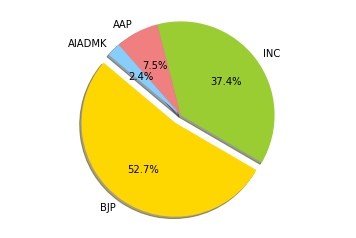

In [154]:
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=True, startangle=140)
 
plt.axis('equal')
plt.show()

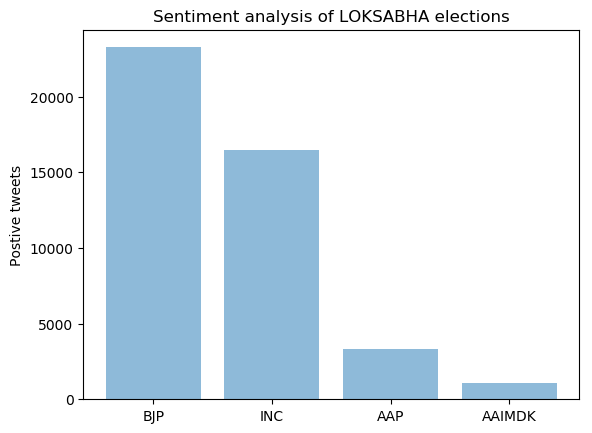

In [155]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
 
objects = ('BJP', 'INC', 'AAP', 'AAIMDK')
y_pos = np.arange(len(objects))
performance = [23256, 16502, 3290, 1058]
 
plt.bar(y_pos, performance, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Postive tweets')
plt.title('Sentiment analysis of LOKSABHA elections')
 
plt.show()

In [166]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt







In [200]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=30,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

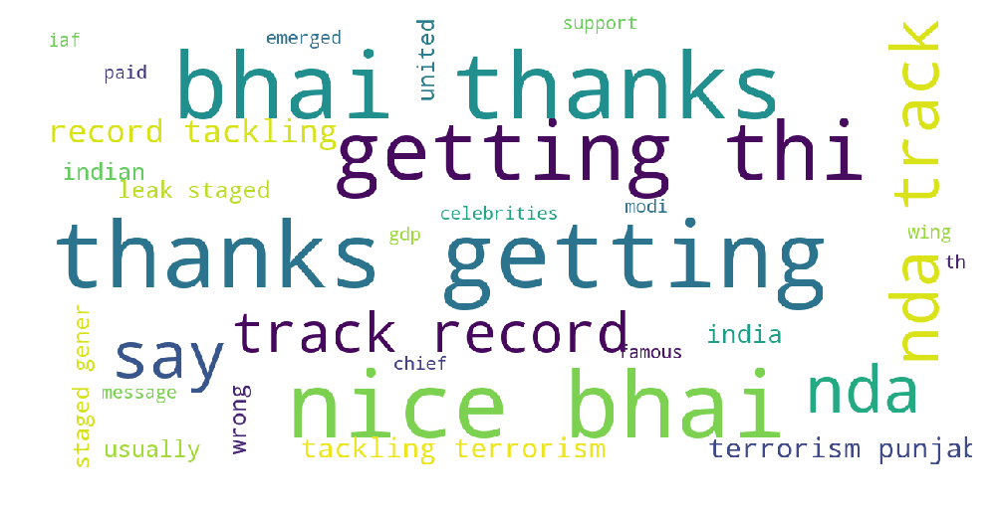

In [201]:
show_wordcloud(data1['Tweet'])

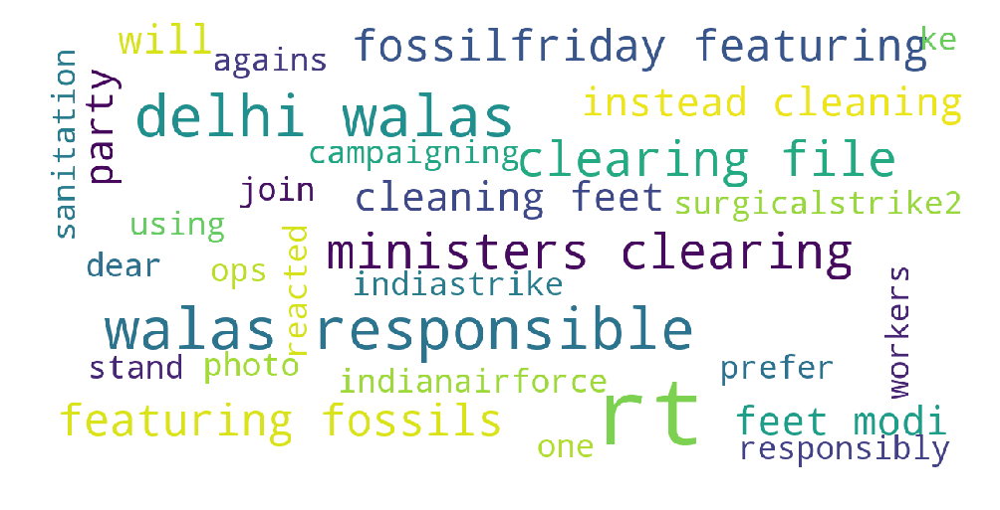

In [202]:
show_wordcloud(data2['Tweet'])

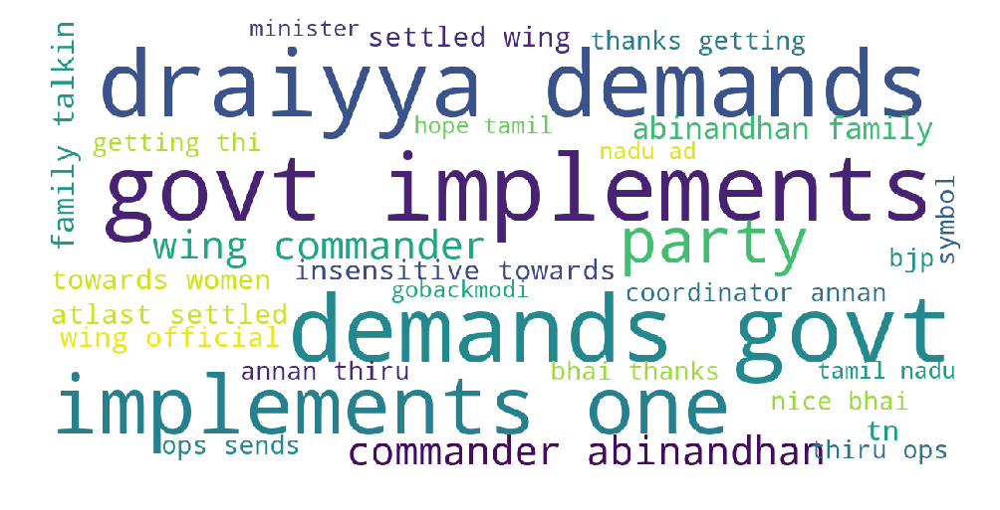

In [203]:
show_wordcloud(data3['Tweet'])

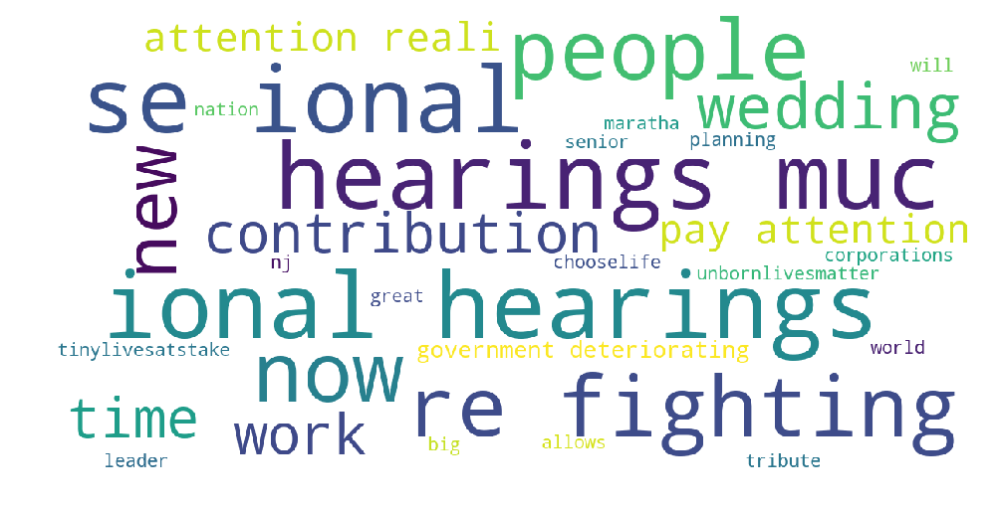

In [205]:
show_wordcloud(data4['Tweet'])

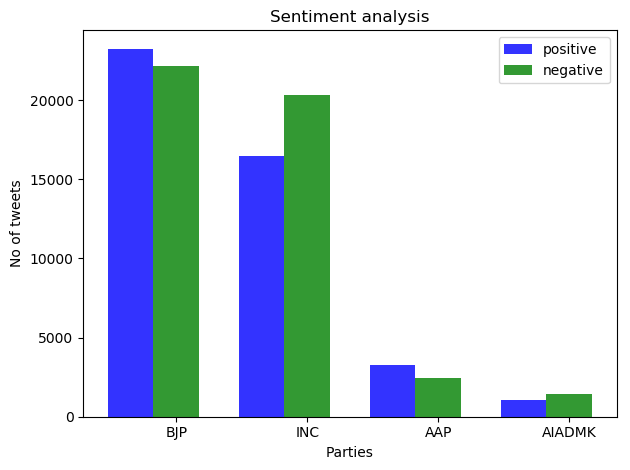

In [207]:
# data to plot
n_groups = 4
positive_tweets = (23256, 16502, 3290, 1058)
negative_tweets = (22157, 20359, 2460, 1425)
 
# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.35
opacity = 0.8
 
rects1 = plt.bar(index, positive_tweets, bar_width,
alpha=opacity,
color='b',
label='positive')
 
rects2 = plt.bar(index + bar_width, negative_tweets, bar_width,
alpha=opacity,
color='g',
label='negative')
 
plt.xlabel('Parties')
plt.ylabel('No of tweets')
plt.title('Sentiment analysis')
plt.xticks(index + bar_width, ('BJP', 'INC', 'AAP', 'AIADMK'))
plt.legend()
 
plt.tight_layout()
plt.show()